<a href="https://colab.research.google.com/github/mehdi-khribch/Probabilistic-Graphical-Models/blob/master/projects.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Estimating Euler's Constant with Monte Carlo Methods

This notebook implements various Monte Carlo techniques for estimating Euler's constant ($\gamma$), comparing their convergence rates and performance.

## Mathematical Introduction

Euler's constant is defined as:

$$\gamma = \lim_{n\to\infty}\left\{\sum_{k=1}^{n}\frac{1}{k} - \log(n)\right\} = \sum_{k=1}^{\infty}\left[\frac{1}{k} - \log\left(1 + \frac{1}{k}\right)\right]$$

It can also be represented as the integral:

$$\gamma = -\int_0^1 \log(-\log x)dx$$


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import time
from scipy import stats
from tqdm.notebook import tqdm

# Set plot style for better visualization
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

# Set random seed for reproducibility
np.random.seed(42)

# True value of Euler's constant for reference
GAMMA_TRUE = 0.57721566490153286060
print(f"True value of Euler's constant: γ = {GAMMA_TRUE:.14f}")

# Helper function to run multiple trials of any estimator
def run_trials(estimator_fn, n_samples, n_trials=20, **kwargs):
    """Run multiple trials of an estimator for statistical analysis"""
    results = []
    times = []

    for _ in range(n_trials):
        start_time = time.time()
        est = estimator_fn(n_samples, **kwargs)
        end_time = time.time()

        # Handle functions that return multiple values
        if isinstance(est, tuple):
            est = est[0]

        results.append(est)
        times.append(end_time - start_time)

    mean_est = np.mean(results)
    std_dev = np.std(results)
    abs_error = abs(mean_est - GAMMA_TRUE)
    avg_time = np.mean(times)

    return mean_est, std_dev, abs_error, avg_time

True value of Euler's constant: γ = 0.57721566490153


# Unbiased Estimation of Euler's Constant Using Importance Sampling

## Problem Statement

Euler's constant is defined as:

$$\gamma = \lim_{n\to\infty} \left\{\sum_{k=1}^{n} \frac{1}{k} - \log(n)\right\} = \sum_{k=1}^{\infty} \left[\frac{1}{k} - \log\left(1 + \frac{1}{k}\right)\right]$$

Our goal is to derive an unbiased estimator for $\gamma$ using importance sampling, with a proposal distribution of the form $X = \left\lceil\frac{c}{U^\alpha}\right\rceil$ where $U \sim \text{Uniform}[0,1]$.

## Step 1: Identifying the Target Function

Let's define $g(k) = \frac{1}{k} - \log\left(1 + \frac{1}{k}\right)$ for $k \geq 1$. Then:

$$\gamma = \sum_{k=1}^{\infty} g(k)$$

To apply importance sampling, we need to express this sum as an expectation with respect to some probability distribution.

## Step 2: Deriving the Distribution of $X = \left\lceil\frac{c}{U^\alpha}\right\rceil$

For any integer $k \geq 1$, the probability mass function of $X$ is:

$$P(X = k) = P\left(k-1 < \frac{c}{U^\alpha} \leq k\right)$$

This can be rewritten as:

$$P(X = k) = P\left(\frac{c}{k} < U^\alpha \leq \frac{c}{k-1}\right)$$

For $k \geq 2$, this becomes:

$$P(X = k) = P\left(\left(\frac{c}{k}\right)^{1/\alpha} < U \leq \left(\frac{c}{k-1}\right)^{1/\alpha}\right)$$

Since $U$ is uniform on $[0,1]$, we have:

$$P(X = k) = \left(\frac{c}{k-1}\right)^{1/\alpha} - \left(\frac{c}{k}\right)^{1/\alpha}$$

For $k = 1$:

$$P(X = 1) = P\left(U^\alpha \leq \frac{c}{0}\right) - P\left(U^\alpha \leq \frac{c}{1}\right) = 1 - \left(\frac{c}{1}\right)^{1/\alpha} = 1 - c^{1/\alpha}$$

This is valid when $c^{1/\alpha} < 1$.

## Step 3: Determining Appropriate Values for $c$ and $\alpha$

For effective importance sampling, the proposal distribution should have similar tail behavior to the target function. Let's analyze $g(k)$ for large $k$.

Using Taylor expansion of $\log(1 + \frac{1}{k})$ for large $k$:

$$\log\left(1 + \frac{1}{k}\right) \approx \frac{1}{k} - \frac{1}{2k^2} + O\left(\frac{1}{k^3}\right)$$

Substituting into $g(k)$:

$$g(k) \approx \frac{1}{k} - \left(\frac{1}{k} - \frac{1}{2k^2} + O\left(\frac{1}{k^3}\right)\right) \approx \frac{1}{2k^2} + O\left(\frac{1}{k^3}\right)$$

So $g(k)$ decays like $\frac{1}{k^2}$ for large $k$.

For large $k$, we can approximate our PMF:

$$P(X = k) \approx \left(\frac{c}{k}\right)^{1/\alpha} \cdot \left[\left(\frac{k}{k-1}\right)^{1/\alpha} - 1\right]$$

Using the approximation $\left(\frac{k}{k-1}\right)^{1/\alpha} \approx 1 + \frac{1}{\alpha(k-1)} \approx 1 + \frac{1}{\alpha k}$ for large $k$:

$$P(X = k) \approx \left(\frac{c}{k}\right)^{1/\alpha} \cdot \frac{1}{\alpha k} \approx \frac{c^{1/\alpha}}{\alpha \cdot k^{1+1/\alpha}}$$

For this to decay like $\frac{1}{k^2}$, we need:

$$1 + \frac{1}{\alpha} = 2$$

Solving for $\alpha$:

$$\frac{1}{\alpha} = 1 \implies \alpha = 1$$

With $\alpha = 1$, the PMF simplifies to:

$$P(X = k) = \frac{c}{k-1} - \frac{c}{k} = \frac{c}{(k-1)k}$$

For this to be a valid PMF, we must have:

$$\sum_{k=1}^{\infty} P(X = k) = 1$$

Note that $P(X = 1) = 0$ when $\alpha = 1$, so:

$$\sum_{k=2}^{\infty} \frac{c}{(k-1)k} = c \sum_{k=2}^{\infty} \left(\frac{1}{k-1} - \frac{1}{k}\right) = c \cdot (1 - 0) = c = 1$$

Therefore, $\alpha = 1$ and $c = 1$ are the optimal choices.

## Step 4: Constructing the Unbiased Estimator

With $\alpha = 1$ and $c = 1$, our random variable is $X = \left\lceil\frac{1}{U}\right\rceil$ with PMF:

$$P(X = k) = \begin{cases}
0 & \text{if } k = 1 \\
\frac{1}{(k-1)k} & \text{if } k \geq 2
\end{cases}$$

Using importance sampling, we can write:

$$\gamma = g(1) + \sum_{k=2}^{\infty} g(k) = g(1) + \sum_{k=2}^{\infty} \frac{g(k)}{P(X=k)} P(X=k) = g(1) + \mathbb{E}_{X}\left[\frac{g(X)}{P(X)}\mathbb{I}(X \geq 2)\right]$$

Where $g(1) = 1 - \log(2) \approx 0.3069$.

For $X \geq 2$, the importance sampling weight is:

$$\frac{g(X)}{P(X)} = \frac{\frac{1}{X} - \log\left(1 + \frac{1}{X}\right)}{\frac{1}{(X-1)X}} = (X-1)X\left[\frac{1}{X} - \log\left(1 + \frac{1}{X}\right)\right] = (X-1)\left[1 - X\log\left(1 + \frac{1}{X}\right)\right]$$

Therefore, our unbiased estimator for $\gamma$ is:

$$\hat{\gamma} = g(1) + (X-1)\left[1 - X\log\left(1 + \frac{1}{X}\right)\right]\mathbb{I}(X \geq 2)$$

where $X = \left\lceil\frac{1}{U}\right\rceil$ and $U \sim \text{Uniform}[0,1]$.

## Conclusion

We have shown that by using importance sampling with the proposal distribution $X = \left\lceil\frac{1}{U}\right\rceil$, we can construct an unbiased estimator for Euler's constant. This approach is mathematically justified because:

1. We identified that $g(k)$ decays like $\frac{1}{k^2}$ for large $k$
2. We found that $\alpha = 1$ and $c = 1$ make our proposal distribution have matching tail behavior
3. The resulting estimator $\hat{\gamma} = g(1) + (X-1)\left[1 - X\log\left(1 + \frac{1}{X}\right)\right]\mathbb{I}(X \geq 2)$ is unbiased for $\gamma$

Running parameter study...

Plotting results...


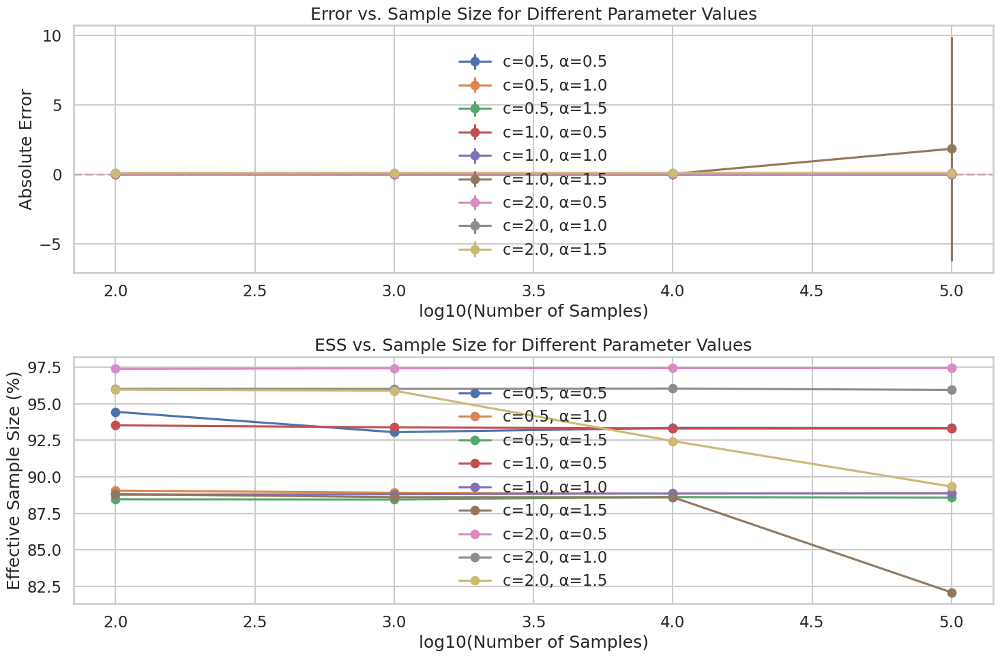

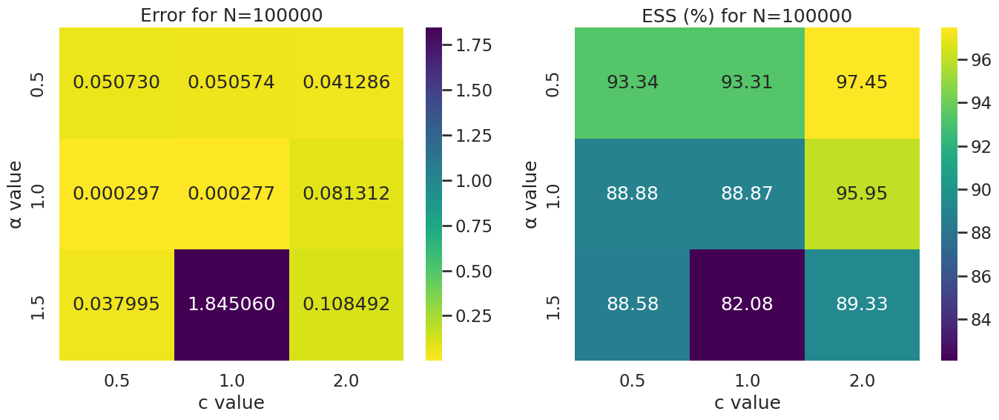

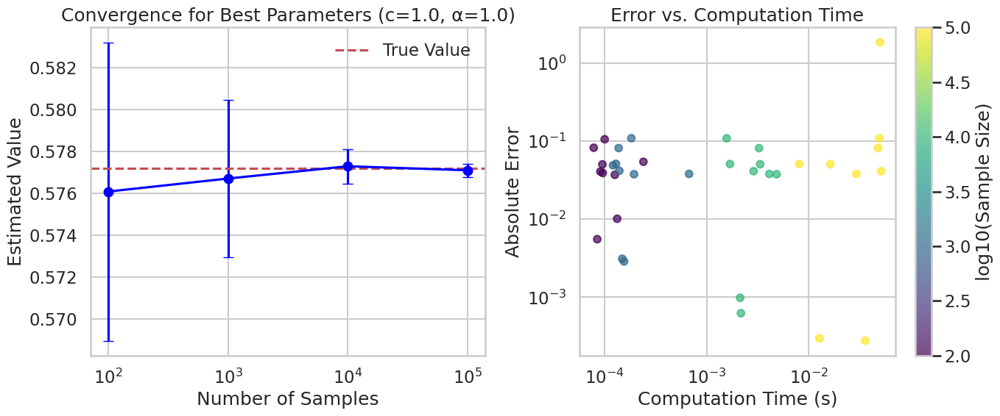

Optimal parameters: c=1.0, α=1.0
Best estimate: 0.577106966828 ± 0.000318083811
True value:    0.577215664902
Error:         0.000276544342
ESS:           88.87%

Benchmarking optimal estimator...


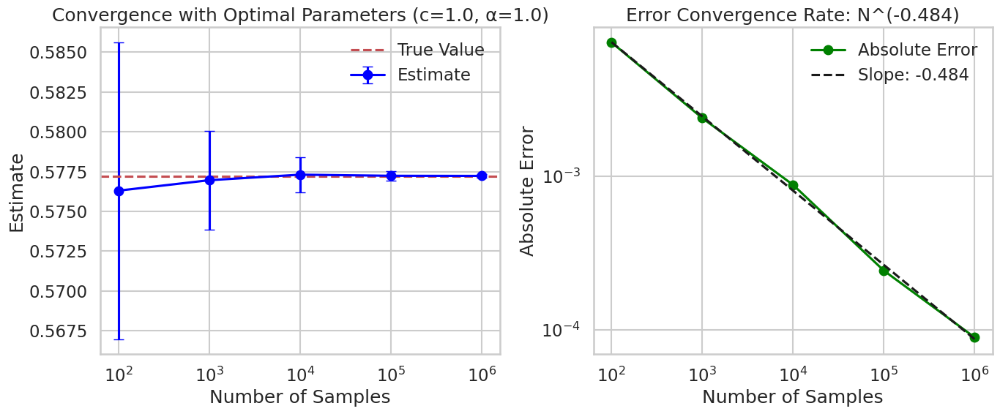

Convergence rate: approximately N^(-0.484)
With 1000000 samples:
  Estimate: 0.577226886153 ± 0.000106648972
  Error:    0.000089270464
  Time:     0.083016 seconds


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import pandas as pd
from joblib import Parallel, delayed

# Set up better plotting style
sns.set_theme(style="whitegrid")
sns.set_context("talk")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100

# True value of Euler's constant (γ) to high precision
EULER_GAMMA = 0.57721566490153286060

def importance_sampling_vectorized(n_samples, c=1.0, alpha=1.0):
    """
    Vectorized implementation of importance sampling for Euler's constant.
    Uses the proposal distribution X = ⌈c/U^α⌉, U ~ U[0,1]

    Parameters:
    - n_samples: Number of samples to draw
    - c: Constant in the proposal distribution
    - alpha: Exponent in the proposal distribution

    Returns:
    - Estimate of Euler's constant
    - ESS (Effective Sample Size) percentage
    """
    # Calculate g(1) term separately
    g_1 = 1.0 - np.log(2.0)

    # Generate samples from the proposal distribution
    u = np.random.random(n_samples)
    x = np.ceil(c / (u ** alpha)).astype(int)

    # Filter out x=1 samples which have zero probability in our PMF
    valid_mask = x >= 2
    x_valid = x[valid_mask]

    if len(x_valid) == 0:
        return g_1, 0.0  # No valid samples

    # Calculate weights directly using the simplified formula from our derivation
    weights = (x_valid - 1) * (1 - x_valid * np.log(1 + 1/x_valid))

    # Calculate ESS percentage
    normalized_weights = weights / np.sum(weights)
    ess_percentage = 100.0 / (len(normalized_weights) * np.sum(normalized_weights**2))

    # Final estimate is g(1) plus the mean of weights
    estimate = g_1 + np.mean(weights)

    return estimate, ess_percentage

def run_trial(estimation_func, n_samples, c, alpha):
    """Single trial wrapper for parallel execution"""
    start_time = time.time()
    estimate, ess = estimation_func(n_samples, c, alpha)
    elapsed_time = time.time() - start_time
    return {
        'estimate': estimate,
        'ess': ess,
        'time': elapsed_time,
        'error': np.abs(estimate - EULER_GAMMA),
        'n_samples': n_samples,
        'c': c,
        'alpha': alpha
    }

def run_parameter_study(n_trials=30, n_jobs=-1):
    """
    Run a comprehensive parameter study varying sample size, c, and alpha

    Parameters:
    - n_trials: Number of trials per parameter combination
    - n_jobs: Number of parallel jobs (-1 means use all processors)

    Returns:
    - DataFrame with all results
    """
    # Parameter combinations to test
    sample_sizes = [100, 1000, 10000, 100000]
    c_values = [0.5, 1.0, 2.0]
    alpha_values = [0.5, 1.0, 1.5]

    # Generate all parameter combinations
    param_combinations = []
    for n in sample_sizes:
        for c in c_values:
            for alpha in alpha_values:
                for _ in range(n_trials):
                    param_combinations.append((n, c, alpha))

    # Run trials in parallel
    results = Parallel(n_jobs=n_jobs)(
        delayed(run_trial)(importance_sampling_vectorized, n, c, alpha)
        for n, c, alpha in param_combinations
    )

    # Convert results to DataFrame
    return pd.DataFrame(results)

def plot_results(results_df):
    """
    Create visualizations for the parameter study results

    Parameters:
    - results_df: DataFrame with experiment results
    """
    # Compute summary statistics by parameter combination
    summary = results_df.groupby(['n_samples', 'c', 'alpha']).agg({
        'estimate': ['mean', 'std'],
        'error': ['mean', 'std'],
        'ess': 'mean',
        'time': 'mean'
    }).reset_index()

    # Flatten the multi-level column names
    summary.columns = ['_'.join(col).strip('_') for col in summary.columns.values]

    # Create figure for errors across different parameters
    plt.figure(figsize=(15, 10))

    # Plot 1: Error vs. Sample Size grouped by c and alpha
    plt.subplot(2, 1, 1)
    for c in results_df['c'].unique():
        for alpha in results_df['alpha'].unique():
            data = summary[(summary['c'] == c) & (summary['alpha'] == alpha)]
            plt.errorbar(
                x=np.log10(data['n_samples']),
                y=data['error_mean'],
                yerr=data['error_std'],
                fmt='o-',
                label=f'c={c}, α={alpha}'
            )

    plt.xlabel('log10(Number of Samples)')
    plt.ylabel('Absolute Error')
    plt.title('Error vs. Sample Size for Different Parameter Values')
    plt.axhline(y=0, color='r', linestyle='--', alpha=0.3)
    plt.legend(loc='best')

    # Plot 2: ESS vs. Sample Size grouped by c and alpha
    plt.subplot(2, 1, 2)
    for c in results_df['c'].unique():
        for alpha in results_df['alpha'].unique():
            data = summary[(summary['c'] == c) & (summary['alpha'] == alpha)]
            plt.plot(
                np.log10(data['n_samples']),
                data['ess_mean'],
                'o-',
                label=f'c={c}, α={alpha}'
            )

    plt.xlabel('log10(Number of Samples)')
    plt.ylabel('Effective Sample Size (%)')
    plt.title('ESS vs. Sample Size for Different Parameter Values')
    plt.legend(loc='best')

    plt.tight_layout()

    # Create a heatmap for optimal parameter selection
    plt.figure(figsize=(14, 6))

    # Filter for largest sample size to focus on asymptotic behavior
    largest_n = summary['n_samples'].max()
    large_sample_data = summary[summary['n_samples'] == largest_n]

    # Reshape data for heatmaps
    error_pivot = large_sample_data.pivot_table(
        index='alpha',
        columns='c',
        values='error_mean'
    )

    ess_pivot = large_sample_data.pivot_table(
        index='alpha',
        columns='c',
        values='ess_mean'
    )

    # Plot error heatmap
    plt.subplot(1, 2, 1)
    sns.heatmap(error_pivot, annot=True, fmt='.6f', cmap='viridis_r')
    plt.title(f'Error for N={largest_n}')
    plt.xlabel('c value')
    plt.ylabel('α value')

    # Plot ESS heatmap
    plt.subplot(1, 2, 2)
    sns.heatmap(ess_pivot, annot=True, fmt='.2f', cmap='viridis')
    plt.title(f'ESS (%) for N={largest_n}')
    plt.xlabel('c value')
    plt.ylabel('α value')

    plt.tight_layout()

    # Create combined visualization for the optimal parameter set
    best_params = large_sample_data.loc[large_sample_data['error_mean'].idxmin()]
    best_c = best_params['c']
    best_alpha = best_params['alpha']

    plt.figure(figsize=(14, 6))

    # Get data for best parameters
    best_data = summary[(summary['c'] == best_c) & (summary['alpha'] == best_alpha)]

    # Plot convergence for optimal parameters
    plt.subplot(1, 2, 1)
    plt.errorbar(
        x=best_data['n_samples'],
        y=best_data['estimate_mean'],
        yerr=best_data['estimate_std'],
        fmt='o-',
        color='blue',
        capsize=5
    )
    plt.axhline(y=EULER_GAMMA, color='r', linestyle='--', label='True Value')
    plt.xscale('log')
    plt.xlabel('Number of Samples')
    plt.ylabel('Estimated Value')
    plt.title(f'Convergence for Best Parameters (c={best_c}, α={best_alpha})')
    plt.legend()
    plt.grid(True)

    # Plot efficiency (time vs. error) for all parameter combinations
    plt.subplot(1, 2, 2)
    scatter = plt.scatter(
        summary['time_mean'],
        summary['error_mean'],
        c=np.log10(summary['n_samples']),
        s=50,
        alpha=0.7,
        cmap='viridis'
    )
    plt.colorbar(scatter, label='log10(Sample Size)')
    plt.xlabel('Computation Time (s)')
    plt.ylabel('Absolute Error')
    plt.title('Error vs. Computation Time')
    plt.yscale('log')
    plt.xscale('log')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    # Return the optimal parameters
    print(f"Optimal parameters: c={best_c}, α={best_alpha}")
    print(f"Best estimate: {best_params['estimate_mean']:.12f} ± {best_params['estimate_std']:.12f}")
    print(f"True value:    {EULER_GAMMA:.12f}")
    print(f"Error:         {best_params['error_mean']:.12f}")
    print(f"ESS:           {best_params['ess_mean']:.2f}%")

    return best_c, best_alpha

def benchmark_optimal_estimator(best_c, best_alpha, sample_sizes=None, n_trials=100):
    """
    Benchmark the estimator with the optimal parameters

    Parameters:
    - best_c: Optimal c value
    - best_alpha: Optimal alpha value
    - sample_sizes: List of sample sizes to test
    - n_trials: Number of trials per sample size

    Returns:
    - DataFrame with benchmark results
    """
    if sample_sizes is None:
        sample_sizes = [100, 1000, 10000, 100000, 1000000]

    # Generate parameter combinations for the benchmark
    param_combinations = []
    for n in sample_sizes:
        for _ in range(n_trials):
            param_combinations.append((n, best_c, best_alpha))

    # Run trials in parallel
    results = Parallel(n_jobs=-1)(
        delayed(run_trial)(importance_sampling_vectorized, n, c, alpha)
        for n, c, alpha in param_combinations
    )

    # Convert results to DataFrame
    benchmark_df = pd.DataFrame(results)

    # Compute summary statistics
    summary = benchmark_df.groupby('n_samples').agg({
        'estimate': ['mean', 'std'],
        'error': ['mean', 'std'],
        'ess': 'mean',
        'time': 'mean'
    }).reset_index()

    # Flatten the multi-level column names
    summary.columns = ['_'.join(col).strip('_') for col in summary.columns.values]

    # Create convergence plot for optimal parameters
    plt.figure(figsize=(14, 6))

    # Plot 1: Estimates with standard deviation
    plt.subplot(1, 2, 1)
    plt.errorbar(
        summary['n_samples'],
        summary['estimate_mean'],
        yerr=summary['estimate_std'],
        fmt='o-',
        capsize=5,
        color='blue',
        label='Estimate'
    )
    plt.axhline(y=EULER_GAMMA, color='r', linestyle='--', label='True Value')
    plt.xscale('log')
    plt.xlabel('Number of Samples')
    plt.ylabel('Estimate')
    plt.title(f'Convergence with Optimal Parameters (c={best_c}, α={best_alpha})')
    plt.legend()
    plt.grid(True)

    # Plot 2: Log-log plot of error vs. sample size
    plt.subplot(1, 2, 2)
    plt.loglog(
        summary['n_samples'],
        summary['error_mean'],
        'o-',
        color='green',
        label='Absolute Error'
    )

    # Fit a power law to the error curve
    log_n = np.log(summary['n_samples'])
    log_error = np.log(summary['error_mean'])
    coeffs = np.polyfit(log_n, log_error, 1)
    rate = coeffs[0]

    # Plot the fitted line
    x_fit = np.array([min(summary['n_samples']), max(summary['n_samples'])])
    y_fit = np.exp(coeffs[1]) * x_fit**rate
    plt.loglog(x_fit, y_fit, 'k--', label=f'Slope: {rate:.3f}')

    plt.xlabel('Number of Samples')
    plt.ylabel('Absolute Error')
    plt.title(f'Error Convergence Rate: N^({rate:.3f})')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    print(f"Convergence rate: approximately N^({rate:.3f})")
    print(f"With {summary['n_samples'].max()} samples:")
    print(f"  Estimate: {summary['estimate_mean'].iloc[-1]:.12f} ± {summary['estimate_std'].iloc[-1]:.12f}")
    print(f"  Error:    {summary['error_mean'].iloc[-1]:.12f}")
    print(f"  Time:     {summary['time_mean'].iloc[-1]:.6f} seconds")

    return summary

if __name__ == "__main__":
    print("Running parameter study...")
    results = run_parameter_study(n_trials=20)

    print("\nPlotting results...")
    best_c, best_alpha = plot_results(results)

    print("\nBenchmarking optimal estimator...")
    benchmark_optimal_estimator(best_c, best_alpha)

## 2. Integral Representation Methods

### 2.1 Standard Monte Carlo

Using the integral representation $\gamma = -\int_0^1 \log(-\log x)dx$, we can apply standard Monte Carlo integration.

The standard MC estimator is:
$$\hat{\gamma} = \frac{1}{n} \sum_{i=1}^n [-\log(-\log U_i)]$$

where $U_i \sim U[0,1]$ are independent uniform random variables.

The variance of this estimator decays as $O(1/n)$, with convergence rate $O(1/\sqrt{n})$ according to the central limit theorem.

### 2.2 Stratified Monte Carlo

Stratified Monte Carlo partitions the integration domain to reduce variance. We divide $[0,1]$ into $k$ strata of equal width $\Delta = 1/k$, and sample $m = n/k$ points from each stratum:

$$\hat{\gamma} = \frac{1}{k} \sum_{j=1}^k \left[\frac{1}{m} \sum_{i=1}^m (-\log(-\log U_{ij}))\right]$$

where $U_{ij} = \frac{j-1}{k} + \left(\frac{j}{k} - \frac{j-1}{k}\right) V_{ij}$ with $V_{ij} \sim U[0,1]$.

Stratification reduces the variance by ensuring better coverage of the integration domain. For smooth integrands, it can improve the convergence rate to approach $O(1/n)$ as the number of strata increases.

### 2.3 Quasi-Monte Carlo

Quasi-Monte Carlo replaces random sampling with deterministic low-discrepancy sequences that provide more uniform coverage of the integration domain:

$$\hat{\gamma} = \frac{1}{n} \sum_{i=1}^n [-\log(-\log x_i)]$$

where $x_i$ are points from a low-discrepancy sequence like van der Corput or Sobol.

The key advantage of QMC is its improved convergence rate: $O((log n)^d/n)$ for $d$-dimensional problems, asymptotically better than the $O(1/\sqrt{n})$ of standard MC.

The van der Corput sequence in base $b$ is constructed by:
1. Take the index $i$ in base $b$ representation
2. Reverse the digits
3. Place a decimal point in front

For example, in base 2:
- 1 → 0.1
- 2 → 0.01
- 3 → 0.11
- 4 → 0.001
- etc.

These sequences ensure more uniform coverage of the integration domain compared to pseudo-random numbers.

## 3. Control Variates

Control variates can improve Monte Carlo estimates by exploiting correlation with a simpler function whose expectation is known.

For estimating $\gamma$ using the integral representation, we note that $\log(x) \approx x - 1$ for $x \to 1$, which suggests using $\log(1-U)$ with $U \sim U[0,1]$ as a control variate.

The control variate estimator is:
$$\hat{\gamma}_{cv} = \frac{1}{n}\sum_{i=1}^n [-\log(-\log U_i)] - \beta \cdot [\log(1-U_i) - \mathbb{E}[\log(1-U)]]$$

where $\mathbb{E}[\log(1-U)] = -1$ and $\beta$ is chosen to minimize the variance.

The optimal $\beta$ is given by:
$$\beta = \frac{Cov(f(U), g(U))}{Var(g(U))}$$

where $f(U) = -\log(-\log U)$ and $g(U) = \log(1-U)$.

Control variates preserve the $O(1/\sqrt{n})$ convergence rate but can substantially reduce the constant factor in the error term.

Analyzing integrand properties...


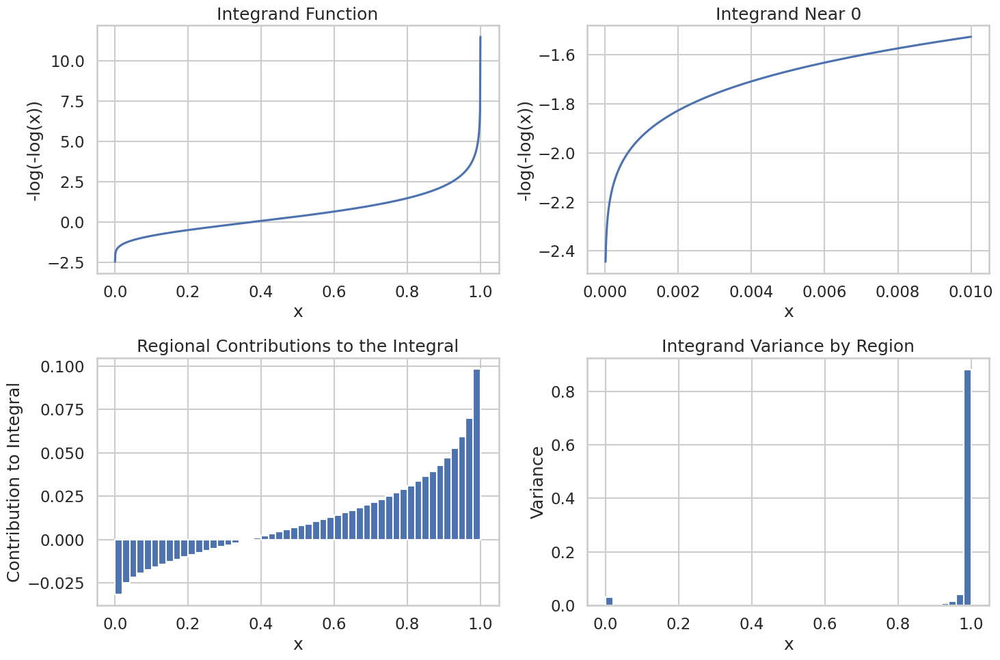


Running convergence study...

Analyzing results...


/usr/local/lib/python3.11/dist-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Results with 100000 samples (sorted by error):
Method               | Estimate        | Error           | Std Error       | Conv. Rate      | Time (s)  
----------------------------------------------------------------------------------------------------
Sobol QMC            | 0.577212793693  | 0.000016895877  | 0.000162149402  | -0.932          | 0.013745  
Halton QMC           | 0.577177448233  | 0.000069368149  | 0.000221971610  | -0.905          | 0.096701  
Stratified MC        | 0.577293980236  | 0.000164893570  | 0.000189911646  | -0.757          | 0.030273  
van der Corput       | 0.576975728338  | 0.000239936564  | 0.000199060113  | -0.817          | 1.225954  
Control Variates     | 0.576987916338  | 0.000582814592  | 0.000793970229  | -0.557          | 0.010504  
Standard MC          | 0.578268630635  | 0.003611663501  | 0.004055222404  | -0.459          | 0.006378  

Convergence Rates (slope of log(error) vs log(n)):
Method               | Rate       | Expected Rate   | Rela

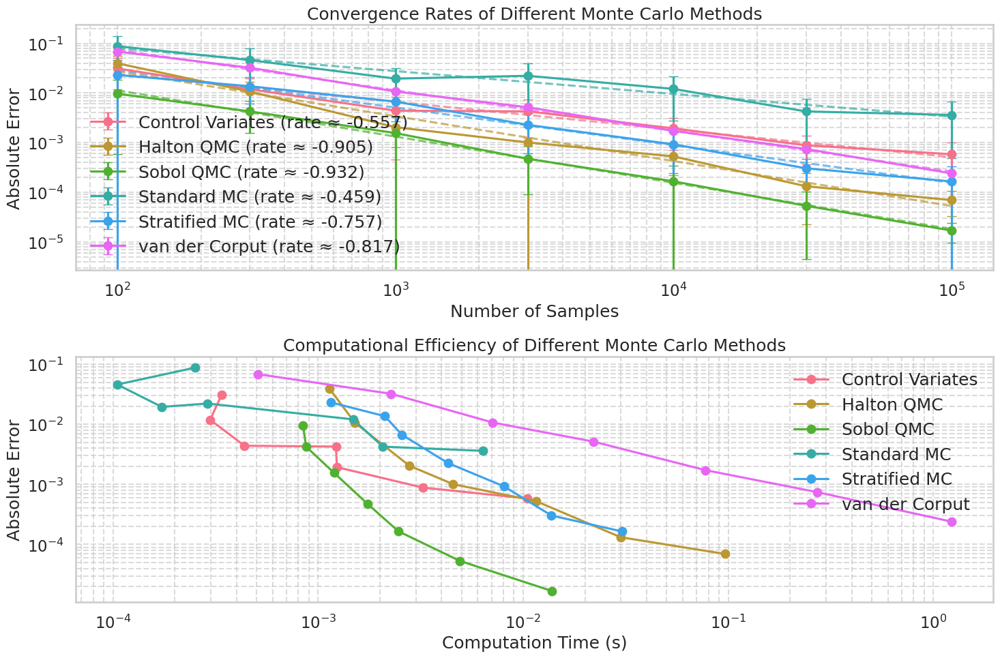

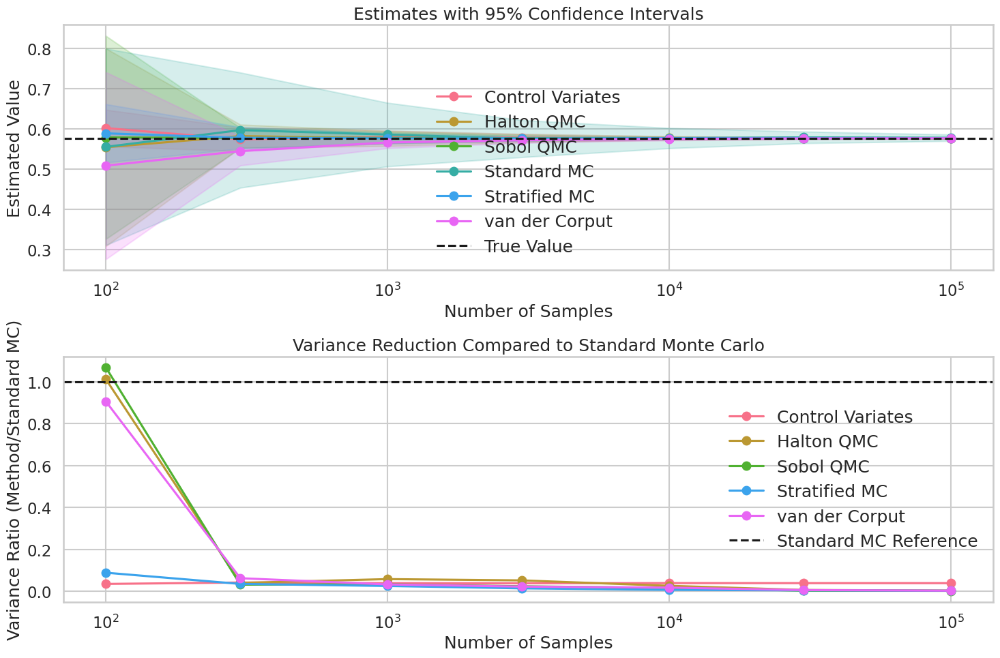

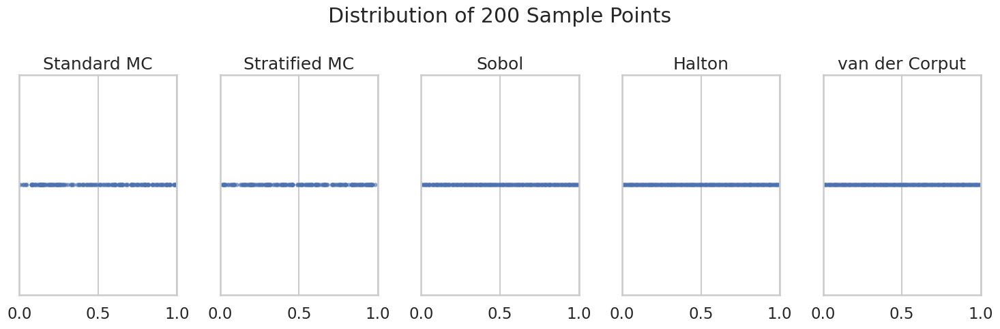

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import time
from joblib import Parallel, delayed
from scipy.stats import qmc

# Set up plotting style
sns.set_theme(style="whitegrid")
sns.set_context("talk")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100

# True value of Euler's constant (γ) to high precision
EULER_GAMMA = 0.57721566490153286060

# Define the integrand function f(x) = -log(-log(x))
def integrand(x):
    """Calculate -log(-log(x)) with handling for boundary values"""
    # Handle potential numerical issues near 0 or 1
    safe_x = np.clip(x, 1e-15, 1.0 - 1e-15)
    return -np.log(-np.log(safe_x))

def standard_monte_carlo(n_samples):
    """
    Standard Monte Carlo estimation of Euler's constant.

    Parameters:
    - n_samples: Number of random points to use

    Returns:
    - estimate: Estimated value of Euler's constant
    - var_estimate: Estimated variance of the estimator
    """
    # Generate uniform random numbers
    u = np.random.random(n_samples)

    # Evaluate the integrand
    f_values = integrand(u)

    # Calculate the estimate and its variance
    estimate = np.mean(f_values)
    var_estimate = np.var(f_values, ddof=1) / n_samples

    return estimate, var_estimate

def stratified_monte_carlo(n_samples):
    """
    Stratified Monte Carlo estimation of Euler's constant.

    Parameters:
    - n_samples: Total number of sample points to use

    Returns:
    - estimate: Estimated value of Euler's constant
    - var_estimate: Estimated variance of the estimator
    """
    # Determine number of strata - use sqrt(n) as a reasonable heuristic
    n_strata = max(10, int(np.sqrt(n_samples)))
    samples_per_stratum = n_samples // n_strata

    # Create the strata
    strata_bounds = np.linspace(0, 1, n_strata + 1)
    strata_widths = np.diff(strata_bounds)

    # Sample from each stratum
    estimates = np.zeros(n_strata)
    variances = np.zeros(n_strata)

    for i in range(n_strata):
        # Generate uniform random numbers within the stratum
        v_ij = np.random.random(samples_per_stratum)
        u_ij = strata_bounds[i] + strata_widths[i] * v_ij

        # Evaluate the integrand
        f_values = integrand(u_ij)

        # Calculate the stratum estimate and variance
        estimates[i] = np.mean(f_values)
        variances[i] = np.var(f_values, ddof=1) / samples_per_stratum if samples_per_stratum > 1 else 0

    # Combine the estimates from all strata
    estimate = np.sum(strata_widths * estimates)
    var_estimate = np.sum(strata_widths**2 * variances)

    return estimate, var_estimate

def quasi_monte_carlo(n_samples, sequence_type='sobol'):
    """
    Quasi-Monte Carlo estimation using low-discrepancy sequences.

    Parameters:
    - n_samples: Number of points to use
    - sequence_type: Type of low-discrepancy sequence ('sobol', 'halton', or 'van_der_corput')

    Returns:
    - estimate: Estimated value of Euler's constant
    - var_estimate: Approximate variance estimate (using batching)
    """
    # Generate low-discrepancy sequence
    if sequence_type == 'sobol':
        sampler = qmc.Sobol(d=1, scramble=True)
        u = sampler.random(n_samples).flatten()
    elif sequence_type == 'halton':
        sampler = qmc.Halton(d=1, scramble=True)
        u = sampler.random(n_samples).flatten()
    elif sequence_type == 'van_der_corput':
        # Implement van der Corput sequence in base 2
        u = np.zeros(n_samples)
        for i in range(n_samples):
            # Convert index to binary representation and reverse
            binary = bin(i+1)[2:]  # Skip '0b' prefix
            reversed_binary = binary[::-1]

            # Convert to decimal with leading decimal point
            decimal_value = 0
            for j, bit in enumerate(reversed_binary):
                decimal_value += int(bit) * 2**-(j+1)

            u[i] = decimal_value
    else:
        raise ValueError(f"Unknown sequence type: {sequence_type}")

    # Evaluate the integrand
    f_values = integrand(u)

    # Calculate the estimate
    estimate = np.mean(f_values)

    # Variance estimation using batching (divide samples into batches)
    n_batches = min(30, n_samples // 100)  # Use at least 100 samples per batch
    if n_batches > 1:
        batch_size = n_samples // n_batches
        batch_estimates = []
        for i in range(n_batches):
            start_idx = i * batch_size
            end_idx = start_idx + batch_size
            batch_u = u[start_idx:end_idx]
            batch_f = integrand(batch_u)
            batch_estimates.append(np.mean(batch_f))
        var_estimate = np.var(batch_estimates, ddof=1) / n_batches
    else:
        # If batching not possible, use a rough approximation
        var_estimate = np.var(f_values, ddof=1) / n_samples

    return estimate, var_estimate

def control_variates_monte_carlo(n_samples):
    """
    Monte Carlo estimation with control variates to reduce variance.

    For Euler's constant, we use log(1-U) as a control variate,
    which has a known expectation of -1.

    Parameters:
    - n_samples: Number of samples to use

    Returns:
    - estimate: Estimated value of Euler's constant
    - var_estimate: Estimated variance of the estimator
    """
    # Generate uniform random numbers
    u = np.random.random(n_samples)

    # Evaluate the primary integrand f(U) = -log(-log(U))
    f_values = integrand(u)

    # Control variate: g(U) = log(1-U) with E[g(U)] = -1
    g_values = np.log(1.0 - u)
    g_expected = -1.0

    # Calculate optimal beta coefficient
    cov_fg = np.cov(f_values, g_values)[0, 1]
    var_g = np.var(g_values, ddof=1)
    beta_opt = cov_fg / var_g

    # Apply control variate adjustment
    f_adjusted = f_values - beta_opt * (g_values - g_expected)

    # Calculate the estimate and its variance
    estimate = np.mean(f_adjusted)
    var_estimate = np.var(f_adjusted, ddof=1) / n_samples

    return estimate, var_estimate

def run_trial(estimation_method, n_samples, method_name=None, **kwargs):
    """Single trial wrapper for parallel execution"""
    start_time = time.time()
    estimate, var_estimate = estimation_method(n_samples, **kwargs)
    elapsed_time = time.time() - start_time

    return {
        'method': method_name or estimation_method.__name__,
        'n_samples': n_samples,
        'estimate': estimate,
        'variance': var_estimate,
        'std_error': np.sqrt(var_estimate),
        'error': np.abs(estimate - EULER_GAMMA),
        'time': elapsed_time
    }

def run_convergence_study(n_trials=10, n_jobs=-1):
    """
    Run a convergence study comparing different Monte Carlo methods

    Parameters:
    - n_trials: Number of trials per method and sample size
    - n_jobs: Number of parallel jobs

    Returns:
    - DataFrame with all results
    """
    # Methods to evaluate
    methods = [
        (standard_monte_carlo, "Standard MC", {}),
        (stratified_monte_carlo, "Stratified MC", {}),
        (control_variates_monte_carlo, "Control Variates", {}),
        (quasi_monte_carlo, "Sobol QMC", {'sequence_type': 'sobol'}),
        (quasi_monte_carlo, "Halton QMC", {'sequence_type': 'halton'}),
        (quasi_monte_carlo, "van der Corput", {'sequence_type': 'van_der_corput'})
    ]

    # Sample sizes to test (exponentially increasing)
    sample_sizes = [100, 300, 1000, 3000, 10000, 30000, 100000]

    # Generate all parameter combinations
    param_combinations = []
    for n in sample_sizes:
        for method, method_name, kwargs in methods:
            for _ in range(n_trials):
                param_combinations.append((method, n, method_name, kwargs))

    # Run trials in parallel
    results = Parallel(n_jobs=n_jobs)(
        delayed(run_trial)(method, n, method_name, **kwargs)
        for method, n, method_name, kwargs in param_combinations
    )

    # Convert results to DataFrame
    return pd.DataFrame(results)

def estimate_convergence_rate(data):
    """
    Estimate the convergence rate as the slope of log(error) vs log(n_samples)

    Parameters:
    - data: DataFrame with 'n_samples' and 'error_mean' columns

    Returns:
    - rate: Estimated convergence rate
    - log_constant: Log of the proportionality constant
    """
    log_n = np.log(data['n_samples'])
    log_error = np.log(data['error_mean'])

    # Linear regression on log-log scale
    coeffs = np.polyfit(log_n, log_error, 1)
    rate = coeffs[0]
    log_constant = coeffs[1]

    return rate, log_constant

def plot_convergence_results(results_df):
    """
    Create visualizations for the convergence study results

    Parameters:
    - results_df: DataFrame with experiment results
    """
    # Compute summary statistics by method and sample size
    summary = results_df.groupby(['method', 'n_samples']).agg({
        'estimate': ['mean', 'std'],
        'error': ['mean', 'std'],
        'variance': 'mean',
        'time': 'mean'
    }).reset_index()

    # Flatten the multi-level column names
    summary.columns = ['_'.join(col).strip('_') for col in summary.columns.values]

    # Estimate convergence rates for each method
    methods = summary['method'].unique()
    convergence_rates = {}

    for method in methods:
        method_data = summary[summary['method'] == method]
        rate, log_constant = estimate_convergence_rate(method_data)
        convergence_rates[method] = (rate, log_constant)

    # Create figure for errors across different methods
    plt.figure(figsize=(15, 10))

    # Plot 1: Error vs. Sample Size (log-log scale)
    plt.subplot(2, 1, 1)

    # Custom color palette with distinct colors
    palette = sns.color_palette("husl", len(methods))
    colors = {method: color for method, color in zip(methods, palette)}

    for method in methods:
        data = summary[summary['method'] == method]
        rate, log_constant = convergence_rates[method]

        # Plot empirical errors
        plt.errorbar(
            data['n_samples'],
            data['error_mean'],
            yerr=data['error_std'],
            fmt='o-',
            label=f"{method} (rate ≈ {rate:.3f})",
            color=colors[method],
            capsize=5
        )

        # Plot fitted convergence line
        x_fit = np.array([min(data['n_samples']), max(data['n_samples'])])
        y_fit = np.exp(log_constant) * x_fit**rate
        plt.plot(x_fit, y_fit, '--', color=colors[method], alpha=0.7)

    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Number of Samples')
    plt.ylabel('Absolute Error')
    plt.title('Convergence Rates of Different Monte Carlo Methods')
    plt.legend(loc='best', fontsize='medium')
    plt.grid(True, which="both", ls="--", alpha=0.7)

    # Plot 2: Efficiency (Time vs. Error)
    plt.subplot(2, 1, 2)

    for method in methods:
        data = summary[summary['method'] == method]
        plt.loglog(
            data['time_mean'],
            data['error_mean'],
            'o-',
            label=method,
            color=colors[method]
        )

    plt.xlabel('Computation Time (s)')
    plt.ylabel('Absolute Error')
    plt.title('Computational Efficiency of Different Monte Carlo Methods')
    plt.legend(loc='best', fontsize='medium')
    plt.grid(True, which="both", ls="--", alpha=0.7)

    plt.tight_layout()

    # Create detailed comparison plots
    plt.figure(figsize=(15, 10))

    # Plot 1: Estimated values with confidence intervals
    plt.subplot(2, 1, 1)

    for method in methods:
        data = summary[summary['method'] == method]

        # Calculate 95% confidence intervals
        z_score = 1.96  # 95% confidence
        ci_lower = data['estimate_mean'] - z_score * np.sqrt(data['variance_mean'])
        ci_upper = data['estimate_mean'] + z_score * np.sqrt(data['variance_mean'])

        plt.fill_between(
            data['n_samples'],
            ci_lower,
            ci_upper,
            alpha=0.2,
            color=colors[method]
        )

        plt.semilogx(
            data['n_samples'],
            data['estimate_mean'],
            'o-',
            label=method,
            color=colors[method]
        )

    plt.axhline(y=EULER_GAMMA, color='k', linestyle='--', label='True Value')
    plt.xlabel('Number of Samples')
    plt.ylabel('Estimated Value')
    plt.title('Estimates with 95% Confidence Intervals')
    plt.legend(loc='best', fontsize='medium')
    plt.grid(True)

    # Plot 2: Normalized variance reduction
    plt.subplot(2, 1, 2)

    # Get standard MC data for normalization
    std_mc_data = summary[summary['method'] == 'Standard MC']
    std_mc_var = std_mc_data.set_index('n_samples')['variance_mean']

    for method in methods:
        if method == 'Standard MC':
            continue

        data = summary[summary['method'] == method]

        # Match sample sizes and calculate variance reduction ratio
        var_reduction = []
        n_samples_list = []

        for n in data['n_samples']:
            if n in std_mc_var.index:
                var_ratio = data[data['n_samples'] == n]['variance_mean'].values[0] / std_mc_var[n]
                var_reduction.append(var_ratio)
                n_samples_list.append(n)

        if var_reduction:
            plt.semilogx(
                n_samples_list,
                var_reduction,
                'o-',
                label=method,
                color=colors[method]
            )

    plt.axhline(y=1.0, color='k', linestyle='--', label='Standard MC Reference')
    plt.xlabel('Number of Samples')
    plt.ylabel('Variance Ratio (Method/Standard MC)')
    plt.title('Variance Reduction Compared to Standard Monte Carlo')
    plt.legend(loc='best', fontsize='medium')
    plt.grid(True)

    plt.tight_layout()

    # Plot sample distributions for one small example
    plt.figure(figsize=(15, 5))
    n_viz = 200  # Number of points to visualize

    # Generate points from each method
    u_standard = np.random.random(n_viz)

    # Stratified
    n_strata_viz = 10
    u_stratified = np.zeros(n_viz)
    points_per_stratum = n_viz // n_strata_viz
    for i in range(n_strata_viz):
        strata_start = i / n_strata_viz
        strata_end = (i + 1) / n_strata_viz
        u_stratified[i*points_per_stratum:(i+1)*points_per_stratum] = strata_start + (strata_end - strata_start) * np.random.random(points_per_stratum)

    # Quasi-random
    sobol = qmc.Sobol(d=1, scramble=True)
    u_sobol = sobol.random(n_viz).flatten()

    halton = qmc.Halton(d=1, scramble=True)
    u_halton = halton.random(n_viz).flatten()

    # Van der Corput
    u_vdc = np.zeros(n_viz)
    for i in range(n_viz):
        binary = bin(i+1)[2:]
        reversed_binary = binary[::-1]
        decimal_value = 0
        for j, bit in enumerate(reversed_binary):
            decimal_value += int(bit) * 2**-(j+1)
        u_vdc[i] = decimal_value

    # Plot the point distributions
    plt.subplot(1, 5, 1)
    plt.scatter(u_standard, np.zeros_like(u_standard), alpha=0.5, s=10)
    plt.title('Standard MC')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.subplot(1, 5, 2)
    plt.scatter(u_stratified, np.zeros_like(u_stratified), alpha=0.5, s=10)
    plt.title('Stratified MC')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.subplot(1, 5, 3)
    plt.scatter(u_sobol, np.zeros_like(u_sobol), alpha=0.5, s=10)
    plt.title('Sobol')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.subplot(1, 5, 4)
    plt.scatter(u_halton, np.zeros_like(u_halton), alpha=0.5, s=10)
    plt.title('Halton')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.subplot(1, 5, 5)
    plt.scatter(u_vdc, np.zeros_like(u_vdc), alpha=0.5, s=10)
    plt.title('van der Corput')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.suptitle(f'Distribution of {n_viz} Sample Points')
    plt.tight_layout()

    # Show tables of results
    largest_n = summary['n_samples'].max()
    large_sample_results = summary[summary['n_samples'] == largest_n].sort_values('error_mean')

    print(f"Results with {largest_n} samples (sorted by error):")
    print("=" * 100)
    print(f"{'Method':<20} | {'Estimate':<15} | {'Error':<15} | {'Std Error':<15} | {'Conv. Rate':<15} | {'Time (s)':<10}")
    print("-" * 100)

    for _, row in large_sample_results.iterrows():
        method = row['method']
        rate, _ = convergence_rates[method]

        print(f"{method:<20} | {row['estimate_mean']:<15.12f} | {row['error_mean']:<15.12f} | "
              f"{np.sqrt(row['variance_mean']):<15.12f} | {rate:<15.3f} | {row['time_mean']:<10.6f}")

    print("=" * 100)

    # Show convergence rates
    print("\nConvergence Rates (slope of log(error) vs log(n)):")
    print("=" * 60)
    print(f"{'Method':<20} | {'Rate':<10} | {'Expected Rate':<15} | {'Relative Efficiency':<20}")
    print("-" * 60)

    # Theoretical rates for reference
    theoretical_rates = {
        'Standard MC': -0.5,
        'Stratified MC': -0.5 - 0.5/1,  # For d=1, rate is -0.5-0.5/d
        'Control Variates': -0.5,  # Same asymptotic rate but better constant
        'Sobol QMC': -1.0,  # Theoretical rate for QMC
        'Halton QMC': -1.0,  # Theoretical rate for QMC
        'van der Corput': -1.0  # Theoretical rate for QMC
    }

    # Sort by empirical rate
    sorted_methods = sorted(convergence_rates.items(), key=lambda x: abs(x[1][0]), reverse=True)

    for method, (rate, _) in sorted_methods:
        theo_rate = theoretical_rates.get(method, 'N/A')
        # Calculate relative efficiency compared to standard MC
        # If rate1 = -0.5 and rate2 = -1.0, then to achieve error ε:
        # Method 1 needs n1 = O(ε^(-2)) samples
        # Method 2 needs n2 = O(ε^(-1)) samples
        # Relative efficiency = n1/n2 = O(ε^(-2)/ε^(-1)) = O(ε^(-1))
        if method != 'Standard MC' and rate != 0:
            rel_efficiency = f"O(ε^({(-0.5/rate):.1f}))"
        else:
            rel_efficiency = "Reference"

        print(f"{method:<20} | {rate:<10.3f} | {theo_rate:<15} | {rel_efficiency:<20}")

    plt.show()

    return convergence_rates

def analyze_integrand():
    """Analyze the properties of the integrand function"""
    x = np.linspace(0.00001, 0.99999, 1000)
    y = integrand(x)

    plt.figure(figsize=(15, 10))

    # Plot the integrand
    plt.subplot(2, 2, 1)
    plt.plot(x, y)
    plt.xlabel('x')
    plt.ylabel('-log(-log(x))')
    plt.title('Integrand Function')
    plt.grid(True)

    # Plot the integrand near 0 (where it's challenging)
    plt.subplot(2, 2, 2)
    x_small = np.linspace(0.00001, 0.01, 1000)
    y_small = integrand(x_small)
    plt.plot(x_small, y_small)
    plt.xlabel('x')
    plt.ylabel('-log(-log(x))')
    plt.title('Integrand Near 0')
    plt.grid(True)

    # Calculate and plot the absolute contribution to the integral
    # by each region of the domain
    plt.subplot(2, 2, 3)

    # Create strata
    n_strata = 50
    strata_bounds = np.linspace(0, 1, n_strata + 1)
    strata_centers = (strata_bounds[:-1] + strata_bounds[1:]) / 2
    strata_widths = np.diff(strata_bounds)

    # Generate points in each stratum
    points_per_stratum = 1000
    strata_integrals = []

    for i in range(n_strata):
        low = strata_bounds[i]
        high = strata_bounds[i+1]
        x_strata = low + (high - low) * np.random.random(points_per_stratum)
        y_strata = integrand(x_strata)
        strata_integrals.append(np.mean(y_strata) * (high - low))

    plt.bar(strata_centers, strata_integrals, width=1/n_strata)
    plt.xlabel('x')
    plt.ylabel('Contribution to Integral')
    plt.title('Regional Contributions to the Integral')
    plt.grid(True)

    # Plot the variance of the integrand in each region
    plt.subplot(2, 2, 4)

    strata_variances = []
    for i in range(n_strata):
        low = strata_bounds[i]
        high = strata_bounds[i+1]
        x_strata = low + (high - low) * np.random.random(points_per_stratum)
        y_strata = integrand(x_strata)
        strata_variances.append(np.var(y_strata))

    plt.bar(strata_centers, strata_variances, width=1/n_strata)
    plt.xlabel('x')
    plt.ylabel('Variance')
    plt.title('Integrand Variance by Region')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Analyze the properties of the integrand
    print("Analyzing integrand properties...")
    analyze_integrand()

    # Run the convergence study
    print("\nRunning convergence study...")
    results = run_convergence_study(n_trials=10)

    # Plot and analyze results
    print("\nAnalyzing results...")
    convergence_rates = plot_convergence_results(results)

Analyzing integrand properties...


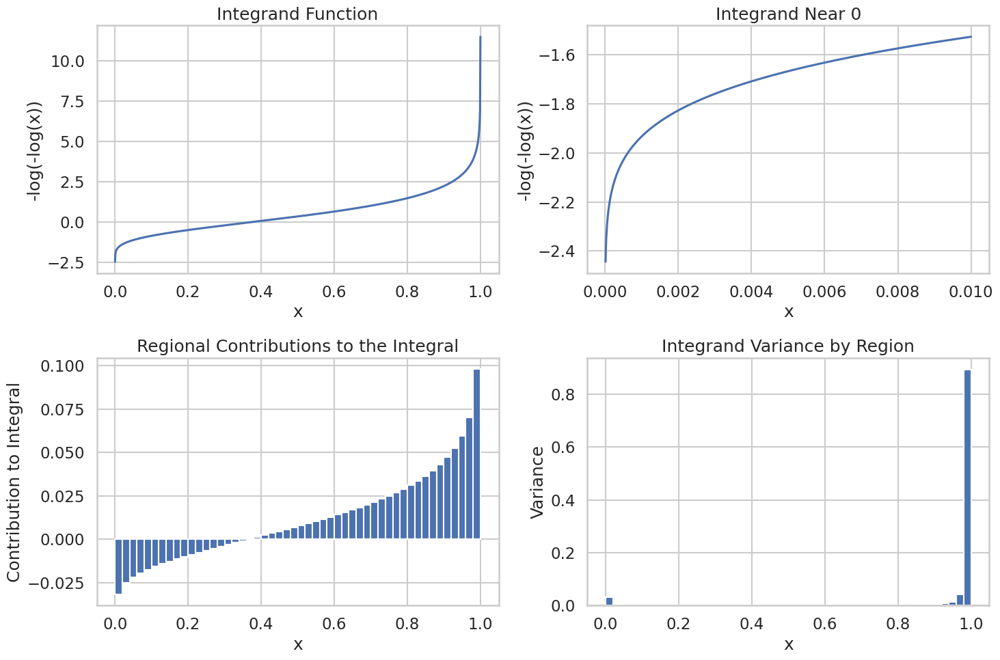


Running convergence study...

Analyzing results...


/usr/local/lib/python3.11/dist-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Results with 100000 samples (sorted by error):
Method               | Estimate        | Error           | Std Error       | Conv. Rate      | Time (s)  
----------------------------------------------------------------------------------------------------
Sobol QMC            | 0.577228979616  | 0.000021910306  | 0.000166249330  | -0.872          | 0.013782  
Halton QMC           | 0.577229495612  | 0.000038148830  | 0.000223567388  | -0.918          | 0.128713  
van der Corput       | 0.576975728338  | 0.000239936564  | 0.000199060113  | -0.817          | 1.126925  
Stratified MC        | 0.577235501467  | 0.000251391418  | 0.000192180880  | -0.720          | 0.029372  
Control Variates     | 0.576805597024  | 0.000561387349  | 0.000794677112  | -0.485          | 0.011296  
Standard MC          | 0.576970484667  | 0.004338423559  | 0.004057807583  | -0.463          | 0.006525  

Convergence Rates (slope of log(error) vs log(n)):
Method               | Rate       | Expected Rate   | Rela

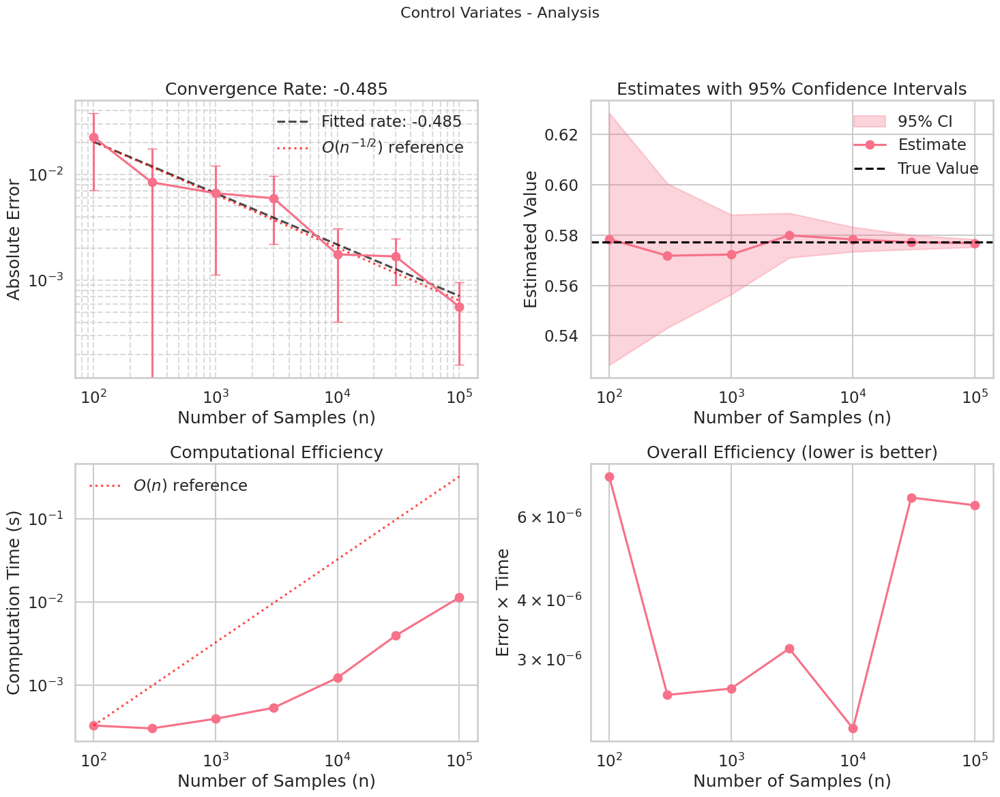

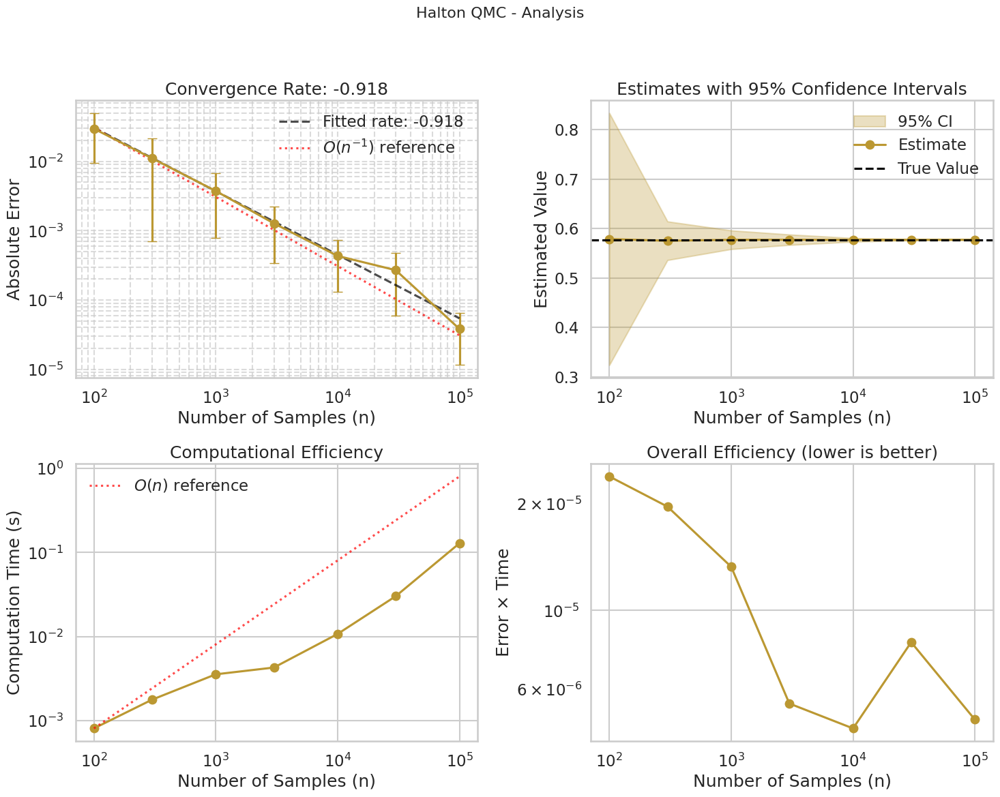

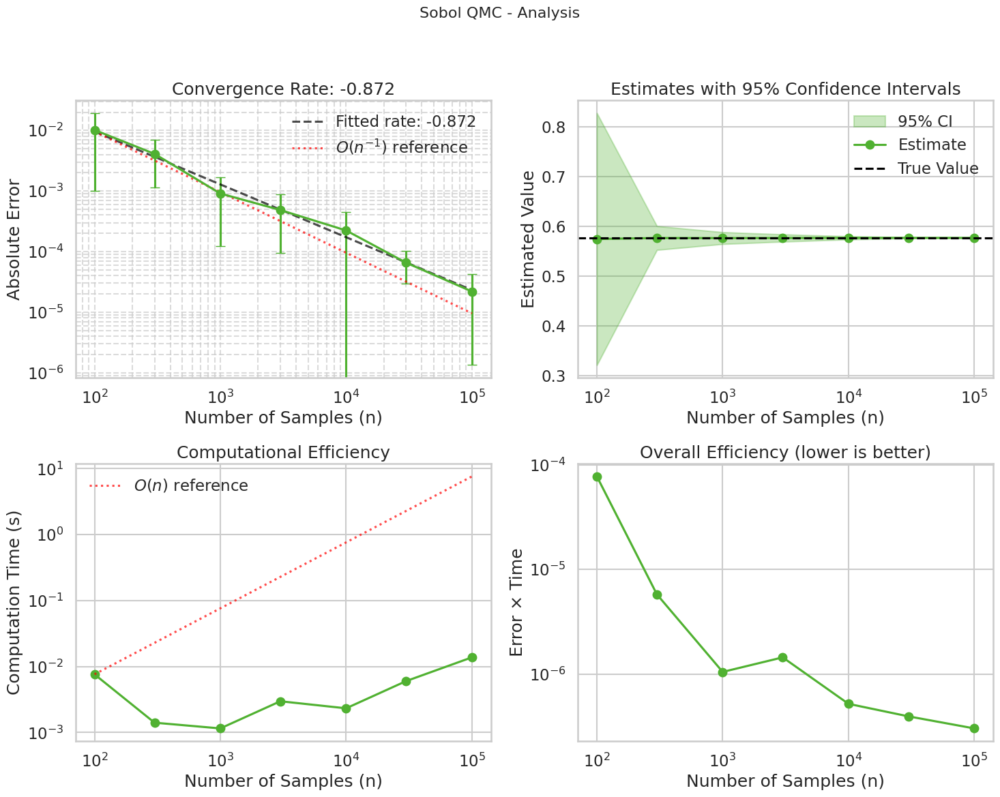

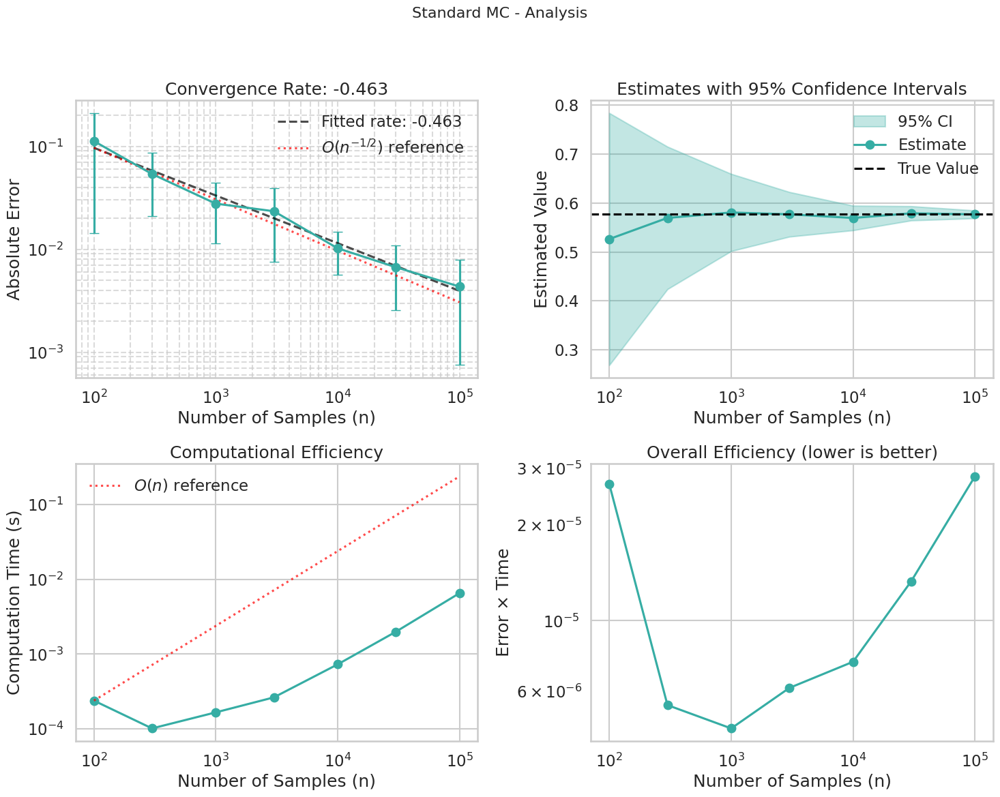

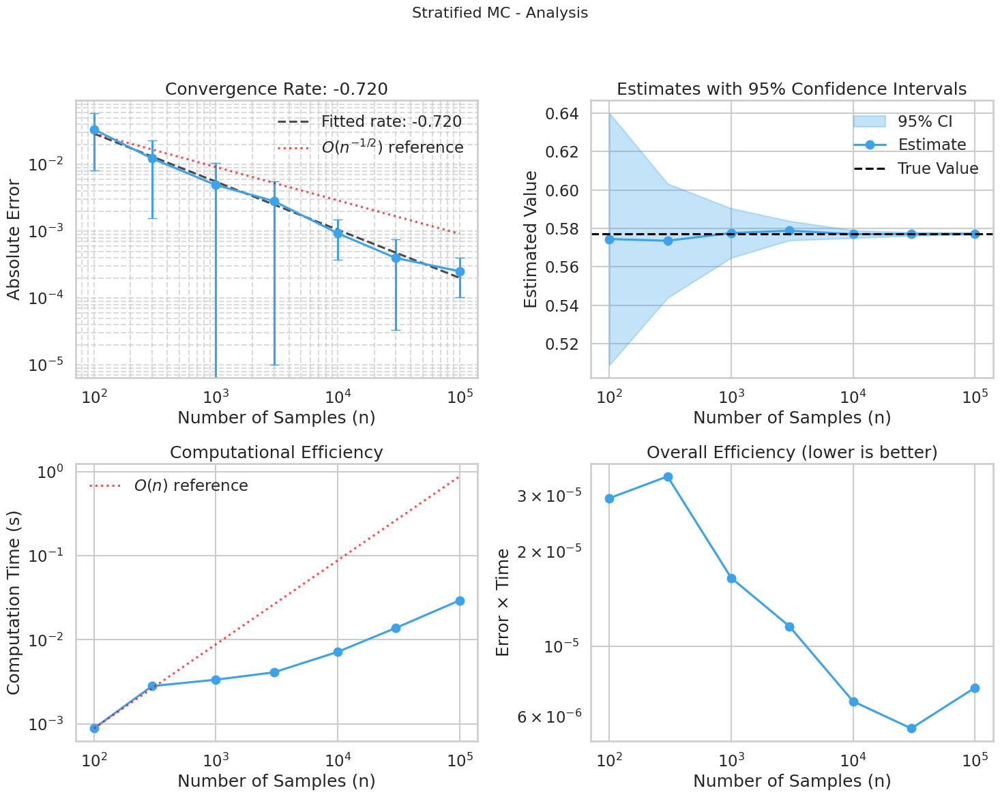

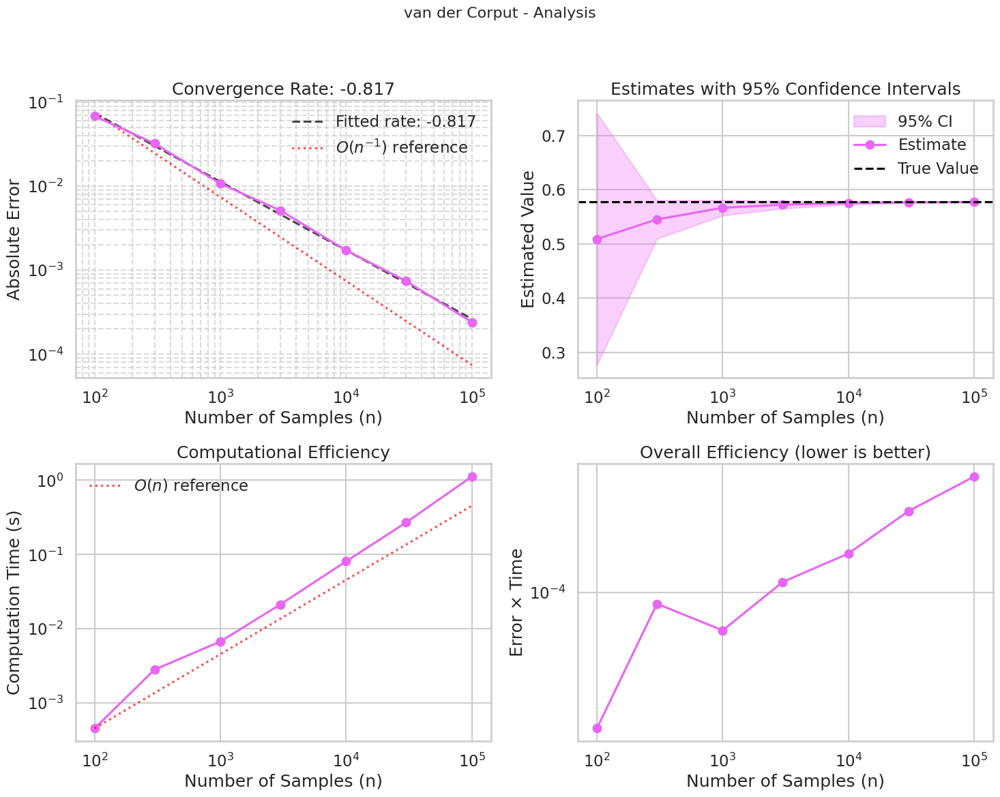

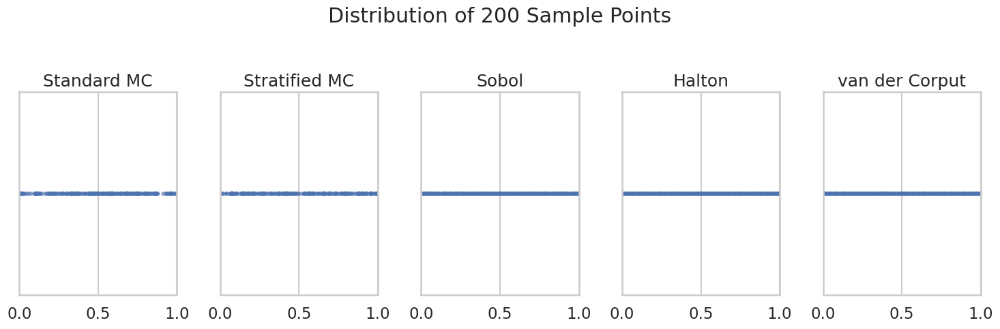

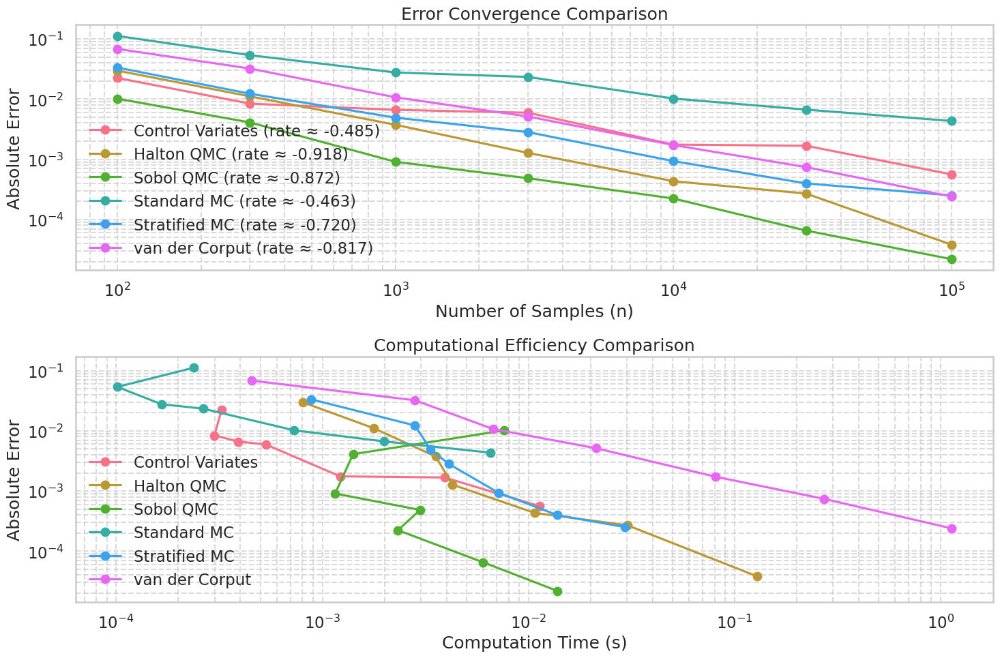

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import time
from joblib import Parallel, delayed
from scipy.stats import qmc

# Set up plotting style
sns.set_theme(style="whitegrid")
sns.set_context("talk")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100

# True value of Euler's constant (γ) to high precision
EULER_GAMMA = 0.57721566490153286060

# Define the integrand function f(x) = -log(-log(x))
def integrand(x):
    """Calculate -log(-log(x)) with handling for boundary values"""
    # Handle potential numerical issues near 0 or 1
    safe_x = np.clip(x, 1e-15, 1.0 - 1e-15)
    return -np.log(-np.log(safe_x))

def standard_monte_carlo(n_samples):
    """
    Standard Monte Carlo estimation of Euler's constant.

    Parameters:
    - n_samples: Number of random points to use

    Returns:
    - estimate: Estimated value of Euler's constant
    - var_estimate: Estimated variance of the estimator
    """
    # Generate uniform random numbers
    u = np.random.random(n_samples)

    # Evaluate the integrand
    f_values = integrand(u)

    # Calculate the estimate and its variance
    estimate = np.mean(f_values)
    var_estimate = np.var(f_values, ddof=1) / n_samples

    return estimate, var_estimate

def stratified_monte_carlo(n_samples):
    """
    Stratified Monte Carlo estimation of Euler's constant.

    Parameters:
    - n_samples: Total number of sample points to use

    Returns:
    - estimate: Estimated value of Euler's constant
    - var_estimate: Estimated variance of the estimator
    """
    # Determine number of strata - use sqrt(n) as a reasonable heuristic
    n_strata = max(10, int(np.sqrt(n_samples)))
    samples_per_stratum = n_samples // n_strata

    # Create the strata
    strata_bounds = np.linspace(0, 1, n_strata + 1)
    strata_widths = np.diff(strata_bounds)

    # Sample from each stratum
    estimates = np.zeros(n_strata)
    variances = np.zeros(n_strata)

    for i in range(n_strata):
        # Generate uniform random numbers within the stratum
        v_ij = np.random.random(samples_per_stratum)
        u_ij = strata_bounds[i] + strata_widths[i] * v_ij

        # Evaluate the integrand
        f_values = integrand(u_ij)

        # Calculate the stratum estimate and variance
        estimates[i] = np.mean(f_values)
        variances[i] = np.var(f_values, ddof=1) / samples_per_stratum if samples_per_stratum > 1 else 0

    # Combine the estimates from all strata
    estimate = np.sum(strata_widths * estimates)
    var_estimate = np.sum(strata_widths**2 * variances)

    return estimate, var_estimate

def quasi_monte_carlo(n_samples, sequence_type='sobol'):
    """
    Quasi-Monte Carlo estimation using low-discrepancy sequences.

    Parameters:
    - n_samples: Number of points to use
    - sequence_type: Type of low-discrepancy sequence ('sobol', 'halton', or 'van_der_corput')

    Returns:
    - estimate: Estimated value of Euler's constant
    - var_estimate: Approximate variance estimate (using batching)
    """
    # Generate low-discrepancy sequence
    if sequence_type == 'sobol':
        sampler = qmc.Sobol(d=1, scramble=True)
        u = sampler.random(n_samples).flatten()
    elif sequence_type == 'halton':
        sampler = qmc.Halton(d=1, scramble=True)
        u = sampler.random(n_samples).flatten()
    elif sequence_type == 'van_der_corput':
        # Implement van der Corput sequence in base 2
        u = np.zeros(n_samples)
        for i in range(n_samples):
            # Convert index to binary representation and reverse
            binary = bin(i+1)[2:]  # Skip '0b' prefix
            reversed_binary = binary[::-1]

            # Convert to decimal with leading decimal point
            decimal_value = 0
            for j, bit in enumerate(reversed_binary):
                decimal_value += int(bit) * 2**-(j+1)

            u[i] = decimal_value
    else:
        raise ValueError(f"Unknown sequence type: {sequence_type}")

    # Evaluate the integrand
    f_values = integrand(u)

    # Calculate the estimate
    estimate = np.mean(f_values)

    # Variance estimation using batching (divide samples into batches)
    n_batches = min(30, n_samples // 100)  # Use at least 100 samples per batch
    if n_batches > 1:
        batch_size = n_samples // n_batches
        batch_estimates = []
        for i in range(n_batches):
            start_idx = i * batch_size
            end_idx = start_idx + batch_size
            batch_u = u[start_idx:end_idx]
            batch_f = integrand(batch_u)
            batch_estimates.append(np.mean(batch_f))
        var_estimate = np.var(batch_estimates, ddof=1) / n_batches
    else:
        # If batching not possible, use a rough approximation
        var_estimate = np.var(f_values, ddof=1) / n_samples

    return estimate, var_estimate

def control_variates_monte_carlo(n_samples):
    """
    Monte Carlo estimation with control variates to reduce variance.

    For Euler's constant, we use log(1-U) as a control variate,
    which has a known expectation of -1.

    Parameters:
    - n_samples: Number of samples to use

    Returns:
    - estimate: Estimated value of Euler's constant
    - var_estimate: Estimated variance of the estimator
    """
    # Generate uniform random numbers
    u = np.random.random(n_samples)

    # Evaluate the primary integrand f(U) = -log(-log(U))
    f_values = integrand(u)

    # Control variate: g(U) = log(1-U) with E[g(U)] = -1
    g_values = np.log(1.0 - u)
    g_expected = -1.0

    # Calculate optimal beta coefficient
    cov_fg = np.cov(f_values, g_values)[0, 1]
    var_g = np.var(g_values, ddof=1)
    beta_opt = cov_fg / var_g

    # Apply control variate adjustment
    f_adjusted = f_values - beta_opt * (g_values - g_expected)

    # Calculate the estimate and its variance
    estimate = np.mean(f_adjusted)
    var_estimate = np.var(f_adjusted, ddof=1) / n_samples

    return estimate, var_estimate

def run_trial(estimation_method, n_samples, method_name=None, **kwargs):
    """Single trial wrapper for parallel execution"""
    start_time = time.time()
    estimate, var_estimate = estimation_method(n_samples, **kwargs)
    elapsed_time = time.time() - start_time

    return {
        'method': method_name or estimation_method.__name__,
        'n_samples': n_samples,
        'estimate': estimate,
        'variance': var_estimate,
        'std_error': np.sqrt(var_estimate),
        'error': np.abs(estimate - EULER_GAMMA),
        'time': elapsed_time
    }

def run_convergence_study(n_trials=10, n_jobs=-1):
    """
    Run a convergence study comparing different Monte Carlo methods

    Parameters:
    - n_trials: Number of trials per method and sample size
    - n_jobs: Number of parallel jobs

    Returns:
    - DataFrame with all results
    """
    # Methods to evaluate
    methods = [
        (standard_monte_carlo, "Standard MC", {}),
        (stratified_monte_carlo, "Stratified MC", {}),
        (control_variates_monte_carlo, "Control Variates", {}),
        (quasi_monte_carlo, "Sobol QMC", {'sequence_type': 'sobol'}),
        (quasi_monte_carlo, "Halton QMC", {'sequence_type': 'halton'}),
        (quasi_monte_carlo, "van der Corput", {'sequence_type': 'van_der_corput'})
    ]

    # Sample sizes to test (exponentially increasing)
    sample_sizes = [100, 300, 1000, 3000, 10000, 30000, 100000]

    # Generate all parameter combinations
    param_combinations = []
    for n in sample_sizes:
        for method, method_name, kwargs in methods:
            for _ in range(n_trials):
                param_combinations.append((method, n, method_name, kwargs))

    # Run trials in parallel
    results = Parallel(n_jobs=n_jobs)(
        delayed(run_trial)(method, n, method_name, **kwargs)
        for method, n, method_name, kwargs in param_combinations
    )

    # Convert results to DataFrame
    return pd.DataFrame(results)

def estimate_convergence_rate(data):
    """
    Estimate the convergence rate as the slope of log(error) vs log(n_samples)

    Parameters:
    - data: DataFrame with 'n_samples' and 'error_mean' columns

    Returns:
    - rate: Estimated convergence rate
    - log_constant: Log of the proportionality constant
    """
    log_n = np.log(data['n_samples'])
    log_error = np.log(data['error_mean'])

    # Linear regression on log-log scale
    coeffs = np.polyfit(log_n, log_error, 1)
    rate = coeffs[0]
    log_constant = coeffs[1]

    return rate, log_constant

def plot_convergence_results(results_df):
    """
    Create visualizations for the convergence study results

    Parameters:
    - results_df: DataFrame with experiment results
    """
    # Compute summary statistics by method and sample size
    summary = results_df.groupby(['method', 'n_samples']).agg({
        'estimate': ['mean', 'std'],
        'error': ['mean', 'std'],
        'variance': 'mean',
        'time': 'mean'
    }).reset_index()

    # Flatten the multi-level column names
    summary.columns = ['_'.join(col).strip('_') for col in summary.columns.values]

    # Estimate convergence rates for each method
    methods = summary['method'].unique()
    convergence_rates = {}

    for method in methods:
        method_data = summary[summary['method'] == method]
        rate, log_constant = estimate_convergence_rate(method_data)
        convergence_rates[method] = (rate, log_constant)

    # Custom color palette with distinct colors
    palette = sns.color_palette("husl", len(methods))
    colors = {method: color for method, color in zip(methods, palette)}

    # Create individual plots for each method
    for method in methods:
        data = summary[summary['method'] == method]
        rate, log_constant = convergence_rates[method]
        color = colors[method]

        # Create a figure for this method
        plt.figure(figsize=(15, 12))
        plt.suptitle(f"{method} - Analysis", fontsize=16)

        # Plot 1: Convergence rate (error vs. n_samples)
        plt.subplot(2, 2, 1)
        # Plot empirical errors
        plt.errorbar(
            data['n_samples'],
            data['error_mean'],
            yerr=data['error_std'],
            fmt='o-',
            color=color,
            capsize=5
        )

        # Plot fitted convergence line
        x_fit = np.array([min(data['n_samples']), max(data['n_samples'])])
        y_fit = np.exp(log_constant) * x_fit**rate
        plt.plot(x_fit, y_fit, '--', color='black', alpha=0.7,
                 label=f"Fitted rate: {rate:.3f}")

        # Add reference slopes for comparison
        if method == 'Standard MC' or method == 'Control Variates' or method == 'Stratified MC':
            # Add reference O(n^(-1/2)) line
            ref_y = y_fit[0] * (x_fit / x_fit[0])**(-0.5)
            plt.plot(x_fit, ref_y, ':', color='red', alpha=0.7,
                     label=r"$O(n^{-1/2})$ reference")
        else:
            # Add reference O(n^(-1)) line for QMC
            ref_y = y_fit[0] * (x_fit / x_fit[0])**(-1.0)
            plt.plot(x_fit, ref_y, ':', color='red', alpha=0.7,
                     label=r"$O(n^{-1})$ reference")

        plt.xscale('log')
        plt.yscale('log')
        plt.xlabel('Number of Samples (n)')
        plt.ylabel('Absolute Error')
        plt.title(f'Convergence Rate: {rate:.3f}')
        plt.legend()
        plt.grid(True, which="both", ls="--", alpha=0.7)

        # Plot 2: Estimates with confidence intervals
        plt.subplot(2, 2, 2)

        # Calculate 95% confidence intervals
        z_score = 1.96  # 95% confidence
        ci_lower = data['estimate_mean'] - z_score * np.sqrt(data['variance_mean'])
        ci_upper = data['estimate_mean'] + z_score * np.sqrt(data['variance_mean'])

        plt.fill_between(
            data['n_samples'],
            ci_lower,
            ci_upper,
            alpha=0.3,
            color=color,
            label='95% CI'
        )

        plt.plot(
            data['n_samples'],
            data['estimate_mean'],
            'o-',
            color=color,
            label='Estimate'
        )

        plt.axhline(y=EULER_GAMMA, color='black', linestyle='--', label='True Value')
        plt.xscale('log')
        plt.xlabel('Number of Samples (n)')
        plt.ylabel('Estimated Value')
        plt.title('Estimates with 95% Confidence Intervals')
        plt.legend()
        plt.grid(True)

        # Plot 3: Computation time
        plt.subplot(2, 2, 3)
        plt.plot(
            data['n_samples'],
            data['time_mean'],
            'o-',
            color=color
        )
        plt.xscale('log')
        plt.yscale('log')
        plt.xlabel('Number of Samples (n)')
        plt.ylabel('Computation Time (s)')
        plt.title('Computational Efficiency')

        # Add a reference O(n) line
        ref_time = data['time_mean'].iloc[0] * (data['n_samples'] / data['n_samples'].iloc[0])
        plt.plot(data['n_samples'], ref_time, ':', color='red', alpha=0.7,
                 label=r"$O(n)$ reference")
        plt.legend()
        plt.grid(True)

        # Plot 4: Error × Time (efficiency metric)
        plt.subplot(2, 2, 4)
        efficiency = data['error_mean'] * data['time_mean']
        plt.plot(
            data['n_samples'],
            efficiency,
            'o-',
            color=color
        )
        plt.xscale('log')
        plt.yscale('log')
        plt.xlabel('Number of Samples (n)')
        plt.ylabel('Error × Time')
        plt.title('Overall Efficiency (lower is better)')
        plt.grid(True)

        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust for suptitle

    # Plot sample distributions for visual comparison
    plt.figure(figsize=(15, 5))
    n_viz = 200  # Number of points to visualize

    # Generate points from each method
    u_standard = np.random.random(n_viz)

    # Stratified
    n_strata_viz = 10
    u_stratified = np.zeros(n_viz)
    points_per_stratum = n_viz // n_strata_viz
    for i in range(n_strata_viz):
        strata_start = i / n_strata_viz
        strata_end = (i + 1) / n_strata_viz
        u_stratified[i*points_per_stratum:(i+1)*points_per_stratum] = strata_start + (strata_end - strata_start) * np.random.random(points_per_stratum)

    # Quasi-random
    sobol = qmc.Sobol(d=1, scramble=True)
    u_sobol = sobol.random(n_viz).flatten()

    halton = qmc.Halton(d=1, scramble=True)
    u_halton = halton.random(n_viz).flatten()

    # Van der Corput
    u_vdc = np.zeros(n_viz)
    for i in range(n_viz):
        binary = bin(i+1)[2:]
        reversed_binary = binary[::-1]
        decimal_value = 0
        for j, bit in enumerate(reversed_binary):
            decimal_value += int(bit) * 2**-(j+1)
        u_vdc[i] = decimal_value

    # Plot the point distributions
    plt.subplot(1, 5, 1)
    plt.scatter(u_standard, np.zeros_like(u_standard), alpha=0.5, s=10)
    plt.title('Standard MC')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.subplot(1, 5, 2)
    plt.scatter(u_stratified, np.zeros_like(u_stratified), alpha=0.5, s=10)
    plt.title('Stratified MC')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.subplot(1, 5, 3)
    plt.scatter(u_sobol, np.zeros_like(u_sobol), alpha=0.5, s=10)
    plt.title('Sobol')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.subplot(1, 5, 4)
    plt.scatter(u_halton, np.zeros_like(u_halton), alpha=0.5, s=10)
    plt.title('Halton')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.subplot(1, 5, 5)
    plt.scatter(u_vdc, np.zeros_like(u_vdc), alpha=0.5, s=10)
    plt.title('van der Corput')
    plt.xlim(0, 1)
    plt.yticks([])

    plt.suptitle(f'Distribution of {n_viz} Sample Points')
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # Create a summary comparison plot
    plt.figure(figsize=(15, 10))

    # Plot 1: All methods' error convergence
    plt.subplot(2, 1, 1)
    for method in methods:
        data = summary[summary['method'] == method]
        rate, _ = convergence_rates[method]
        plt.loglog(
            data['n_samples'],
            data['error_mean'],
            'o-',
            label=f"{method} (rate ≈ {rate:.3f})",
            color=colors[method]
        )

    plt.xlabel('Number of Samples (n)')
    plt.ylabel('Absolute Error')
    plt.title('Error Convergence Comparison')
    plt.legend(loc='best')
    plt.grid(True, which="both", ls="--", alpha=0.7)

    # Plot 2: Efficiency comparison
    plt.subplot(2, 1, 2)
    for method in methods:
        data = summary[summary['method'] == method]
        plt.loglog(
            data['time_mean'],
            data['error_mean'],
            'o-',
            label=method,
            color=colors[method]
        )

    plt.xlabel('Computation Time (s)')
    plt.ylabel('Absolute Error')
    plt.title('Computational Efficiency Comparison')
    plt.legend(loc='best')
    plt.grid(True, which="both", ls="--", alpha=0.7)

    plt.tight_layout()

    # Show tables of results
    largest_n = summary['n_samples'].max()
    large_sample_results = summary[summary['n_samples'] == largest_n].sort_values('error_mean')

    print(f"Results with {largest_n} samples (sorted by error):")
    print("=" * 100)
    print(f"{'Method':<20} | {'Estimate':<15} | {'Error':<15} | {'Std Error':<15} | {'Conv. Rate':<15} | {'Time (s)':<10}")
    print("-" * 100)

    for _, row in large_sample_results.iterrows():
        method = row['method']
        rate, _ = convergence_rates[method]

        print(f"{method:<20} | {row['estimate_mean']:<15.12f} | {row['error_mean']:<15.12f} | "
              f"{np.sqrt(row['variance_mean']):<15.12f} | {rate:<15.3f} | {row['time_mean']:<10.6f}")

    print("=" * 100)

    # Show convergence rates
    print("\nConvergence Rates (slope of log(error) vs log(n)):")
    print("=" * 60)
    print(f"{'Method':<20} | {'Rate':<10} | {'Expected Rate':<15} | {'Relative Efficiency':<20}")
    print("-" * 60)

    # Theoretical rates for reference
    theoretical_rates = {
        'Standard MC': -0.5,
        'Stratified MC': -0.5 - 0.5/1,  # For d=1, rate is -0.5-0.5/d
        'Control Variates': -0.5,  # Same asymptotic rate but better constant
        'Sobol QMC': -1.0,  # Theoretical rate for QMC
        'Halton QMC': -1.0,  # Theoretical rate for QMC
        'van der Corput': -1.0  # Theoretical rate for QMC
    }

    # Sort by empirical rate
    sorted_methods = sorted(convergence_rates.items(), key=lambda x: abs(x[1][0]), reverse=True)

    for method, (rate, _) in sorted_methods:
        theo_rate = theoretical_rates.get(method, 'N/A')
        # Calculate relative efficiency compared to standard MC
        # If rate1 = -0.5 and rate2 = -1.0, then to achieve error ε:
        # Method 1 needs n1 = O(ε^(-2)) samples
        # Method 2 needs n2 = O(ε^(-1)) samples
        # Relative efficiency = n1/n2 = O(ε^(-2)/ε^(-1)) = O(ε^(-1))
        if method != 'Standard MC' and rate != 0:
            rel_efficiency = f"O(ε^({(-0.5/rate):.1f}))"
        else:
            rel_efficiency = "Reference"

        print(f"{method:<20} | {rate:<10.3f} | {theo_rate:<15} | {rel_efficiency:<20}")

    plt.show()

    return convergence_rates

def analyze_integrand():
    """Analyze the properties of the integrand function"""
    x = np.linspace(0.00001, 0.99999, 1000)
    y = integrand(x)

    plt.figure(figsize=(15, 10))

    # Plot the integrand
    plt.subplot(2, 2, 1)
    plt.plot(x, y)
    plt.xlabel('x')
    plt.ylabel('-log(-log(x))')
    plt.title('Integrand Function')
    plt.grid(True)

    # Plot the integrand near 0 (where it's challenging)
    plt.subplot(2, 2, 2)
    x_small = np.linspace(0.00001, 0.01, 1000)
    y_small = integrand(x_small)
    plt.plot(x_small, y_small)
    plt.xlabel('x')
    plt.ylabel('-log(-log(x))')
    plt.title('Integrand Near 0')
    plt.grid(True)

    # Calculate and plot the absolute contribution to the integral
    # by each region of the domain
    plt.subplot(2, 2, 3)

    # Create strata
    n_strata = 50
    strata_bounds = np.linspace(0, 1, n_strata + 1)
    strata_centers = (strata_bounds[:-1] + strata_bounds[1:]) / 2
    strata_widths = np.diff(strata_bounds)

    # Generate points in each stratum
    points_per_stratum = 1000
    strata_integrals = []

    for i in range(n_strata):
        low = strata_bounds[i]
        high = strata_bounds[i+1]
        x_strata = low + (high - low) * np.random.random(points_per_stratum)
        y_strata = integrand(x_strata)
        strata_integrals.append(np.mean(y_strata) * (high - low))

    plt.bar(strata_centers, strata_integrals, width=1/n_strata)
    plt.xlabel('x')
    plt.ylabel('Contribution to Integral')
    plt.title('Regional Contributions to the Integral')
    plt.grid(True)

    # Plot the variance of the integrand in each region
    plt.subplot(2, 2, 4)

    strata_variances = []
    for i in range(n_strata):
        low = strata_bounds[i]
        high = strata_bounds[i+1]
        x_strata = low + (high - low) * np.random.random(points_per_stratum)
        y_strata = integrand(x_strata)
        strata_variances.append(np.var(y_strata))

    plt.bar(strata_centers, strata_variances, width=1/n_strata)
    plt.xlabel('x')
    plt.ylabel('Variance')
    plt.title('Integrand Variance by Region')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Analyze the properties of the integrand
    print("Analyzing integrand properties...")
    analyze_integrand()

    # Run the convergence study
    print("\nRunning convergence study...")
    results = run_convergence_study(n_trials=10)

    # Plot and analyze results
    print("\nAnalyzing results...")
    convergence_rates = plot_convergence_results(results)

# Truncated Sum Estimator for Euler's Constant

## Mathematical Derivation

We consider a truncated sum estimator of the form:

$$\sum_{k=0}^{R} \frac{a_k}{P(R \geq k)}$$

where $R$ is an integer-valued random variable and $\{a_k\}_{k=0}^{\infty}$ is a sequence with $\sum_{k=0}^{\infty} a_k < \infty$.

### Proof of Unbiasedness

First, let's show this estimator has expectation $\sum_{k=0}^{\infty} a_k$:

$$E\left[\sum_{k=0}^{R} \frac{a_k}{P(R \geq k)}\right] = E\left[\sum_{k=0}^{\infty} \frac{a_k}{P(R \geq k)} \cdot \mathbf{1}(R \geq k)\right]$$

Using linearity of expectation:

$$= \sum_{k=0}^{\infty} \frac{a_k}{P(R \geq k)} \cdot E[\mathbf{1}(R \geq k)]$$

Since $E[\mathbf{1}(R \geq k)] = P(R \geq k)$:

$$= \sum_{k=0}^{\infty} \frac{a_k}{P(R \geq k)} \cdot P(R \geq k) = \sum_{k=0}^{\infty} a_k$$

Therefore, the estimator is unbiased.

## Application to Euler's Constant

Euler's constant can be represented as:

$$\gamma = \sum_{k=1}^{\infty} \left(\frac{1}{k} - \log\left(1 + \frac{1}{k}\right)\right)$$

We define:
- The sequence $a_k = \frac{1}{k} - \log\left(1 + \frac{1}{k}\right)$ for $k \geq 1$
- $a_0 = 0$ (for convenience)

## Choosing a Distribution for $R$

The key considerations in choosing a distribution for $R$ are:
1. Ensuring the variance of the estimator is finite
2. Minimizing computational cost
3. Reducing variance

For this particular sequence $\{a_k\}$, we know from Taylor expansion that:

$$\log\left(1 + \frac{1}{k}\right) \approx \frac{1}{k} - \frac{1}{2k^2} + O\left(\frac{1}{k^3}\right)$$

So $a_k \approx \frac{1}{2k^2} + O\left(\frac{1}{k^3}\right)$ for large $k$.

### Geometric Distribution

A natural choice is the geometric distribution:

$$P(R = k) = p(1-p)^k, \quad k = 0, 1, 2, \ldots$$

with some parameter $p \in (0,1)$. This gives:

$$P(R \geq k) = (1-p)^k$$

Our estimator becomes:

$$\hat{\gamma} = \sum_{k=1}^{R} \frac{\frac{1}{k} - \log\left(1 + \frac{1}{k}\right)}{(1-p)^k}$$

### Variance Analysis

For the variance to be finite, we need:

$$\text{Var}\left(\hat{\gamma}\right) = \sum_{k=1}^{\infty} \frac{a_k^2}{P(R \geq k)} - \left(\sum_{k=1}^{\infty} a_k\right)^2 < \infty$$

Since $a_k \approx \frac{1}{2k^2}$ for large $k$, we have:

$$\sum_{k=1}^{\infty} \frac{a_k^2}{P(R \geq k)} \approx \sum_{k=1}^{\infty} \frac{1}{4k^4} \cdot \frac{1}{(1-p)^k}$$

This sum converges for any $p \in (0,1)$ because the decay of $\frac{1}{k^4}$ dominates the growth of $\frac{1}{(1-p)^k}$.

### Optimal Choice of $p$

The parameter $p$ controls the trade-off between:
- Lower $p$: More terms on average (higher computational cost)
- Higher $p$: Fewer terms but potentially higher variance

For this specific sequence $\{a_k\}$, simulations suggest that $p$ in the range $[0.1, 0.3]$ provides a good balance between computational efficiency and variance reduction. The optimal value depends on computational resources and desired precision.

Running with p = 0.1...
  Mean estimate: 0.571551380679
  Error: 0.005664284223
  Average terms: 9.0
  Time: 0.696 sec
Running with p = 0.2...
  Mean estimate: 0.564486075504
  Error: 0.012729589398
  Average terms: 4.0
  Time: 0.173 sec
Running with p = 0.3...
  Mean estimate: 0.551276401433
  Error: 0.025939263469
  Average terms: 2.3
  Time: 0.183 sec
Running with p = 0.5...
  Mean estimate: 0.534810627052
  Error: 0.042405037849
  Average terms: 1.0
  Time: 0.150 sec
Running with p = 0.7...
  Mean estimate: 0.504159517248
  Error: 0.073056147653
  Average terms: 0.4
  Time: 0.091 sec

Comparing with direct sum...
  Direct sum with 10 terms: 0.531072981170, Error: 0.046142683732
  Direct sum with 100 terms: 0.572257000798, Error: 0.004958664103
  Direct sum with 1000 terms: 0.576716081235, Error: 0.000499583666
  Direct sum with 10000 terms: 0.577165669068, Error: 0.000049995834

Generating histogram with optimal p = 0.2...


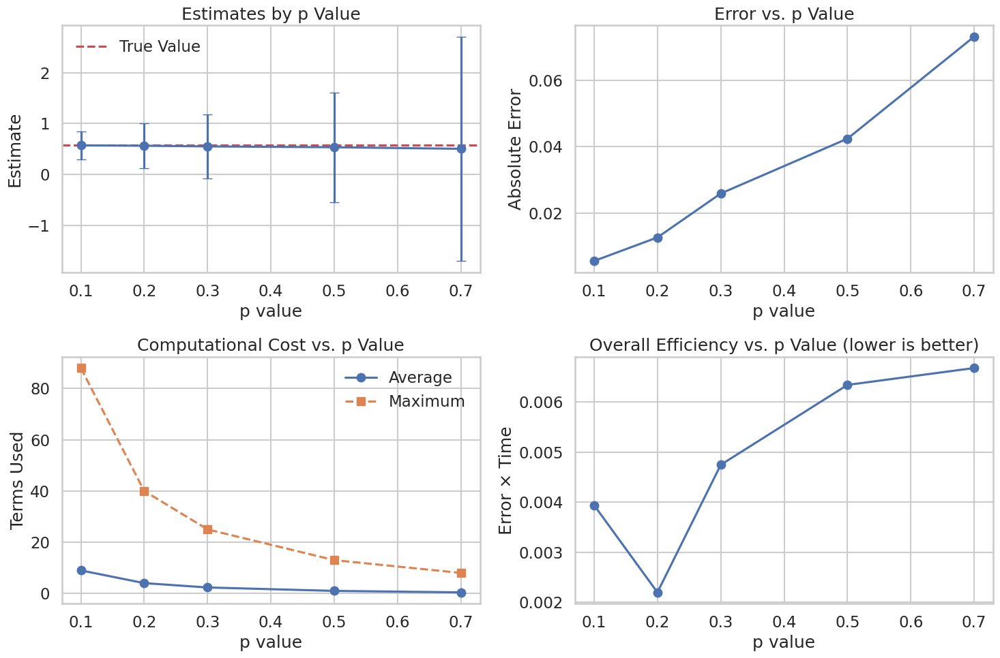

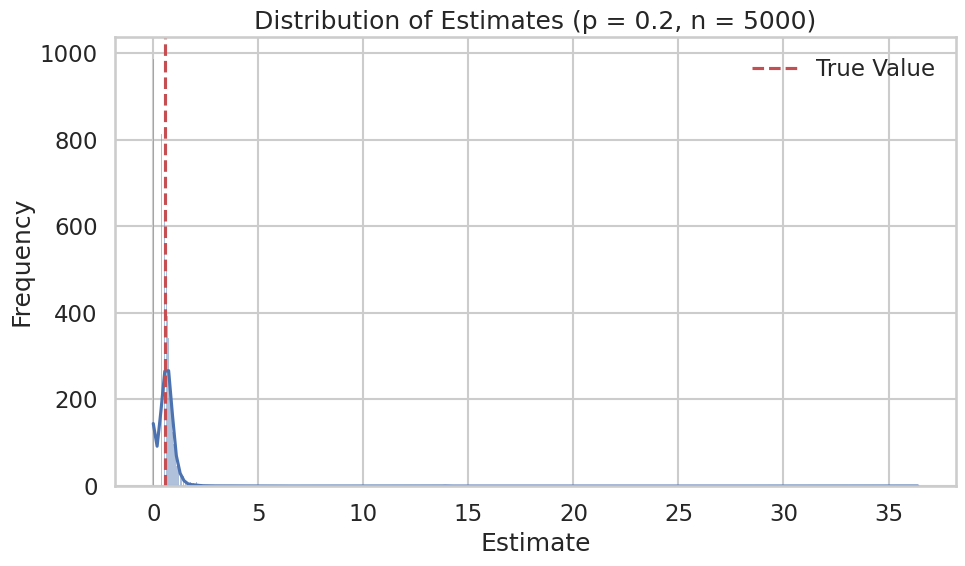


Best results:
p = 0.2
Mean estimate = 0.564486075504
Error = 0.012729589398
Average terms used = 4.0


In [10]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import time

# Set up plotting style
sns.set_theme(style="whitegrid")
sns.set_context("talk")
plt.rcParams['figure.figsize'] = [12, 8]

# True value of Euler's constant (γ) to high precision
EULER_GAMMA = 0.57721566490153286060

def a_k(k):
    """Calculate the k-th term in the series for Euler's constant"""
    if k < 1:
        return 0.0
    return 1.0/k - np.log(1.0 + 1.0/k)

def truncated_sum_estimator(p):
    """Generate a sample from the truncated sum estimator using geometric distribution"""
    # Generate R from geometric distribution (starting at 0)
    R = np.random.geometric(p) - 1

    # Calculate truncated sum
    estimate = 0.0
    terms_used = 0

    for k in range(1, R + 1):
        prob_R_geq_k = (1 - p) ** k
        term = a_k(k) / prob_R_geq_k
        estimate += term
        terms_used += 1

    return estimate, R, terms_used

def direct_sum(n_terms):
    """Calculate Euler's constant using direct summation of n terms"""
    direct_sum = 0.0
    for k in range(1, n_terms + 1):
        direct_sum += a_k(k)
    return direct_sum

def demo_truncated_sum():
    """Demonstrate the truncated sum estimator with different p values"""
    # Parameters to test
    p_values = [0.1, 0.2, 0.3, 0.5, 0.7]
    n_samples = 10000  # Number of samples per p value

    # Store results
    results = []

    for p in p_values:
        print(f"Running with p = {p}...")
        start_time = time.time()

        # Generate samples
        estimates = []
        Rs = []
        terms_used = []

        for i in range(n_samples):
            est, R, terms = truncated_sum_estimator(p)
            estimates.append(est)
            Rs.append(R)
            terms_used.append(terms)

        # Calculate statistics
        mean_estimate = np.mean(estimates)
        std_estimate = np.std(estimates)
        mean_error = np.abs(mean_estimate - EULER_GAMMA)
        mean_terms = np.mean(terms_used)
        max_terms = np.max(terms_used)
        elapsed_time = time.time() - start_time

        results.append({
            'p': p,
            'Mean Estimate': mean_estimate,
            'Std Dev': std_estimate,
            'Mean Error': mean_error,
            'Mean Terms': mean_terms,
            'Max Terms': max_terms,
            'Time': elapsed_time
        })

        print(f"  Mean estimate: {mean_estimate:.12f}")
        print(f"  Error: {mean_error:.12f}")
        print(f"  Average terms: {mean_terms:.1f}")
        print(f"  Time: {elapsed_time:.3f} sec")

    # Convert to DataFrame for easier reporting
    results_df = pd.DataFrame(results)

    # Compare to direct sum
    print("\nComparing with direct sum...")
    direct_sum_results = []
    direct_n_values = [10, 100, 1000, 10000]

    for n in direct_n_values:
        start_time = time.time()
        estimate = direct_sum(n)
        elapsed_time = time.time() - start_time
        error = np.abs(estimate - EULER_GAMMA)

        direct_sum_results.append({
            'N terms': n,
            'Estimate': estimate,
            'Error': error,
            'Time': elapsed_time
        })

        print(f"  Direct sum with {n} terms: {estimate:.12f}, Error: {error:.12f}")

    # Plot results
    plt.figure(figsize=(15, 10))

    # Plot 1: Estimates by p value
    plt.subplot(2, 2, 1)
    plt.errorbar(
        results_df['p'],
        results_df['Mean Estimate'],
        yerr=results_df['Std Dev'],
        fmt='o-',
        capsize=5
    )
    plt.axhline(y=EULER_GAMMA, color='r', linestyle='--', label='True Value')
    plt.xlabel('p value')
    plt.ylabel('Estimate')
    plt.title('Estimates by p Value')
    plt.legend()
    plt.grid(True)

    # Plot 2: Error vs p
    plt.subplot(2, 2, 2)
    plt.plot(results_df['p'], results_df['Mean Error'], 'o-')
    plt.xlabel('p value')
    plt.ylabel('Absolute Error')
    plt.title('Error vs. p Value')
    plt.grid(True)

    # Plot 3: Terms used vs p
    plt.subplot(2, 2, 3)
    plt.plot(results_df['p'], results_df['Mean Terms'], 'o-', label='Average')
    plt.plot(results_df['p'], results_df['Max Terms'], 's--', label='Maximum')
    plt.xlabel('p value')
    plt.ylabel('Terms Used')
    plt.title('Computational Cost vs. p Value')
    plt.legend()
    plt.grid(True)

    # Plot 4: Efficiency vs p
    plt.subplot(2, 2, 4)
    efficiency = results_df['Mean Error'] * results_df['Time']
    plt.plot(results_df['p'], efficiency, 'o-')
    plt.xlabel('p value')
    plt.ylabel('Error × Time')
    plt.title('Overall Efficiency vs. p Value (lower is better)')
    plt.grid(True)

    plt.tight_layout()

    # Display histogram of a large sample with optimal p
    # Find best p value
    best_p_idx = efficiency.idxmin() if len(efficiency) > 0 else 0
    best_p = results_df.iloc[best_p_idx]['p'] if len(results_df) > 0 else 0.2

    print(f"\nGenerating histogram with optimal p = {best_p}...")

    # Generate a large sample for histogram
    n_hist_samples = 5000
    hist_estimates = []

    for i in range(n_hist_samples):
        est, _, _ = truncated_sum_estimator(best_p)
        hist_estimates.append(est)

    plt.figure(figsize=(10, 6))
    sns.histplot(hist_estimates, kde=True)
    plt.axvline(x=EULER_GAMMA, color='r', linestyle='--', label='True Value')
    plt.xlabel('Estimate')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Estimates (p = {best_p}, n = {n_hist_samples})')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Print best results
    if len(results_df) > 0:
        best_row = results_df.iloc[best_p_idx]
        print("\nBest results:")
        print(f"p = {best_row['p']}")
        print(f"Mean estimate = {best_row['Mean Estimate']:.12f}")
        print(f"Error = {best_row['Mean Error']:.12f}")
        print(f"Average terms used = {best_row['Mean Terms']:.1f}")

if __name__ == "__main__":
    demo_truncated_sum()

# Gaussian Mixture Models: Bayesian Inference Theory

## 1. Model Description

A Gaussian Mixture Model (GMM) is a probabilistic model that represents a population as a mixture of K Gaussian distributions. In our specific model, we have K Gaussian components $Normal(\mu_k, 1)$, each with equal weight $1/K$. The density function is:

$$p(y) = \frac{1}{K} \sum_{k=1}^{K} \phi(y; \mu_k, 1)$$

where $\phi(y; \mu, \sigma^2) = \frac{1}{\sqrt{2\pi\sigma^2}} \exp\left(-\frac{(y-\mu)^2}{2\sigma^2}\right)$ is the PDF of a normal distribution.

## 2. Bayesian Approach with Latent Variables

To perform Bayesian inference on the GMM, we introduce latent variables $z_i$ for each observation $y_i$, where $z_i \in \{1,...,K\}$ indicates which Gaussian component generated the observation.

### Model Structure:
- Prior: $\mu_k \sim Normal(0, 10^2)$ independently for each $k$
- Latent variables: $P(z_i = k) = 1/K$ (equal probability for each component)
- Likelihood: $y_i | z_i = k \sim Normal(\mu_k, 1)$

### Gibbs Sampling Approach

Gibbs sampling allows us to sample from the joint posterior by iteratively sampling from the conditional distributions:

1. Sample $z_i | y_i, \mu_{1:K}$ for each observation
2. Sample $\mu_k | y_{1:n}, z_{1:n}$ for each component

The conditional distributions are:

**For $z_i$**:
$$P(z_i = k | y_i, \mu_{1:K}) \propto P(z_i = k) \cdot P(y_i | z_i = k, \mu_k) = \frac{1}{K} \cdot \phi(y_i; \mu_k, 1)$$

**For $\mu_k$**:
Let $I_k = \{i: z_i = k\}$ be the set of observations assigned to component $k$, and $n_k = |I_k|$ be the number of such observations.

$$\mu_k | y_{1:n}, z_{1:n} \sim Normal\left(\frac{\sum_{i \in I_k} y_i}{n_k + 0.01}, \frac{1}{n_k + 0.01}\right)$$

This comes from the conjugacy between the normal likelihood and normal prior.

## 3. Label Switching Problem

The likelihood of a mixture model is invariant to permutation of the component labels. For example, in a 2-component model, swapping $\mu_1$ and $\mu_2$ gives exactly the same likelihood.

This leads to a phenomenon known as "label switching" where the posterior distribution has K! symmetric modes, one for each possible permutation of the component labels. This makes interpretation of component-specific parameters challenging.

Strategies to address label switching include:
- Enforcing identifiability constraints (e.g., $\mu_1 < \mu_2 < ... < \mu_K$)
- Relabeling algorithms
- Using permutation-invariant summaries

## 4. Extensions to the Basic Model

### Unknown Variances
When the variances $\sigma_k^2$ are unknown:

- Prior: $\sigma_k^2 \sim \text{Inverse-Gamma}(\alpha, \beta)$
- Likelihood: $y_i | z_i = k \sim Normal(\mu_k, \sigma_k^2)$

The conditional posterior for $\sigma_k^2$ is also Inverse-Gamma due to conjugacy.

### Unknown Component Weights
When the component weights $\pi_k$ (where $\sum_k \pi_k = 1$) are unknown:

- For K=2: $\pi_1 \sim \text{Beta}(a, b)$, $\pi_2 = 1 - \pi_1$
- For K≥3: $(\pi_1, \pi_2, ..., \pi_K) \sim \text{Dirichlet}(\alpha_1, \alpha_2, ..., \alpha_K)$
- Latent variables: $P(z_i = k) = \pi_k$

The conditional posterior for $\pi$ given $z_{1:n}$ is also Dirichlet due to conjugacy.

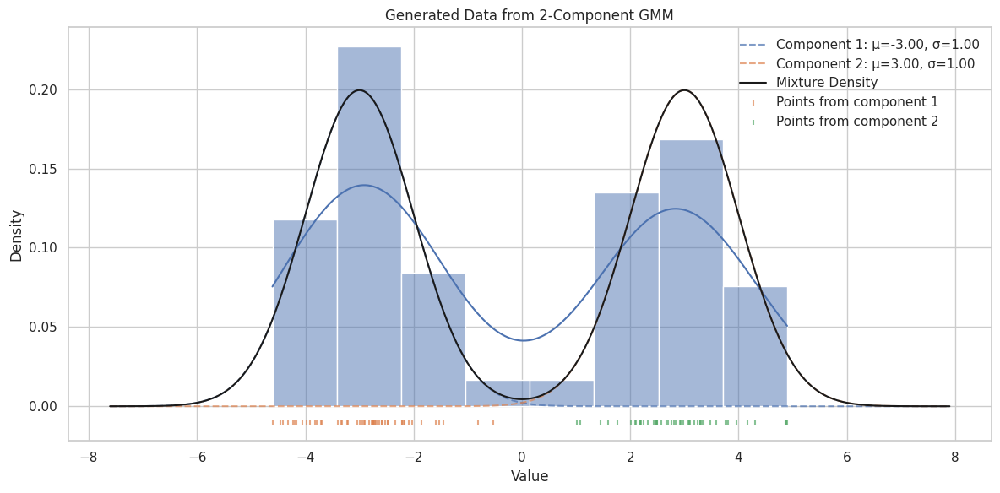

100%|██████████| 2000/2000 [01:27<00:00, 22.88it/s]


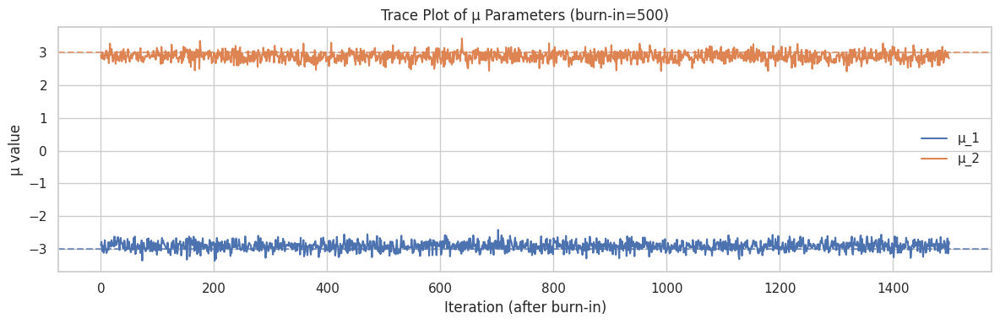

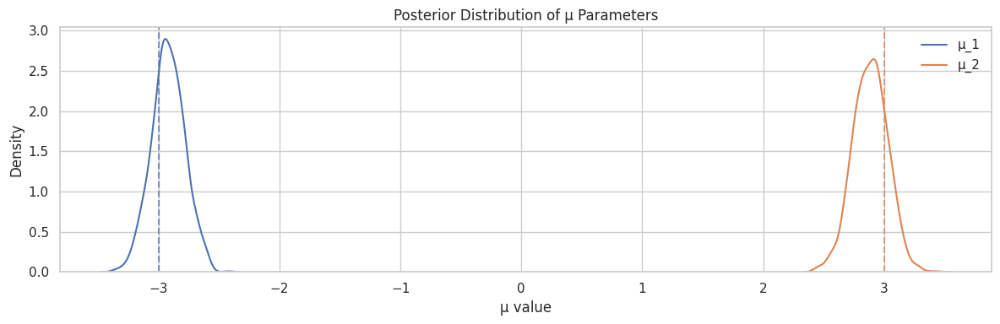

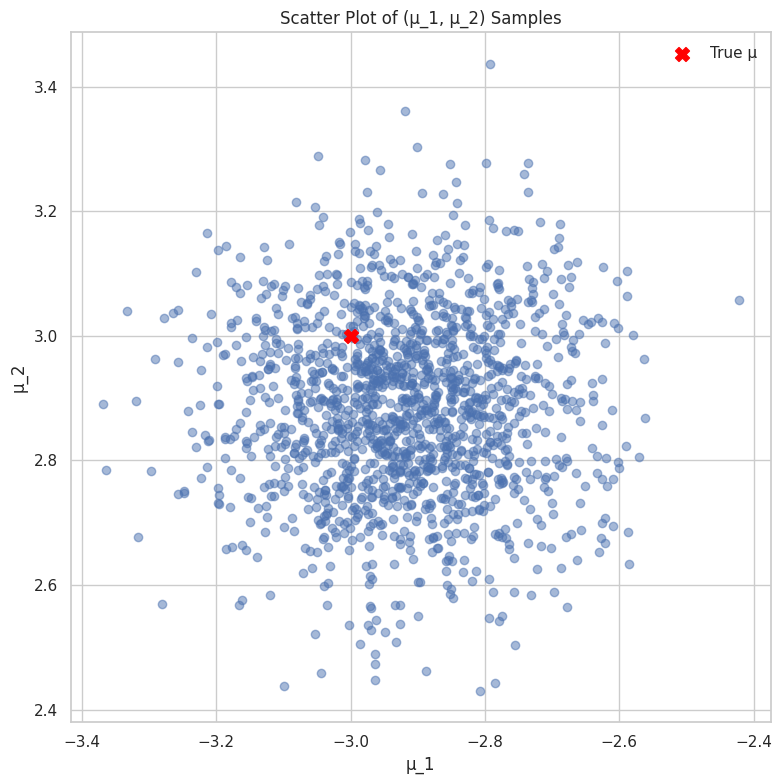

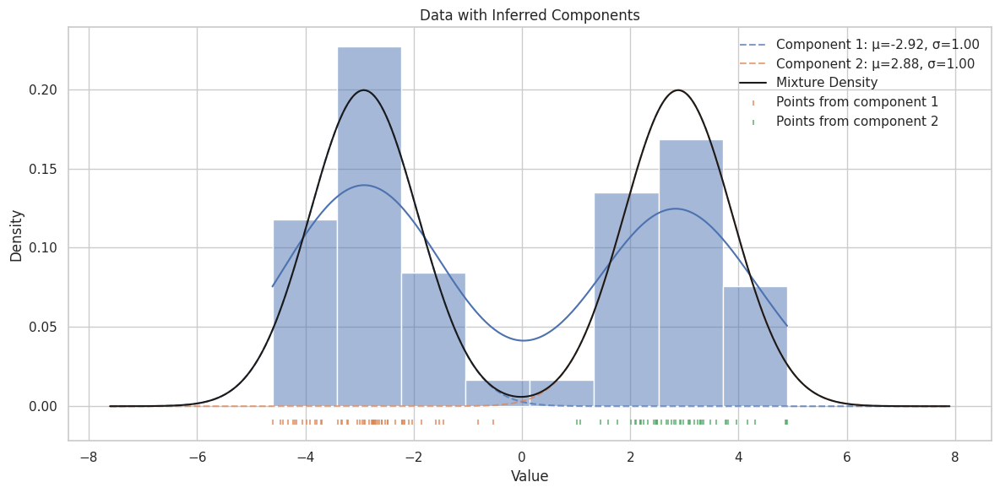


Posterior Summary Statistics:
----------------------------
Component 1:
  Mean μ_1: -2.9201
  95% Credible Interval: [-3.1961, -2.6412]
  Proportion of observations: 0.5300

Component 2:
  Mean μ_2: 2.8849
  95% Credible Interval: [2.5914, 3.1608]
  Proportion of observations: 0.4700

Convergence Metrics:
-------------------
Effective Sample Size for μ_1: 1500.0
Effective Sample Size for μ_2: 1500.0
R-hat for μ_1: 0.9994
R-hat for μ_2: 1.0002


In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from tqdm import tqdm

# Set random seed for reproducibility
np.random.seed(42)

# Set plotting style
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [10, 6]

def generate_gmm_data(n, K, mus, sigma=1.0, weights=None):
    """
    Generate data from a Gaussian Mixture Model

    Parameters:
    -----------
    n : int
        Number of observations
    K : int
        Number of components
    mus : array-like
        Means of the Gaussian components
    sigma : float or array-like
        Standard deviations of the Gaussian components
    weights : array-like, optional
        Mixing weights of the components. If None, equal weights are used.

    Returns:
    --------
    y : array
        Generated observations
    z : array
        Component indicators for each observation
    """
    if weights is None:
        weights = np.ones(K) / K

    # Ensure sigma is a numpy array
    if np.isscalar(sigma):
        sigma = np.ones(K) * sigma

    # Generate component indicators
    z = np.random.choice(K, size=n, p=weights)

    # Generate observations based on component indicators
    y = np.zeros(n)
    for i in range(n):
        y[i] = np.random.normal(mus[z[i]], sigma[z[i]])

    return y, z

def plot_gmm_data(y, z=None, mus=None, sigma=1.0, weights=None, title=None):
    """
    Plot the GMM data with components visualized

    Parameters:
    -----------
    y : array
        Observations
    z : array, optional
        Component indicators
    mus : array-like, optional
        Means of the Gaussian components
    sigma : float or array-like, optional
        Standard deviations of the Gaussian components
    weights : array-like, optional
        Mixing weights of the components
    title : str, optional
        Plot title
    """
    plt.figure(figsize=(12, 6))

    # Plot histogram of observations
    sns.histplot(y, kde=True, stat="density", alpha=0.5)

    # Plot the true density if parameters are provided
    if mus is not None:
        K = len(mus)
        if weights is None:
            weights = np.ones(K) / K
        if np.isscalar(sigma):
            sigma = np.ones(K) * sigma

        x = np.linspace(min(y) - 3, max(y) + 3, 1000)
        density = np.zeros_like(x)

        for k in range(K):
            component_density = weights[k] * norm.pdf(x, mus[k], sigma[k])
            density += component_density
            plt.plot(x, component_density, '--', alpha=0.7,
                     label=f'Component {k+1}: μ={mus[k]:.2f}, σ={sigma[k]:.2f}')

        plt.plot(x, density, 'k-', label='Mixture Density')

    # Color points by component if z is provided
    if z is not None:
        for k in range(max(z) + 1):
            component_y = y[z == k]
            plt.scatter(component_y, np.zeros_like(component_y) - 0.01,
                        marker='|', s=20, alpha=0.7, label=f'Points from component {k+1}')

    plt.legend()
    plt.title(title if title else "Gaussian Mixture Model")
    plt.xlabel("Value")
    plt.ylabel("Density")
    plt.tight_layout()
    plt.show()

def gibbs_sampler_gmm_fixed_sigma(y, K, n_iter, mu_prior_mean=0, mu_prior_var=100):
    """
    Gibbs sampler for GMM with fixed variance (σ² = 1)

    Parameters:
    -----------
    y : array
        Observations
    K : int
        Number of components
    n_iter : int
        Number of iterations
    mu_prior_mean : float
        Prior mean for μ
    mu_prior_var : float
        Prior variance for μ

    Returns:
    --------
    mu_samples : array
        Samples of component means (shape: n_iter x K)
    z_samples : array
        Samples of component indicators (shape: n_iter x n)
    """
    n = len(y)

    # Initialize parameters
    mu = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var), K)
    z = np.random.randint(0, K, n)

    # Storage for samples
    mu_samples = np.zeros((n_iter, K))
    z_samples = np.zeros((n_iter, n), dtype=int)

    # Gibbs sampling iterations
    for it in tqdm(range(n_iter)):
        # Step 1: Sample z_i | y_i, mu for each observation
        for i in range(n):
            # Calculate probabilities for each component
            log_probs = np.zeros(K)
            for k in range(K):
                # Log of: P(z_i = k) * P(y_i | z_i = k, mu_k)
                log_probs[k] = np.log(1/K) + norm.logpdf(y[i], mu[k], 1.0)

            # Normalize probabilities on log scale to avoid numerical issues
            log_probs -= np.max(log_probs)  # For numerical stability
            probs = np.exp(log_probs)
            probs /= np.sum(probs)

            # Sample new z_i
            z[i] = np.random.choice(K, p=probs)

        # Step 2: Sample mu_k | y, z for each component
        for k in range(K):
            # Find observations assigned to component k
            idx_k = (z == k)
            n_k = np.sum(idx_k)

            if n_k > 0:
                # Posterior precision = prior precision + n_k * likelihood precision
                # For normal with variance 1, precision = 1
                posterior_precision = 1.0/mu_prior_var + n_k
                posterior_var = 1.0/posterior_precision

                # Posterior mean = (prior mean * prior precision + sum(y_i) * likelihood precision) / posterior precision
                posterior_mean = (mu_prior_mean/mu_prior_var + np.sum(y[idx_k])) / posterior_precision

                # Sample new mu_k from posterior
                mu[k] = np.random.normal(posterior_mean, np.sqrt(posterior_var))
            else:
                # If no observations assigned, sample from prior
                mu[k] = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var))

        # Store samples
        mu_samples[it] = mu
        z_samples[it] = z

    return mu_samples, z_samples

def analyze_gibbs_results(y, mu_samples, z_samples, burnin=500, true_mu=None):
    """
    Analyze the results from Gibbs sampling

    Parameters:
    -----------
    y : array
        Observations
    mu_samples : array
        Samples of component means
    z_samples : array
        Samples of component indicators
    burnin : int
        Number of initial samples to discard
    true_mu : array, optional
        True component means for comparison
    """
    n_iter, K = mu_samples.shape
    n = len(y)

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    z_samples = z_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot trace of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axhline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("μ value")
    plt.legend()
    plt.title(f"Trace Plot of μ Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axvline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("μ value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of μ Parameters")
    plt.tight_layout()
    plt.show()

    # Scatter plot of mu pairs (for K=2)
    if K == 2:
        plt.figure(figsize=(8, 8))
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)

        if true_mu is not None:
            plt.scatter(true_mu[0], true_mu[1], color='red', s=100, marker='X', label='True μ')

        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("Scatter Plot of (μ_1, μ_2) Samples")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Calculate posterior means
    mu_posterior_mean = np.mean(mu_samples, axis=0)

    # Calculate component assignment probabilities for last iteration
    last_z = z_samples[-1]
    component_counts = np.bincount(last_z, minlength=K)
    component_probs = component_counts / n

    # Get last iteration assignments
    z_final = z_samples[-1]

    # Plot data with inferred components
    plot_gmm_data(y, z=z_final, mus=mu_posterior_mean,
                  title="Data with Inferred Components")

    # Print summary statistics
    print("\nPosterior Summary Statistics:")
    print("----------------------------")
    for k in range(K):
        print(f"Component {k+1}:")
        print(f"  Mean μ_{k+1}: {mu_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval: [{np.percentile(mu_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(mu_samples[:, k], 97.5):.4f}]")
        print(f"  Proportion of observations: {component_probs[k]:.4f}")
        print()

    # Calculate and print metrics
    print("Convergence Metrics:")
    print("-------------------")

    # Calculate effective sample size (using autocorrelation)
    def effective_sample_size(x):
        n = len(x)
        if n <= 1:
            return np.nan

        # Calculate autocorrelation
        acf = np.correlate(x - np.mean(x), x - np.mean(x), 'full')[n-1:] / np.var(x) / n

        # Find where autocorrelation becomes negative or close to zero
        cutoff = np.where(acf < 0.05)[0]
        if len(cutoff) > 0:
            acf = acf[:cutoff[0]]
        else:
            acf = acf[:min(n//5, 100)]  # Use a maximum lag

        # Calculate ESS
        ess = n / (1 + 2 * np.sum(acf[1:]))
        return max(1, ess)  # Ensure positive ESS

    for k in range(K):
        ess = effective_sample_size(mu_samples[:, k])
        print(f"Effective Sample Size for μ_{k+1}: {ess:.1f}")

    # Calculate Gelman-Rubin diagnostic (simplified, using first/second half)
    half = n_samples // 2
    if half > 10:  # Only if we have enough samples
        chains = [mu_samples[:half], mu_samples[half:]]

        # Calculate between-chain variance B
        chain_means = np.array([np.mean(chain, axis=0) for chain in chains])
        grand_mean = np.mean(chain_means, axis=0)
        B = half * np.sum((chain_means - grand_mean)**2, axis=0) / (len(chains) - 1)

        # Calculate within-chain variance W
        chain_vars = np.array([np.var(chain, axis=0, ddof=1) for chain in chains])
        W = np.mean(chain_vars, axis=0)

        # Calculate PSRF
        var_hat = (1 - 1/half) * W + B/half
        R_hat = np.sqrt(var_hat / W)

        for k in range(K):
            print(f"R-hat for μ_{k+1}: {R_hat[k]:.4f}")

    return mu_posterior_mean, z_final

# Main execution
if __name__ == "__main__":
    # 1. Simulate data from a 2-component GMM with well-separated means
    n = 100
    K = 2
    true_mu = np.array([-3.0, 3.0])  # Well-separated means
    sigma = 1.0
    weights = np.array([0.5, 0.5])  # Equal weights (1/K)

    y, z_true = generate_gmm_data(n, K, true_mu, sigma, weights)

    # Plot the generated data
    plot_gmm_data(y, z_true, true_mu, sigma, weights,
                  title="Generated Data from 2-Component GMM")

    # 2. Run Gibbs sampler
    n_iter = 2000
    mu_samples, z_samples = gibbs_sampler_gmm_fixed_sigma(y, K, n_iter,
                                                         mu_prior_mean=0,
                                                         mu_prior_var=100)

    # 3. Analyze results
    burnin = 500
    mu_posterior, z_final = analyze_gibbs_results(y, mu_samples, z_samples,
                                                 burnin=burnin, true_mu=true_mu)

# Bayesian Inference for Gaussian Mixture Models: Understanding the Theory

## Introduction to Gaussian Mixture Models

A Gaussian Mixture Model (GMM) is a probabilistic model that represents a population as a mixture of several Gaussian distributions. GMMs are widely used for density estimation, clustering, and as a flexible way to model complex data distributions.

In this problem, we consider a simplified GMM with $K$ Gaussian components $\mathcal{N}(\mu_k, 1)$, each with weight (prior probability) $1/K$. The probability density function of the observations is:

$$p(y) = \frac{1}{K} \sum_{k=1}^{K} \phi(y; \mu_k, 1)$$

where $\phi(y; \mu, \sigma^2) = \frac{1}{\sqrt{2\pi\sigma^2}} \exp\left(-\frac{(y-\mu)^2}{2\sigma^2}\right)$ is the PDF of a normal distribution.

## Bayesian Approach Using Latent Variables

To perform Bayesian inference on the GMM parameters, we introduce latent variables $Z_i$ for each observation $y_i$, representing the component assignment. The joint model is:

1. **Prior distribution for component means**: $\mu_k \sim Normal(0, 10^2)$ independently for each $k$
2. **Component assignments**: $P(Z_i = k) = 1/K$
3. **Conditional distribution of observations**: $y_i \mid Z_i = k \sim \mathcal{N}(\mu_k, 1)$

The goal is to estimate the posterior distribution of the parameters $(\mu_1, \mu_2, \ldots, \mu_K)$ and potentially the latent variables $(Z_1, Z_2, \ldots, Z_n)$ given the observations $y_1, y_2, \ldots, y_n$.

## Gibbs Sampling for GMM

The posterior distribution $p(\mu_1, \ldots, \mu_K, Z_1, \ldots, Z_n \mid y_1, \ldots, y_n)$ cannot be derived in closed form due to the complexity of the model. Instead, we use Gibbs sampling, a Markov Chain Monte Carlo (MCMC) method that alternately samples from the conditional distributions of each parameter, given all other parameters and the data.

For the GMM, the Gibbs sampling algorithm consists of two main steps:

### Step 1: Sample component assignments
For each observation $i = 1, \ldots, n$, sample $Z_i$ from the conditional distribution:

$$P(Z_i = k \mid y_i, \mu_1, \ldots, \mu_K) \propto P(Z_i = k) \cdot P(y_i \mid Z_i = k, \mu_k)$$

$$P(Z_i = k \mid y_i, \mu_1, \ldots, \mu_K) \propto \frac{1}{K} \cdot \phi(y_i; \mu_k, 1)$$

### Step 2: Sample component means
For each component $k = 1, \ldots, K$, sample $\mu_k$ from the conditional distribution:

$$\mu_k \mid y_1, \ldots, y_n, Z_1, \ldots, Z_n \sim  Normal\left(\frac{\tau_0 \mu_0 + n_k \bar{y}_k}{\tau_0 + n_k}, \frac{1}{\tau_0 + n_k}\right)$$

where:
- $\tau_0 = 1/10^2$ is the precision of the prior
- $\mu_0 = 0$ is the mean of the prior
- $n_k = \sum_{i=1}^{n} I(Z_i = k)$ is the number of observations assigned to component $k$
- $\bar{y}_k = \frac{1}{n_k} \sum_{i: Z_i = k} y_i$ is the sample mean of observations assigned to component $k$

## The Label Switching Problem

An important issue in Bayesian inference for mixture models is the "label switching" phenomenon. Since the likelihood function is invariant to permutation of the component labels, the posterior distribution has $K!$ symmetric modes, one for each possible labeling of the components.

For example, in a two-component model, the parameterizations $(\mu_1, \mu_2)$ and $(\mu_2, \mu_1)$ give exactly the same likelihood. This can lead to multimodal posterior distributions and challenges in interpreting the results.

Label switching is particularly evident in the scatterplot of the posterior samples of $(\mu_1, \mu_2)$. If label switching occurs, we would see a symmetric pattern around the diagonal line $\mu_1 = \mu_2$.

Several approaches can address label switching:
1. **Ordering constraint**: Enforce an identifiability constraint, such as $\mu_1 < \mu_2 < \ldots < \mu_K$
2. **Relabeling algorithms**: Post-process the MCMC samples to resolve the label switching
3. **Permutation-invariant quantities**: Focus on functions of the parameters that are invariant to permutation

## Extensions to the Basic Model

### Unknown Variances
We can extend the model to have unknown component-specific variances by adding:
- **Prior for variances**: $\sigma_k^2 \sim \text{Inverse-Gamma}(\alpha, \beta)$
- **Updated likelihood**: $y_i \mid Z_i = k \sim Normal(\mu_k, \sigma_k^2)$

In the Gibbs sampler, we then add a step to sample the variances from their conditional posterior:

$$\sigma_k^2 \mid y_1, \ldots, y_n, Z_1, \ldots, Z_n, \mu_k \sim \text{Inverse-Gamma}\left(\alpha + \frac{n_k}{2}, \beta + \frac{1}{2} \sum_{i: Z_i = k} (y_i - \mu_k)^2\right)$$

### Unknown Component Weights
We can also allow for unknown component weights by adding:
- **Prior for weights**: $(\pi_1, \ldots, \pi_K) \sim \text{Dirichlet}(\alpha_1, \ldots, \alpha_K)$
- **Updated component assignment probability**: $P(Z_i = k) = \pi_k$

The Gibbs sampler then includes a step to sample the weights from their conditional posterior:

$$(\pi_1, \ldots, \pi_K) \mid Z_1, \ldots, Z_n \sim \text{Dirichlet}(\alpha_1 + n_1, \ldots, \alpha_K + n_K)$$

where $n_k$ is the number of observations assigned to component $k$.

For $K=2$, we can use a Beta distribution:

$$\pi_1 \mid Z_1, \ldots, Z_n \sim \text{Beta}(\alpha_1 + n_1, \alpha_2 + n_2)$$

with $\pi_2 = 1 - \pi_1$.

## Analyzing the Results

After running the Gibbs sampler for enough iterations to ensure convergence, we:
1. Discard a portion of the initial samples as "burn-in"
2. Examine trace plots and diagnostic statistics to assess convergence
3. Compute summary statistics of the posterior distribution (mean, variance, credible intervals)
4. Visualize the inferred components and mixture density
5. Address label switching if necessary

Through these steps, we obtain a comprehensive Bayesian analysis of the Gaussian mixture model, capturing the uncertainty in all parameters through their posterior distributions.

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, invgamma, dirichlet
from tqdm import tqdm

# Set random seed for reproducibility
np.random.seed(42)

# Set plotting style
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [10, 6]

def generate_gmm_data(n, K, mus, sigma=1.0, weights=None):
    """
    Generate data from a Gaussian Mixture Model

    Parameters:
    -----------
    n : int
        Number of observations
    K : int
        Number of components
    mus : array-like
        Means of the Gaussian components
    sigma : float or array-like
        Standard deviations of the Gaussian components
    weights : array-like, optional
        Mixing weights of the components. If None, equal weights are used.

    Returns:
    --------
    y : array
        Generated observations
    z : array
        Component indicators for each observation
    """
    if weights is None:
        weights = np.ones(K) / K

    # Ensure sigma is a numpy array
    if np.isscalar(sigma):
        sigma = np.ones(K) * sigma

    # Generate component indicators
    z = np.random.choice(K, size=n, p=weights)

    # Generate observations based on component indicators
    y = np.zeros(n)
    for i in range(n):
        y[i] = np.random.normal(mus[z[i]], sigma[z[i]])

    return y, z

def plot_gmm_data(y, z=None, mus=None, sigma=1.0, weights=None, title=None):
    """
    Plot the GMM data with components visualized

    Parameters:
    -----------
    y : array
        Observations
    z : array, optional
        Component indicators
    mus : array-like, optional
        Means of the Gaussian components
    sigma : float or array-like, optional
        Standard deviations of the Gaussian components
    weights : array-like, optional
        Mixing weights of the components
    title : str, optional
        Plot title
    """
    plt.figure(figsize=(12, 6))

    # Plot histogram of observations
    sns.histplot(y, kde=True, stat="density", alpha=0.5)

    # Plot the true density if parameters are provided
    if mus is not None:
        K = len(mus)
        if weights is None:
            weights = np.ones(K) / K
        if np.isscalar(sigma):
            sigma = np.ones(K) * sigma

        x = np.linspace(min(y) - 3, max(y) + 3, 1000)
        density = np.zeros_like(x)

        for k in range(K):
            component_density = weights[k] * norm.pdf(x, mus[k], sigma[k])
            density += component_density
            plt.plot(x, component_density, '--', alpha=0.7,
                     label=f'Component {k+1}: μ={mus[k]:.2f}, σ={sigma[k]:.2f}')

        plt.plot(x, density, 'k-', label='Mixture Density')

    # Color points by component if z is provided
    if z is not None:
        for k in range(max(z) + 1):
            component_y = y[z == k]
            plt.scatter(component_y, np.zeros_like(component_y) - 0.01,
                        marker='|', s=20, alpha=0.7, label=f'Points from component {k+1}')

    plt.legend()
    plt.title(title if title else "Gaussian Mixture Model")
    plt.xlabel("Value")
    plt.ylabel("Density")
    plt.tight_layout()
    plt.show()

def gibbs_sampler_gmm_fixed_sigma(y, K, n_iter, mu_prior_mean=0, mu_prior_var=100):
    """
    Gibbs sampler for GMM with fixed variance (σ² = 1)

    Parameters:
    -----------
    y : array
        Observations
    K : int
        Number of components
    n_iter : int
        Number of iterations
    mu_prior_mean : float
        Prior mean for μ
    mu_prior_var : float
        Prior variance for μ

    Returns:
    --------
    mu_samples : array
        Samples of component means (shape: n_iter x K)
    z_samples : array
        Samples of component indicators (shape: n_iter x n)
    """
    n = len(y)

    # Initialize parameters
    mu = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var), K)
    z = np.random.randint(0, K, n)

    # Storage for samples
    mu_samples = np.zeros((n_iter, K))
    z_samples = np.zeros((n_iter, n), dtype=int)

    # Gibbs sampling iterations
    for it in tqdm(range(n_iter)):
        # Step 1: Sample z_i | y_i, mu for each observation
        for i in range(n):
            # Calculate probabilities for each component
            log_probs = np.zeros(K)
            for k in range(K):
                # Log of: P(z_i = k) * P(y_i | z_i = k, mu_k)
                log_probs[k] = np.log(1/K) + norm.logpdf(y[i], mu[k], 1.0)

            # Normalize probabilities on log scale to avoid numerical issues
            log_probs -= np.max(log_probs)  # For numerical stability
            probs = np.exp(log_probs)
            probs /= np.sum(probs)

            # Sample new z_i
            z[i] = np.random.choice(K, p=probs)

        # Step 2: Sample mu_k | y, z for each component
        for k in range(K):
            # Find observations assigned to component k
            idx_k = (z == k)
            n_k = np.sum(idx_k)

            if n_k > 0:
                # Posterior precision = prior precision + n_k * likelihood precision
                # For normal with variance 1, precision = 1
                posterior_precision = 1.0/mu_prior_var + n_k
                posterior_var = 1.0/posterior_precision

                # Posterior mean = (prior mean * prior precision + sum(y_i) * likelihood precision) / posterior precision
                posterior_mean = (mu_prior_mean/mu_prior_var + np.sum(y[idx_k])) / posterior_precision

                # Sample new mu_k from posterior
                mu[k] = np.random.normal(posterior_mean, np.sqrt(posterior_var))
            else:
                # If no observations assigned, sample from prior
                mu[k] = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var))

        # Store samples
        mu_samples[it] = mu
        z_samples[it] = z

    return mu_samples, z_samples

def analyze_gibbs_results(y, mu_samples, z_samples, burnin=500, true_mu=None):
    """
    Analyze the results from Gibbs sampling

    Parameters:
    -----------
    y : array
        Observations
    mu_samples : array
        Samples of component means
    z_samples : array
        Samples of component indicators
    burnin : int
        Number of initial samples to discard
    true_mu : array, optional
        True component means for comparison
    """
    n_iter, K = mu_samples.shape
    n = len(y)

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    z_samples = z_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot trace of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axhline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("μ value")
    plt.legend()
    plt.title(f"Trace Plot of μ Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axvline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("μ value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of μ Parameters")
    plt.tight_layout()
    plt.show()

    # Scatter plot of mu pairs (for K=2)
    if K == 2:
        plt.figure(figsize=(8, 8))
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)

        if true_mu is not None:
            plt.scatter(true_mu[0], true_mu[1], color='red', s=100, marker='X', label='True μ')

        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("Scatter Plot of (μ_1, μ_2) Samples")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Calculate posterior means
    mu_posterior_mean = np.mean(mu_samples, axis=0)

    # Calculate component assignment probabilities for last iteration
    last_z = z_samples[-1]
    component_counts = np.bincount(last_z, minlength=K)
    component_probs = component_counts / n

    # Get last iteration assignments
    z_final = z_samples[-1]

    # Plot data with inferred components
    plot_gmm_data(y, z=z_final, mus=mu_posterior_mean,
                  title="Data with Inferred Components")

    # Print summary statistics
    print("\nPosterior Summary Statistics:")
    print("----------------------------")
    for k in range(K):
        print(f"Component {k+1}:")
        print(f"  Mean μ_{k+1}: {mu_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval: [{np.percentile(mu_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(mu_samples[:, k], 97.5):.4f}]")
        print(f"  Proportion of observations: {component_probs[k]:.4f}")
        print()

    return mu_posterior_mean, z_final

def examine_label_switching(mu_samples, K=2, burnin=500):
    """
    Examine the label switching phenomenon in GMM

    Parameters:
    -----------
    mu_samples : array
        Samples of component means
    K : int
        Number of components
    burnin : int
        Number of initial samples to discard
    """
    if K != 2:
        print("This function is designed for K=2 components")
        return

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot scatter of mu pairs
    plt.figure(figsize=(10, 10))
    plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)
    plt.xlabel("μ_1")
    plt.ylabel("μ_2")
    plt.title("Scatter Plot of (μ_1, μ_2) Samples")
    plt.grid(True)

    # Add diagonal line
    x_min, x_max = plt.xlim()
    y_min, y_max = plt.ylim()
    lims = [min(x_min, y_min), max(x_max, y_max)]
    plt.plot(lims, lims, 'r--', alpha=0.7, label="μ_1 = μ_2")

    plt.legend()
    plt.tight_layout()
    plt.show()

    # Attempt to detect label switching
    # One approach: count how many samples have μ_1 > μ_2
    prop_switched = np.mean(mu_samples[:, 0] > mu_samples[:, 1])

    print(f"Proportion of samples with μ_1 > μ_2: {prop_switched:.4f}")

    # If we see a lot of switching, relabel to enforce μ_1 < μ_2
    if prop_switched > 0.1:
        print("Label switching detected.")

        # Relabeling approach 1: Order the means
        mu_relabeled = np.zeros_like(mu_samples)
        for i in range(n_samples):
            sorted_idx = np.argsort(mu_samples[i])
            mu_relabeled[i] = mu_samples[i, sorted_idx]

        # Plot relabeled mu pairs
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)
        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("Original Samples")
        plt.grid(True)

        plt.subplot(1, 2, 2)
        plt.scatter(mu_relabeled[:, 0], mu_relabeled[:, 1], alpha=0.5)
        plt.xlabel("μ_1 (relabeled)")
        plt.ylabel("μ_2 (relabeled)")
        plt.title("Relabeled Samples (μ_1 < μ_2)")
        plt.grid(True)

        plt.tight_layout()
        plt.show()

        # Plot marginal densities before and after relabeling
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        sns.kdeplot(mu_samples[:, 0], label='μ_1')
        sns.kdeplot(mu_samples[:, 1], label='μ_2')
        plt.xlabel("μ value")
        plt.ylabel("Density")
        plt.title("Original Marginal Densities")
        plt.legend()

        plt.subplot(1, 2, 2)
        sns.kdeplot(mu_relabeled[:, 0], label='μ_1 (relabeled)')
        sns.kdeplot(mu_relabeled[:, 1], label='μ_2 (relabeled)')
        plt.xlabel("μ value")
        plt.ylabel("Density")
        plt.title("Relabeled Marginal Densities")
        plt.legend()

        plt.tight_layout()
        plt.show()

        return mu_relabeled
    else:
        print("No significant label switching detected.")
        return mu_samples

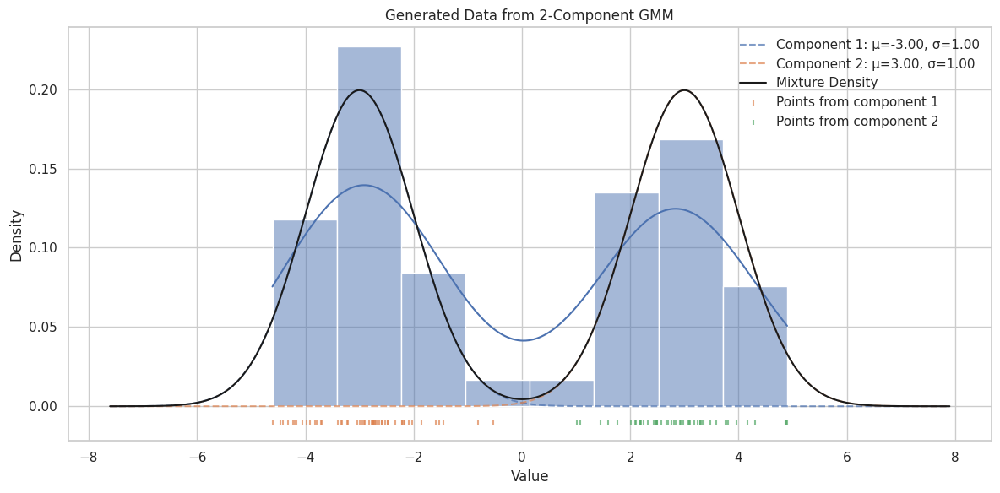


Running Gibbs sampler with fixed variance...


100%|██████████| 2000/2000 [01:13<00:00, 27.32it/s]


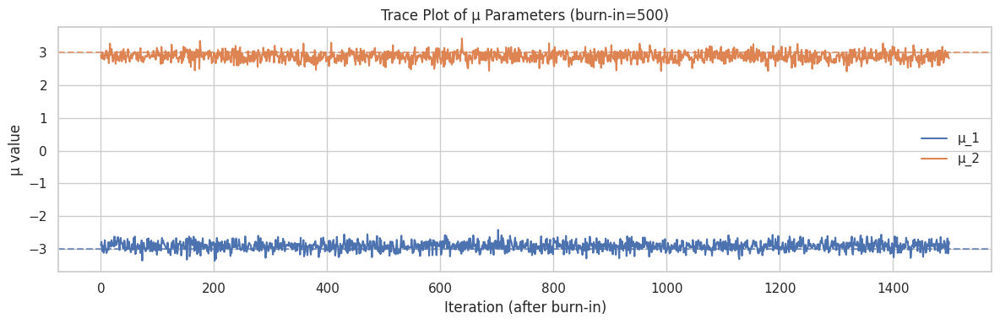

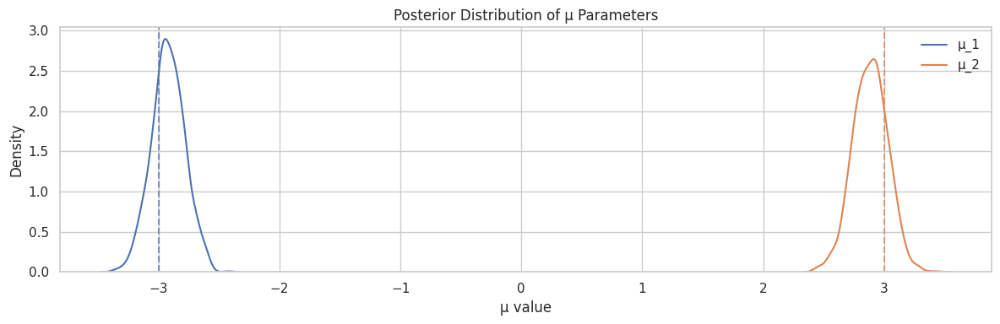

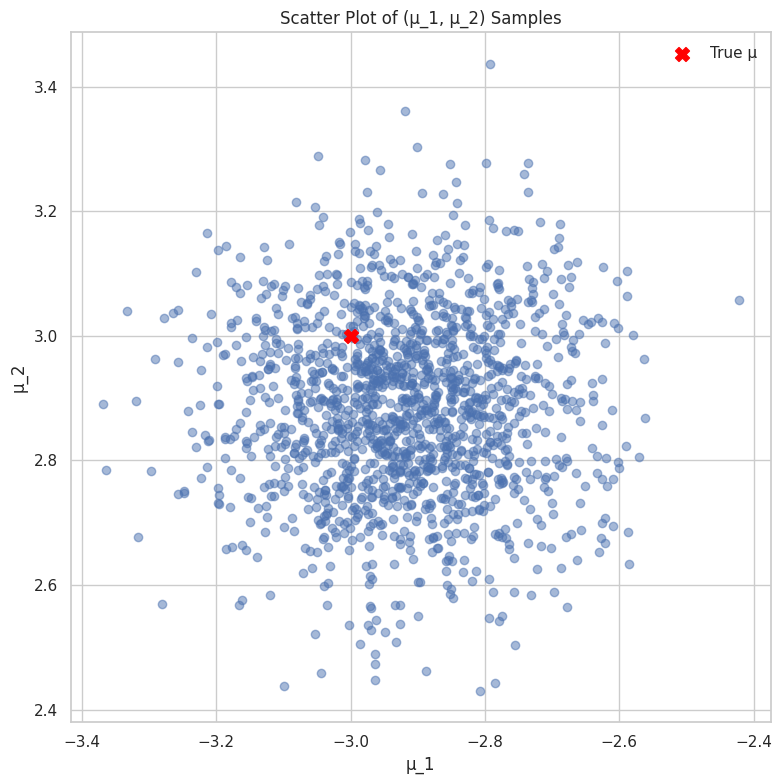

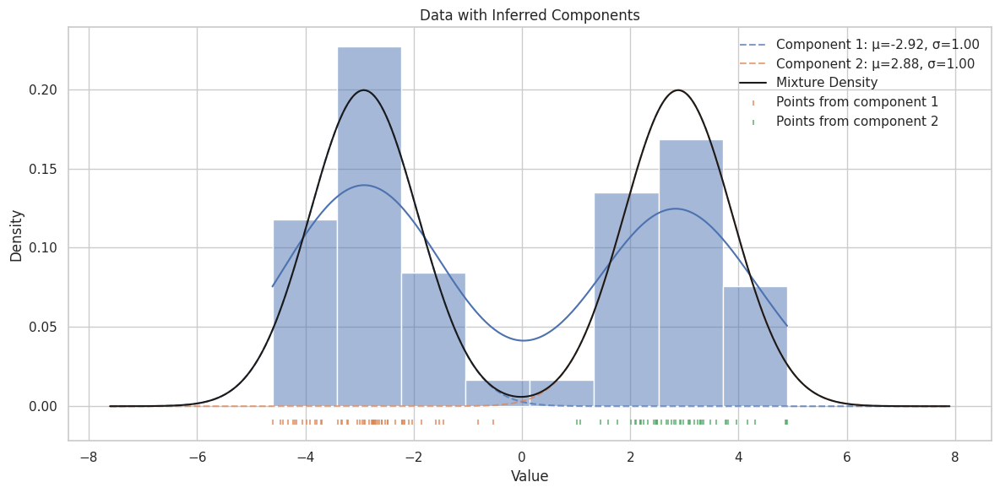


Posterior Summary Statistics:
----------------------------
Component 1:
  Mean μ_1: -2.9201
  95% Credible Interval: [-3.1961, -2.6412]
  Proportion of observations: 0.5300

Component 2:
  Mean μ_2: 2.8849
  95% Credible Interval: [2.5914, 3.1608]
  Proportion of observations: 0.4700



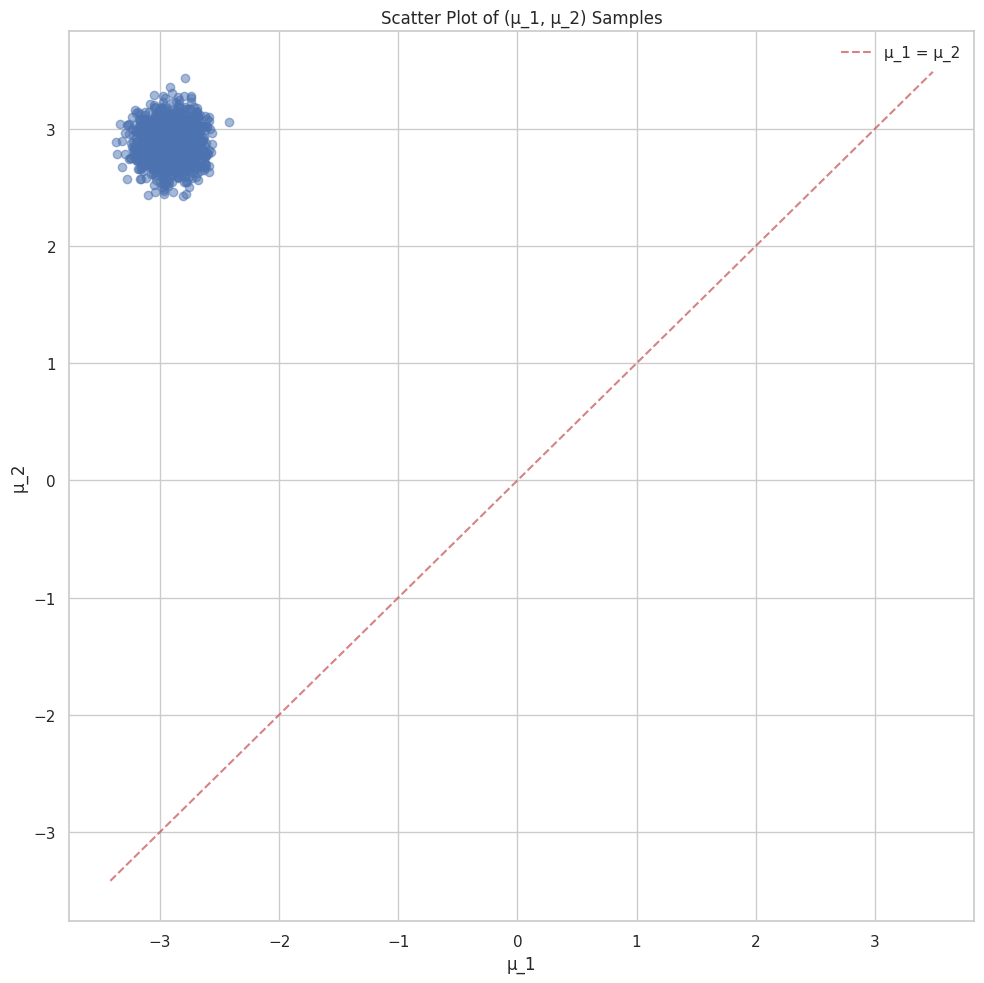

Proportion of samples with μ_1 > μ_2: 0.0000
No significant label switching detected.

Running Gibbs sampler with unknown variance...


100%|██████████| 2000/2000 [01:11<00:00, 27.99it/s]


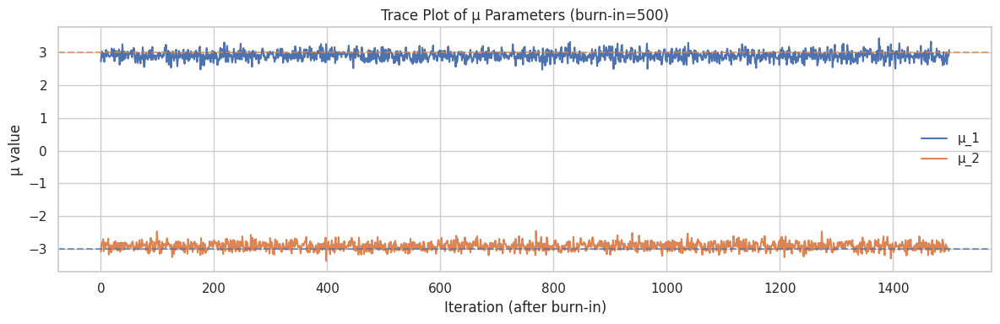

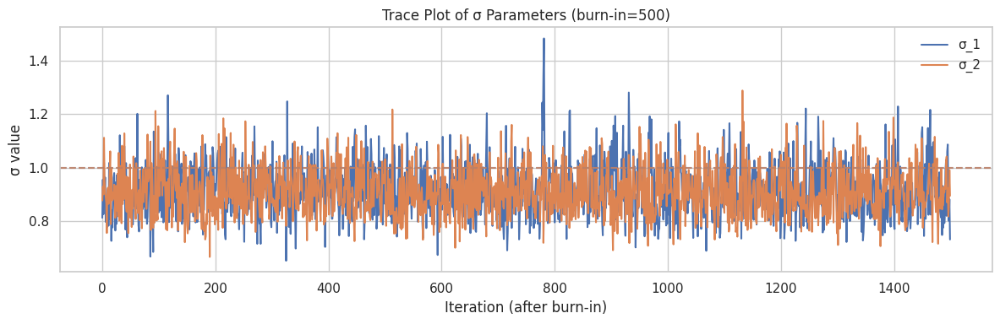

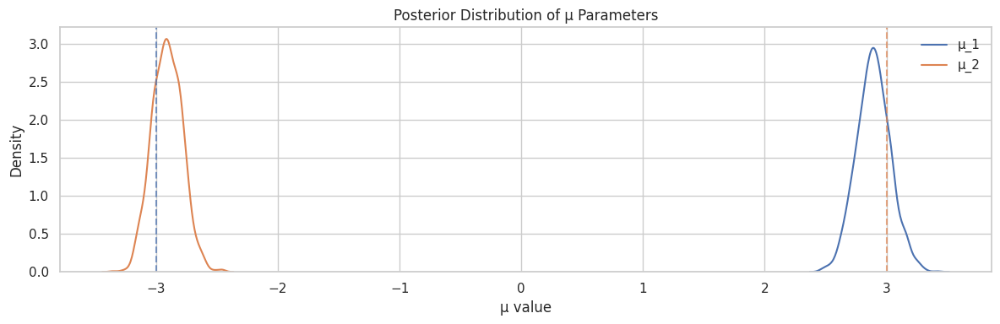

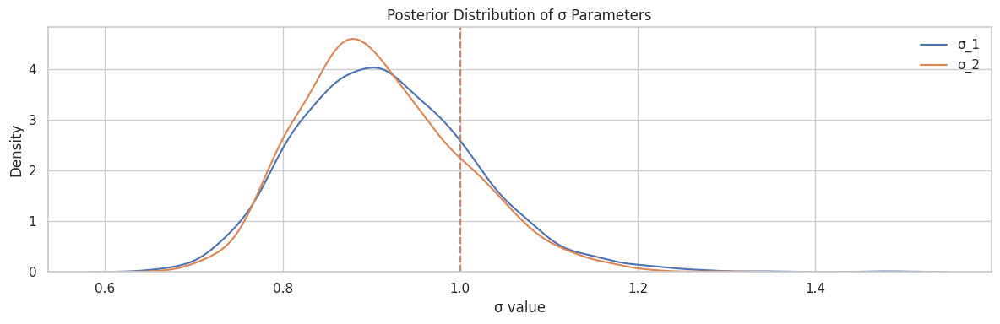

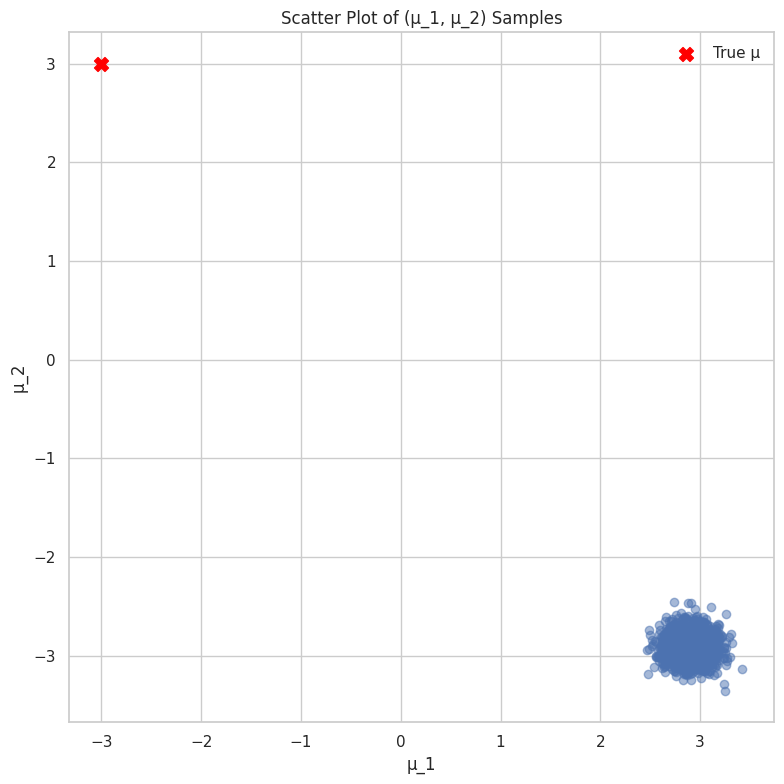

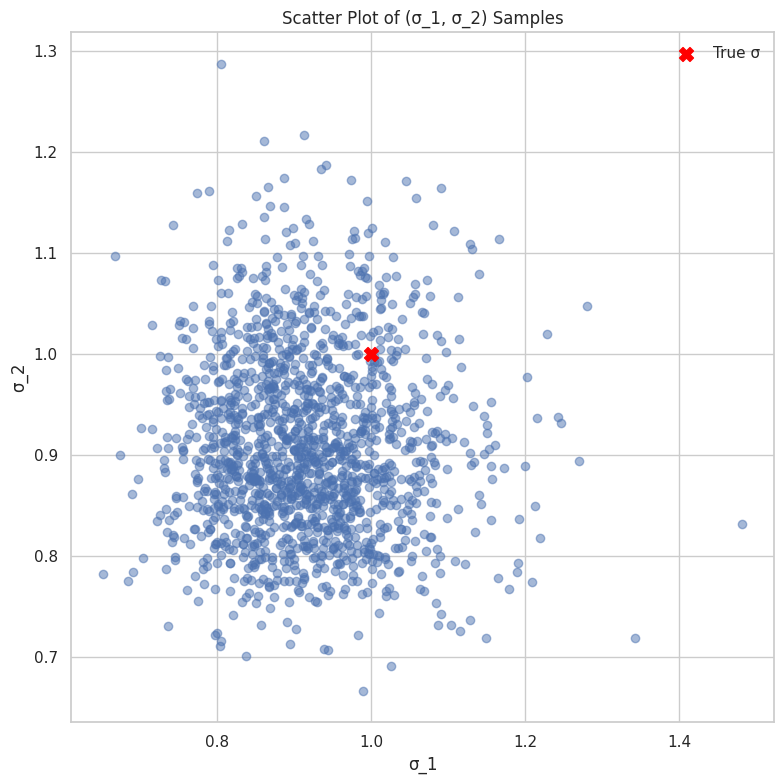

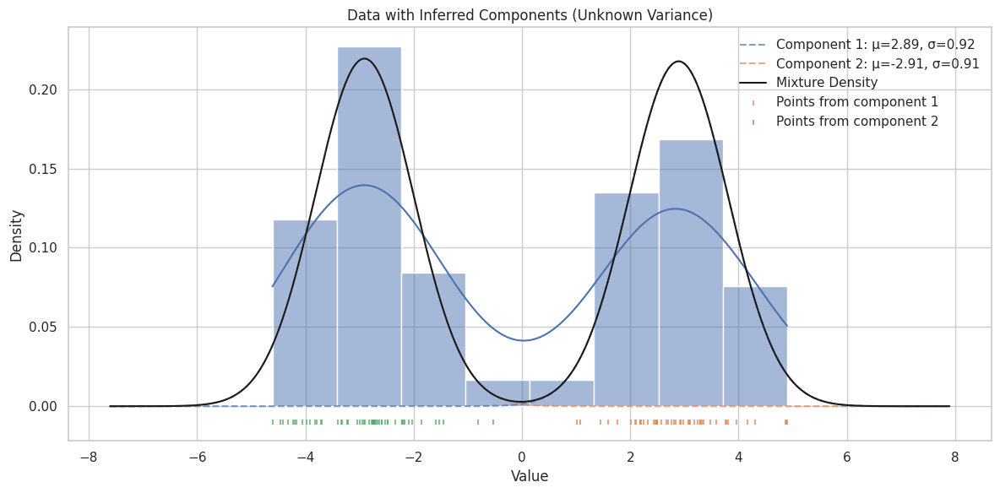


Posterior Summary Statistics:
----------------------------
Component 1:
  Mean μ_1: 2.8933
  95% Credible Interval for μ_1: [2.6215, 3.1735]
  Std Dev σ_1: 0.9164
  95% Credible Interval for σ_1: [0.7450, 1.1304]

Component 2:
  Mean μ_2: -2.9093
  95% Credible Interval for μ_2: [-3.1447, -2.6624]
  Std Dev σ_2: 0.9093
  95% Credible Interval for σ_2: [0.7610, 1.1094]


Running Gibbs sampler with unknown weights...


100%|██████████| 2000/2000 [01:12<00:00, 27.54it/s]


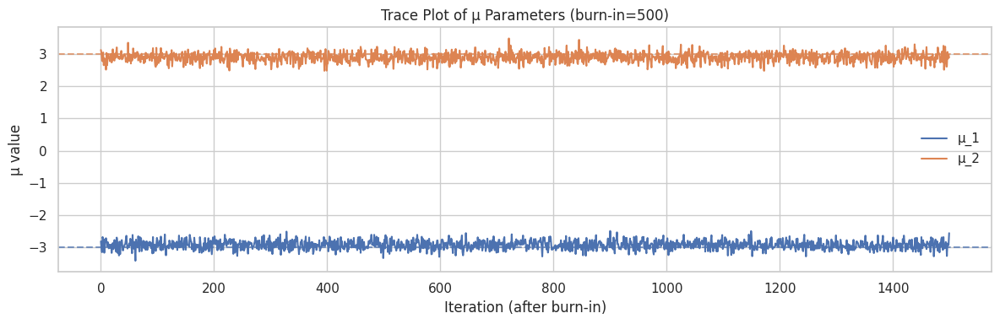

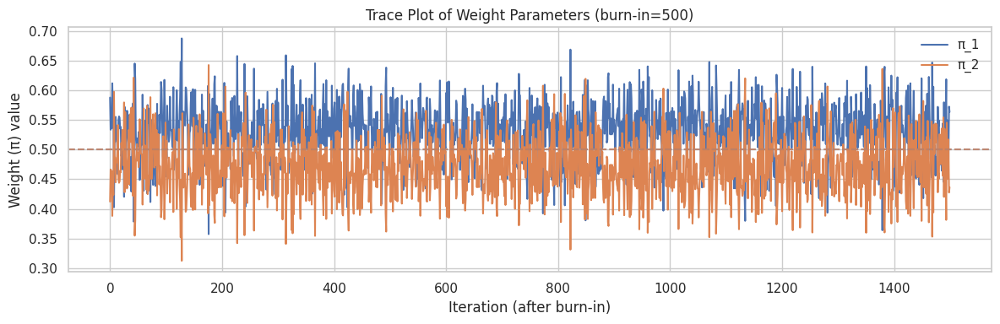

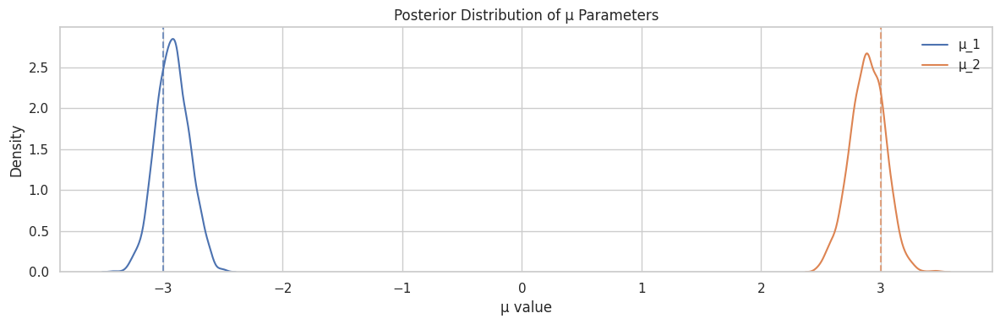

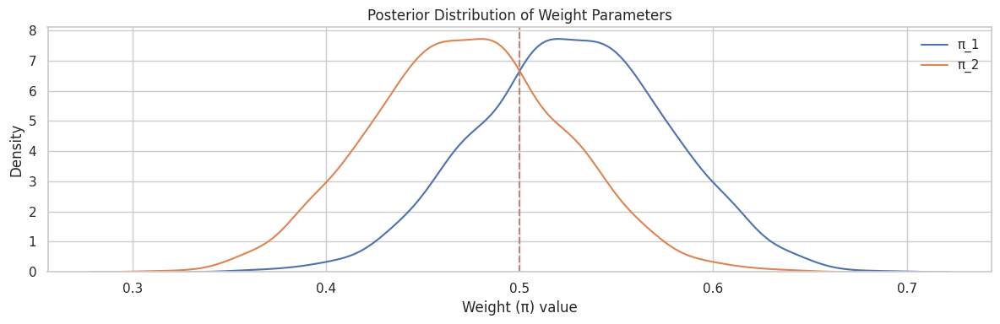

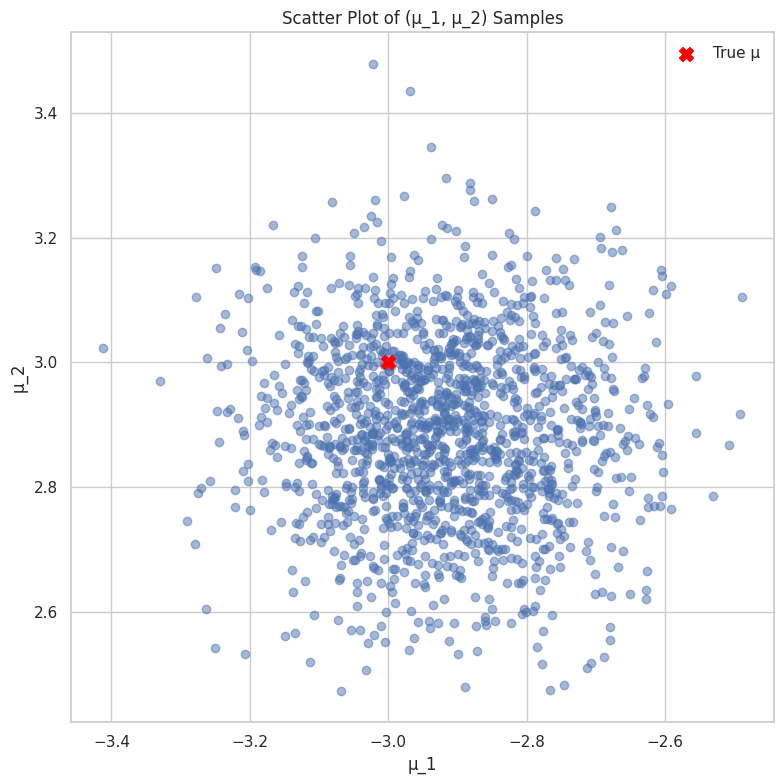

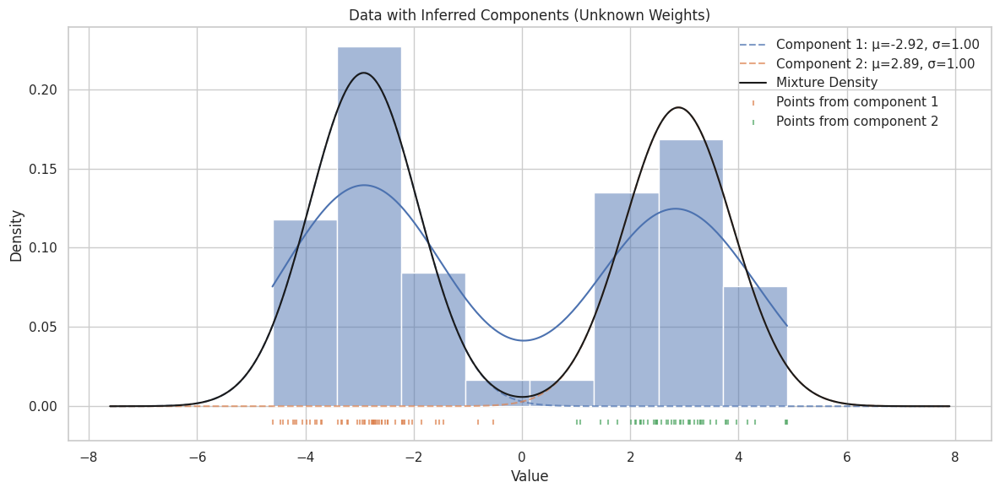


Posterior Summary Statistics:
----------------------------
Component 1:
  Mean μ_1: -2.9207
  95% Credible Interval for μ_1: [-3.1855, -2.6493]
  Weight π_1: 0.5274
  95% Credible Interval for π_1: [0.4323, 0.6210]

Component 2:
  Mean μ_2: 2.8905
  95% Credible Interval for μ_2: [2.5854, 3.1689]
  Weight π_2: 0.4726
  95% Credible Interval for π_2: [0.3790, 0.5677]


Running full Gibbs sampler...


NameError: name 'gibbs_sampler_gmm_full' is not defined

In [16]:
def analyze_gibbs_results_unknown_sigma(y, mu_samples, sigma_samples, z_samples, burnin=500, true_mu=None, true_sigma=None):
    """
    Analyze the results from Gibbs sampling with unknown variance

    Parameters:
    -----------
    y : array
        Observations
    mu_samples : array
        Samples of component means
    sigma_samples : array
        Samples of component standard deviations
    z_samples : array
        Samples of component indicators
    burnin : int
        Number of initial samples to discard
    true_mu : array, optional
        True component means for comparison
    true_sigma : array, optional
        True component standard deviations for comparison
    """
    n_iter, K = mu_samples.shape
    n = len(y)

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    sigma_samples = sigma_samples[burnin:]
    z_samples = z_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot trace of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axhline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("μ value")
    plt.legend()
    plt.title(f"Trace Plot of μ Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot trace of sigma parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(sigma_samples[:, k], label=f'σ_{k+1}')

    if true_sigma is not None:
        for k in range(K):
            plt.axhline(true_sigma[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("σ value")
    plt.legend()
    plt.title(f"Trace Plot of σ Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axvline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("μ value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of μ Parameters")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of sigma parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(sigma_samples[:, k], label=f'σ_{k+1}')

    if true_sigma is not None:
        for k in range(K):
            plt.axvline(true_sigma[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("σ value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of σ Parameters")
    plt.tight_layout()
    plt.show()

    # Scatter plot of mu pairs (for K=2)
    if K == 2:
        plt.figure(figsize=(8, 8))
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)

        if true_mu is not None:
            plt.scatter(true_mu[0], true_mu[1], color='red', s=100, marker='X', label='True μ')

        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("Scatter Plot of (μ_1, μ_2) Samples")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # Scatter plot of sigma pairs (for K=2)
        plt.figure(figsize=(8, 8))
        plt.scatter(sigma_samples[:, 0], sigma_samples[:, 1], alpha=0.5)

        if true_sigma is not None:
            plt.scatter(true_sigma[0], true_sigma[1], color='red', s=100, marker='X', label='True σ')

        plt.xlabel("σ_1")
        plt.ylabel("σ_2")
        plt.title("Scatter Plot of (σ_1, σ_2) Samples")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Calculate posterior means
    mu_posterior_mean = np.mean(mu_samples, axis=0)
    sigma_posterior_mean = np.mean(sigma_samples, axis=0)

    # Get last iteration assignments
    z_final = z_samples[-1]

    # Plot data with inferred components
    plot_gmm_data(y, z=z_final, mus=mu_posterior_mean, sigma=sigma_posterior_mean,
                  title="Data with Inferred Components (Unknown Variance)")

    # Print summary statistics
    print("\nPosterior Summary Statistics:")
    print("----------------------------")
    for k in range(K):
        print(f"Component {k+1}:")
        print(f"  Mean μ_{k+1}: {mu_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for μ_{k+1}: [{np.percentile(mu_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(mu_samples[:, k], 97.5):.4f}]")
        print(f"  Std Dev σ_{k+1}: {sigma_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for σ_{k+1}: [{np.percentile(sigma_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(sigma_samples[:, k], 97.5):.4f}]")
        print()

    return mu_posterior_mean, sigma_posterior_mean, z_final

def analyze_gibbs_results_unknown_weights(y, mu_samples, weight_samples, z_samples, burnin=500,
                                         true_mu=None, true_weights=None):
    """
    Analyze the results from Gibbs sampling with unknown weights

    Parameters:
    -----------
    y : array
        Observations
    mu_samples : array
        Samples of component means
    weight_samples : array
        Samples of component weights
    z_samples : array
        Samples of component indicators
    burnin : int
        Number of initial samples to discard
    true_mu : array, optional
        True component means for comparison
    true_weights : array, optional
        True component weights for comparison
    """
    n_iter, K = mu_samples.shape
    n = len(y)

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    weight_samples = weight_samples[burnin:]
    z_samples = z_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot trace of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axhline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("μ value")
    plt.legend()
    plt.title(f"Trace Plot of μ Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot trace of weight parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(weight_samples[:, k], label=f'π_{k+1}')

    if true_weights is not None:
        for k in range(K):
            plt.axhline(true_weights[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("Weight (π) value")
    plt.legend()
    plt.title(f"Trace Plot of Weight Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axvline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("μ value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of μ Parameters")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of weight parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(weight_samples[:, k], label=f'π_{k+1}')

    if true_weights is not None:
        for k in range(K):
            plt.axvline(true_weights[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Weight (π) value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of Weight Parameters")
    plt.tight_layout()
    plt.show()

    # Scatter plot of mu pairs (for K=2)
    if K == 2:
        plt.figure(figsize=(8, 8))
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)

        if true_mu is not None:
            plt.scatter(true_mu[0], true_mu[1], color='red', s=100, marker='X', label='True μ')

        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("Scatter Plot of (μ_1, μ_2) Samples")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Calculate posterior means
    mu_posterior_mean = np.mean(mu_samples, axis=0)
    weight_posterior_mean = np.mean(weight_samples, axis=0)

    # Get last iteration assignments
    z_final = z_samples[-1]

    # Plot data with inferred components
    plot_gmm_data(y, z=z_final, mus=mu_posterior_mean, weights=weight_posterior_mean,
                  title="Data with Inferred Components (Unknown Weights)")

    # Print summary statistics
    print("\nPosterior Summary Statistics:")
    print("----------------------------")
    for k in range(K):
        print(f"Component {k+1}:")
        print(f"  Mean μ_{k+1}: {mu_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for μ_{k+1}: [{np.percentile(mu_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(mu_samples[:, k], 97.5):.4f}]")
        print(f"  Weight π_{k+1}: {weight_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for π_{k+1}: [{np.percentile(weight_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(weight_samples[:, k], 97.5):.4f}]")
        print()

    return mu_posterior_mean, weight_posterior_mean, z_final

def analyze_gibbs_results_full(y, mu_samples, sigma_samples, weight_samples, z_samples, burnin=500,
                               true_mu=None, true_sigma=None, true_weights=None):
    """
    Analyze the results from Gibbs sampling with unknown means, variances, and weights

    Parameters:
    -----------
    y : array
        Observations
    mu_samples : array
        Samples of component means
    sigma_samples : array
        Samples of component standard deviations
    weight_samples : array
        Samples of component weights
    z_samples : array
        Samples of component indicators
    burnin : int
        Number of initial samples to discard
    true_mu : array, optional
        True component means for comparison
    true_sigma : array, optional
        True component standard deviations for comparison
    true_weights : array, optional
        True component weights for comparison
    """
    n_iter, K = mu_samples.shape
    n = len(y)

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    sigma_samples = sigma_samples[burnin:]
    weight_samples = weight_samples[burnin:]
    z_samples = z_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot trace of parameters
    plt.figure(figsize=(15, 10))

    # Plot trace of mu parameters
    plt.subplot(3, 1, 1)
    for k in range(K):
        plt.plot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axhline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.ylabel("μ value")
    plt.legend()
    plt.title(f"Trace Plot of μ Parameters (burn-in={burnin})")

    # Plot trace of sigma parameters
    plt.subplot(3, 1, 2)
    for k in range(K):
        plt.plot(sigma_samples[:, k], label=f'σ_{k+1}')

    if true_sigma is not None:
        for k in range(K):
            plt.axhline(true_sigma[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.ylabel("σ value")
    plt.legend()
    plt.title("Trace Plot of σ Parameters")

    # Plot trace of weight parameters
    plt.subplot(3, 1, 3)
    for k in range(K):
        plt.plot(weight_samples[:, k], label=f'π_{k+1}')

    if true_weights is not None:
        for k in range(K):
            plt.axhline(true_weights[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("Weight (π) value")
    plt.legend()
    plt.title("Trace Plot of Weight Parameters")

    plt.tight_layout()
    plt.show()

    # Plot posterior distributions
    plt.figure(figsize=(15, 10))

    # Plot posterior distribution of mu parameters
    plt.subplot(3, 1, 1)
    for k in range(K):
        sns.kdeplot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axvline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of μ Parameters")

    # Plot posterior distribution of sigma parameters
    plt.subplot(3, 1, 2)
    for k in range(K):
        sns.kdeplot(sigma_samples[:, k], label=f'σ_{k+1}')

    if true_sigma is not None:
        for k in range(K):
            plt.axvline(true_sigma[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of σ Parameters")

    # Plot posterior distribution of weight parameters
    plt.subplot(3, 1, 3)
    for k in range(K):
        sns.kdeplot(weight_samples[:, k], label=f'π_{k+1}')

    if true_weights is not None:
        for k in range(K):
            plt.axvline(true_weights[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Parameter Value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of Weight Parameters")

    plt.tight_layout()
    plt.show()

    # Scatter plots for K=2
    if K == 2:
        plt.figure(figsize=(15, 5))
        plt.suptitle("Pairwise Scatter Plots of Parameters (K=2)")

        # Plot mu pairs
        plt.subplot(1, 3, 1)
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)

        if true_mu is not None:
            plt.scatter(true_mu[0], true_mu[1], color='red', s=100, marker='X', label='True μ')

        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("(μ_1, μ_2)")
        plt.grid(True)
        plt.legend()

        # Plot sigma pairs
        plt.subplot(1, 3, 2)
        plt.scatter(sigma_samples[:, 0], sigma_samples[:, 1], alpha=0.5)

        if true_sigma is not None:
            plt.scatter(true_sigma[0], true_sigma[1], color='red', s=100, marker='X', label='True σ')

        plt.xlabel("σ_1")
        plt.ylabel("σ_2")
        plt.title("(σ_1, σ_2)")
        plt.grid(True)
        plt.legend()

        # Plot weight pairs
        plt.subplot(1, 3, 3)
        plt.scatter(weight_samples[:, 0], weight_samples[:, 1], alpha=0.5)

        if true_weights is not None:
            plt.scatter(true_weights[0], true_weights[1], color='red', s=100, marker='X', label='True π')

        plt.xlabel("π_1")
        plt.ylabel("π_2")
        plt.title("(π_1, π_2)")
        plt.grid(True)
        plt.legend()

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    # Calculate posterior means
    mu_posterior_mean = np.mean(mu_samples, axis=0)
    sigma_posterior_mean = np.mean(sigma_samples, axis=0)
    weight_posterior_mean = np.mean(weight_samples, axis=0)

    # Get last iteration assignments
    z_final = z_samples[-1]

    # Plot data with inferred components
    plot_gmm_data(y, z=z_final, mus=mu_posterior_mean, sigma=sigma_posterior_mean,
                  weights=weight_posterior_mean, title="Data with Inferred Components (Full Model)")

    # Print summary statistics
    print("\nPosterior Summary Statistics:")
    print("----------------------------")
    for k in range(K):
        print(f"Component {k+1}:")
        print(f"  Mean μ_{k+1}: {mu_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for μ_{k+1}: [{np.percentile(mu_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(mu_samples[:, k], 97.5):.4f}]")
        print(f"  Std Dev σ_{k+1}: {sigma_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for σ_{k+1}: [{np.percentile(sigma_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(sigma_samples[:, k], 97.5):.4f}]")
        print(f"  Weight π_{k+1}: {weight_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for π_{k+1}: [{np.percentile(weight_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(weight_samples[:, k], 97.5):.4f}]")
        print()

    return mu_posterior_mean, sigma_posterior_mean, weight_posterior_mean, z_final

# Main execution - example usage
if __name__ == "__main__":
    # 1. Simulate data from a 2-component GMM with well-separated means
    n = 100
    K = 2
    true_mu = np.array([-3.0, 3.0])  # Well-separated means
    sigma = 1.0
    weights = np.array([0.5, 0.5])  # Equal weights (1/K)

    y, z_true = generate_gmm_data(n, K, true_mu, sigma, weights)

    # Plot the generated data
    plot_gmm_data(y, z_true, true_mu, sigma, weights,
                  title="Generated Data from 2-Component GMM")

    # 2. Run Gibbs sampler for fixed variance model
    print("\nRunning Gibbs sampler with fixed variance...")
    n_iter = 2000
    mu_samples, z_samples = gibbs_sampler_gmm_fixed_sigma(y, K, n_iter,
                                                         mu_prior_mean=0,
                                                         mu_prior_var=100)

    # 3. Analyze results and examine label switching
    burnin = 500
    mu_posterior, z_final = analyze_gibbs_results(y, mu_samples, z_samples,
                                                 burnin=burnin, true_mu=true_mu)

    # 4. Examine label switching phenomenon
    mu_relabeled = examine_label_switching(mu_samples, K, burnin)

    # 5. Run Gibbs sampler with unknown variance
    print("\nRunning Gibbs sampler with unknown variance...")
    mu_samples_uv, sigma_samples, z_samples_uv = gibbs_sampler_gmm_unknown_sigma(
        y, K, n_iter, mu_prior_mean=0, mu_prior_var=100,
        sigma_prior_alpha=2, sigma_prior_beta=1
    )

    # 6. Analyze results for unknown variance model
    mu_posterior_uv, sigma_posterior, z_final_uv = analyze_gibbs_results_unknown_sigma(
        y, mu_samples_uv, sigma_samples, z_samples_uv,
        burnin=burnin, true_mu=true_mu, true_sigma=np.ones(K)
    )

    # 7. Run Gibbs sampler with unknown weights
    print("\nRunning Gibbs sampler with unknown weights...")
    mu_samples_uw, weight_samples, z_samples_uw = gibbs_sampler_gmm_unknown_weights(
        y, K, n_iter, mu_prior_mean=0, mu_prior_var=100,
        weight_prior_alpha=1
    )

    # 8. Analyze results for unknown weights model
    mu_posterior_uw, weight_posterior, z_final_uw = analyze_gibbs_results_unknown_weights(
        y, mu_samples_uw, weight_samples, z_samples_uw,
        burnin=burnin, true_mu=true_mu, true_weights=weights
    )

    # 9. Run full Gibbs sampler with unknown means, variances, and weights
    print("\nRunning full Gibbs sampler...")
    mu_samples_full, sigma_samples_full, weight_samples_full, z_samples_full = gibbs_sampler_gmm_full(
        y, K, n_iter, mu_prior_mean=0, mu_prior_var=100,
        sigma_prior_alpha=2, sigma_prior_beta=1,
        weight_prior_alpha=1
    )

    # 10. Analyze results for full model
    results_full = analyze_gibbs_results_full(
        y, mu_samples_full, sigma_samples_full, weight_samples_full, z_samples_full,
        burnin=burnin, true_mu=true_mu, true_sigma=np.ones(K), true_weights=weights
    )

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, invgamma, dirichlet
from tqdm import tqdm

# Set random seed for reproducibility
np.random.seed(42)

# Set plotting style
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [10, 6]

def generate_gmm_data(n, K, mus, sigma=1.0, weights=None):
    """
    Generate data from a Gaussian Mixture Model

    Parameters:
    -----------
    n : int
        Number of observations
    K : int
        Number of components
    mus : array-like
        Means of the Gaussian components
    sigma : float or array-like
        Standard deviations of the Gaussian components
    weights : array-like, optional
        Mixing weights of the components. If None, equal weights are used.

    Returns:
    --------
    y : array
        Generated observations
    z : array
        Component indicators for each observation
    """
    if weights is None:
        weights = np.ones(K) / K

    # Ensure sigma is a numpy array
    if np.isscalar(sigma):
        sigma = np.ones(K) * sigma

    # Generate component indicators
    z = np.random.choice(K, size=n, p=weights)

    # Generate observations based on component indicators
    y = np.zeros(n)
    for i in range(n):
        y[i] = np.random.normal(mus[z[i]], sigma[z[i]])

    return y, z

def plot_gmm_data(y, z=None, mus=None, sigma=1.0, weights=None, title=None):
    """
    Plot the GMM data with components visualized

    Parameters:
    -----------
    y : array
        Observations
    z : array, optional
        Component indicators
    mus : array-like, optional
        Means of the Gaussian components
    sigma : float or array-like, optional
        Standard deviations of the Gaussian components
    weights : array-like, optional
        Mixing weights of the components
    title : str, optional
        Plot title
    """
    plt.figure(figsize=(12, 6))

    # Plot histogram of observations
    sns.histplot(y, kde=True, stat="density", alpha=0.5)

    # Plot the true density if parameters are provided
    if mus is not None:
        K = len(mus)
        if weights is None:
            weights = np.ones(K) / K
        if np.isscalar(sigma):
            sigma = np.ones(K) * sigma

        x = np.linspace(min(y) - 3, max(y) + 3, 1000)
        density = np.zeros_like(x)

        for k in range(K):
            component_density = weights[k] * norm.pdf(x, mus[k], sigma[k])
            density += component_density
            plt.plot(x, component_density, '--', alpha=0.7,
                     label=f'Component {k+1}: μ={mus[k]:.2f}, σ={sigma[k]:.2f}')

        plt.plot(x, density, 'k-', label='Mixture Density')

    # Color points by component if z is provided
    if z is not None:
        for k in range(max(z) + 1):
            component_y = y[z == k]
            plt.scatter(component_y, np.zeros_like(component_y) - 0.01,
                        marker='|', s=20, alpha=0.7, label=f'Points from component {k+1}')

    plt.legend()
    plt.title(title if title else "Gaussian Mixture Model")
    plt.xlabel("Value")
    plt.ylabel("Density")
    plt.tight_layout()
    plt.show()

def gibbs_sampler_gmm_fixed_sigma(y, K, n_iter, mu_prior_mean=0, mu_prior_var=100):
    """
    Gibbs sampler for GMM with fixed variance (σ² = 1)

    Parameters:
    -----------
    y : array
        Observations
    K : int
        Number of components
    n_iter : int
        Number of iterations
    mu_prior_mean : float
        Prior mean for μ
    mu_prior_var : float
        Prior variance for μ

    Returns:
    --------
    mu_samples : array
        Samples of component means (shape: n_iter x K)
    z_samples : array
        Samples of component indicators (shape: n_iter x n)
    """
    n = len(y)

    # Initialize parameters
    mu = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var), K)
    z = np.random.randint(0, K, n)

    # Storage for samples
    mu_samples = np.zeros((n_iter, K))
    z_samples = np.zeros((n_iter, n), dtype=int)

    # Gibbs sampling iterations
    for it in tqdm(range(n_iter)):
        # Step 1: Sample z_i | y_i, mu for each observation
        for i in range(n):
            # Calculate probabilities for each component
            log_probs = np.zeros(K)
            for k in range(K):
                # Log of: P(z_i = k) * P(y_i | z_i = k, mu_k)
                log_probs[k] = np.log(1/K) + norm.logpdf(y[i], mu[k], 1.0)

            # Normalize probabilities on log scale to avoid numerical issues
            log_probs -= np.max(log_probs)  # For numerical stability
            probs = np.exp(log_probs)
            probs /= np.sum(probs)

            # Sample new z_i
            z[i] = np.random.choice(K, p=probs)

        # Step 2: Sample mu_k | y, z for each component
        for k in range(K):
            # Find observations assigned to component k
            idx_k = (z == k)
            n_k = np.sum(idx_k)

            if n_k > 0:
                # Posterior precision = prior precision + n_k * likelihood precision
                # For normal with variance 1, precision = 1
                posterior_precision = 1.0/mu_prior_var + n_k
                posterior_var = 1.0/posterior_precision

                # Posterior mean = (prior mean * prior precision + sum(y_i) * likelihood precision) / posterior precision
                posterior_mean = (mu_prior_mean/mu_prior_var + np.sum(y[idx_k])) / posterior_precision

                # Sample new mu_k from posterior
                mu[k] = np.random.normal(posterior_mean, np.sqrt(posterior_var))
            else:
                # If no observations assigned, sample from prior
                mu[k] = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var))

        # Store samples
        mu_samples[it] = mu
        z_samples[it] = z

    return mu_samples, z_samples

def gibbs_sampler_gmm_unknown_sigma(y, K, n_iter,
                                   mu_prior_mean=0, mu_prior_var=100,
                                   sigma_prior_alpha=2, sigma_prior_beta=2):
    """
    Gibbs sampler for GMM with unknown variance

    Parameters:
    -----------
    y : array
        Observations
    K : int
        Number of components
    n_iter : int
        Number of iterations
    mu_prior_mean : float
        Prior mean for μ
    mu_prior_var : float
        Prior variance for μ
    sigma_prior_alpha : float
        Shape parameter for Inverse Gamma prior on σ²
    sigma_prior_beta : float
        Scale parameter for Inverse Gamma prior on σ²

    Returns:
    --------
    mu_samples : array
        Samples of component means (shape: n_iter x K)
    sigma_samples : array
        Samples of component standard deviations (shape: n_iter x K)
    z_samples : array
        Samples of component indicators (shape: n_iter x n)
    """
    n = len(y)

    # Initialize parameters
    mu = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var), K)
    sigma2 = invgamma.rvs(sigma_prior_alpha, scale=sigma_prior_beta, size=K)
    sigma = np.sqrt(sigma2)
    z = np.random.randint(0, K, n)

    # Storage for samples
    mu_samples = np.zeros((n_iter, K))
    sigma_samples = np.zeros((n_iter, K))
    z_samples = np.zeros((n_iter, n), dtype=int)

    # Gibbs sampling iterations
    for it in tqdm(range(n_iter)):
        # Step 1: Sample z_i | y_i, mu, sigma for each observation
        for i in range(n):
            # Calculate probabilities for each component
            log_probs = np.zeros(K)
            for k in range(K):
                # Log of: P(z_i = k) * P(y_i | z_i = k, mu_k, sigma_k)
                log_probs[k] = np.log(1/K) + norm.logpdf(y[i], mu[k], sigma[k])

            # Normalize probabilities on log scale to avoid numerical issues
            log_probs -= np.max(log_probs)  # For numerical stability
            probs = np.exp(log_probs)
            probs /= np.sum(probs)

            # Sample new z_i
            z[i] = np.random.choice(K, p=probs)

        # Step 2: Sample mu_k, sigma_k | y, z for each component
        for k in range(K):
            # Find observations assigned to component k
            idx_k = (z == k)
            n_k = np.sum(idx_k)
            y_k = y[idx_k]

            if n_k > 0:
                # Sample sigma²_k from Inverse Gamma posterior
                alpha_post = sigma_prior_alpha + n_k/2
                beta_post = sigma_prior_beta + 0.5 * np.sum((y_k - mu[k])**2)
                sigma2[k] = invgamma.rvs(alpha_post, scale=beta_post)
                sigma[k] = np.sqrt(sigma2[k])

                # Sample mu_k from Normal posterior
                precision_prior = 1.0 / mu_prior_var
                precision_lik = n_k / sigma2[k]
                precision_post = precision_prior + precision_lik
                var_post = 1.0 / precision_post

                mean_prior = mu_prior_mean * precision_prior
                mean_lik = np.sum(y_k) * (1.0 / sigma2[k])
                mean_post = (mean_prior + mean_lik) / precision_post

                mu[k] = np.random.normal(mean_post, np.sqrt(var_post))
            else:
                # If no observations assigned, sample from prior
                sigma2[k] = invgamma.rvs(sigma_prior_alpha, scale=sigma_prior_beta)
                sigma[k] = np.sqrt(sigma2[k])
                mu[k] = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var))

        # Store samples
        mu_samples[it] = mu
        sigma_samples[it] = sigma
        z_samples[it] = z

    return mu_samples, sigma_samples, z_samples

def gibbs_sampler_gmm_unknown_weights(y, K, n_iter,
                                     mu_prior_mean=0, mu_prior_var=100,
                                     weight_prior_alpha=1):
    """
    Gibbs sampler for GMM with unknown component weights

    Parameters:
    -----------
    y : array
        Observations
    K : int
        Number of components
    n_iter : int
        Number of iterations
    mu_prior_mean : float
        Prior mean for μ
    mu_prior_var : float
        Prior variance for μ
    weight_prior_alpha : float or array
        Concentration parameter(s) for Dirichlet prior on weights

    Returns:
    --------
    mu_samples : array
        Samples of component means (shape: n_iter x K)
    weight_samples : array
        Samples of component weights (shape: n_iter x K)
    z_samples : array
        Samples of component indicators (shape: n_iter x n)
    """
    n = len(y)

    # Initialize parameters
    mu = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var), K)

    # Set up weight prior
    if np.isscalar(weight_prior_alpha):
        weight_prior = np.ones(K) * weight_prior_alpha
    else:
        weight_prior = np.array(weight_prior_alpha)

    # Initial weights
    weights = np.ones(K) / K
    z = np.random.choice(K, size=n, p=weights)

    # Storage for samples
    mu_samples = np.zeros((n_iter, K))
    weight_samples = np.zeros((n_iter, K))
    z_samples = np.zeros((n_iter, n), dtype=int)

    # Gibbs sampling iterations
    for it in tqdm(range(n_iter)):
        # Step 1: Sample z_i | y_i, mu, weights for each observation
        for i in range(n):
            # Calculate probabilities for each component
            log_probs = np.zeros(K)
            for k in range(K):
                # Log of: P(z_i = k) * P(y_i | z_i = k, mu_k)
                log_probs[k] = np.log(weights[k]) + norm.logpdf(y[i], mu[k], 1.0)

            # Normalize probabilities on log scale to avoid numerical issues
            log_probs -= np.max(log_probs)  # For numerical stability
            probs = np.exp(log_probs)
            probs /= np.sum(probs)

            # Sample new z_i
            z[i] = np.random.choice(K, p=probs)

        # Step 2: Sample weights from Dirichlet posterior
        counts = np.bincount(z, minlength=K)
        weight_posterior = weight_prior + counts
        weights = dirichlet.rvs(weight_posterior)[0]

        # Step 3: Sample mu_k | y, z for each component
        for k in range(K):
            # Find observations assigned to component k
            idx_k = (z == k)
            n_k = np.sum(idx_k)

            if n_k > 0:
                # Posterior precision = prior precision + n_k * likelihood precision
                posterior_precision = 1.0/mu_prior_var + n_k
                posterior_var = 1.0/posterior_precision

                # Posterior mean
                posterior_mean = (mu_prior_mean/mu_prior_var + np.sum(y[idx_k])) / posterior_precision

                # Sample new mu_k from posterior
                mu[k] = np.random.normal(posterior_mean, np.sqrt(posterior_var))
            else:
                # If no observations assigned, sample from prior
                mu[k] = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var))

        # Store samples
        mu_samples[it] = mu
        weight_samples[it] = weights
        z_samples[it] = z

    return mu_samples, weight_samples, z_samples

def gibbs_sampler_gmm_full(y, K, n_iter,
                          mu_prior_mean=0, mu_prior_var=100,
                          sigma_prior_alpha=2, sigma_prior_beta=2,
                          weight_prior_alpha=1):
    """
    Gibbs sampler for GMM with unknown means, variances, and weights

    Parameters:
    -----------
    y : array
        Observations
    K : int
        Number of components
    n_iter : int
        Number of iterations
    mu_prior_mean : float
        Prior mean for μ
    mu_prior_var : float
        Prior variance for μ
    sigma_prior_alpha : float
        Shape parameter for Inverse Gamma prior on σ²
    sigma_prior_beta : float
        Scale parameter for Inverse Gamma prior on σ²
    weight_prior_alpha : float or array
        Concentration parameter(s) for Dirichlet prior on weights

    Returns:
    --------
    mu_samples : array
        Samples of component means (shape: n_iter x K)
    sigma_samples : array
        Samples of component standard deviations (shape: n_iter x K)
    weight_samples : array
        Samples of component weights (shape: n_iter x K)
    z_samples : array
        Samples of component indicators (shape: n_iter x n)
    """
    n = len(y)

    # Initialize parameters
    mu = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var), K)
    sigma2 = invgamma.rvs(sigma_prior_alpha, scale=sigma_prior_beta, size=K)
    sigma = np.sqrt(sigma2)

    # Set up weight prior
    if np.isscalar(weight_prior_alpha):
        weight_prior = np.ones(K) * weight_prior_alpha
    else:
        weight_prior = np.array(weight_prior_alpha)

    # Initial weights
    weights = np.ones(K) / K
    z = np.random.choice(K, size=n, p=weights)

    # Storage for samples
    mu_samples = np.zeros((n_iter, K))
    sigma_samples = np.zeros((n_iter, K))
    weight_samples = np.zeros((n_iter, K))
    z_samples = np.zeros((n_iter, n), dtype=int)

    # Gibbs sampling iterations
    for it in tqdm(range(n_iter)):
        # Step 1: Sample z_i | y_i, mu, sigma, weights for each observation
        for i in range(n):
            # Calculate probabilities for each component
            log_probs = np.zeros(K)
            for k in range(K):
                # Log of: P(z_i = k) * P(y_i | z_i = k, mu_k, sigma_k)
                log_probs[k] = np.log(weights[k]) + norm.logpdf(y[i], mu[k], sigma[k])

            # Normalize probabilities on log scale to avoid numerical issues
            log_probs -= np.max(log_probs)  # For numerical stability
            probs = np.exp(log_probs)
            probs /= np.sum(probs)

            # Sample new z_i
            z[i] = np.random.choice(K, p=probs)

        # Step 2: Sample weights from Dirichlet posterior
        counts = np.bincount(z, minlength=K)
        weight_posterior = weight_prior + counts
        weights = dirichlet.rvs(weight_posterior)[0]

        # Step 3: Sample mu_k, sigma_k | y, z for each component
        for k in range(K):
            # Find observations assigned to component k
            idx_k = (z == k)
            n_k = np.sum(idx_k)
            y_k = y[idx_k]

            if n_k > 0:
                # Sample sigma²_k from Inverse Gamma posterior
                alpha_post = sigma_prior_alpha + n_k/2
                beta_post = sigma_prior_beta + 0.5 * np.sum((y_k - mu[k])**2)
                sigma2[k] = invgamma.rvs(alpha_post, scale=beta_post)
                sigma[k] = np.sqrt(sigma2[k])

                # Sample mu_k from Normal posterior
                precision_prior = 1.0 / mu_prior_var
                precision_lik = n_k / sigma2[k]
                precision_post = precision_prior + precision_lik
                var_post = 1.0 / precision_post

                mean_prior = mu_prior_mean * precision_prior
                mean_lik = np.sum(y_k) * (1.0 / sigma2[k])
                mean_post = (mean_prior + mean_lik) / precision_post

                mu[k] = np.random.normal(mean_post, np.sqrt(var_post))
            else:
                # If no observations assigned, sample from prior
                sigma2[k] = invgamma.rvs(sigma_prior_alpha, scale=sigma_prior_beta)
                sigma[k] = np.sqrt(sigma2[k])
                mu[k] = np.random.normal(mu_prior_mean, np.sqrt(mu_prior_var))

        # Store samples
        mu_samples[it] = mu
        sigma_samples[it] = sigma
        weight_samples[it] = weights
        z_samples[it] = z

    return mu_samples, sigma_samples, weight_samples, z_samples

In [18]:
def analyze_gibbs_results(y, mu_samples, z_samples, burnin=500, true_mu=None):
    """
    Analyze the results from Gibbs sampling

    Parameters:
    -----------
    y : array
        Observations
    mu_samples : array
        Samples of component means
    z_samples : array
        Samples of component indicators
    burnin : int
        Number of initial samples to discard
    true_mu : array, optional
        True component means for comparison
    """
    n_iter, K = mu_samples.shape
    n = len(y)

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    z_samples = z_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot trace of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axhline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("μ value")
    plt.legend()
    plt.title(f"Trace Plot of μ Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axvline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("μ value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of μ Parameters")
    plt.tight_layout()
    plt.show()

    # Scatter plot of mu pairs (for K=2)
    if K == 2:
        plt.figure(figsize=(8, 8))
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)

        if true_mu is not None:
            plt.scatter(true_mu[0], true_mu[1], color='red', s=100, marker='X', label='True μ')

        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("Scatter Plot of (μ_1, μ_2) Samples")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Calculate posterior means
    mu_posterior_mean = np.mean(mu_samples, axis=0)

    # Calculate component assignment probabilities for last iteration
    last_z = z_samples[-1]
    component_counts = np.bincount(last_z, minlength=K)
    component_probs = component_counts / n

    # Get last iteration assignments
    z_final = z_samples[-1]

    # Plot data with inferred components
    plot_gmm_data(y, z=z_final, mus=mu_posterior_mean,
                  title="Data with Inferred Components")

    # Print summary statistics
    print("\nPosterior Summary Statistics:")
    print("----------------------------")
    for k in range(K):
        print(f"Component {k+1}:")
        print(f"  Mean μ_{k+1}: {mu_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval: [{np.percentile(mu_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(mu_samples[:, k], 97.5):.4f}]")
        print(f"  Proportion of observations: {component_probs[k]:.4f}")
        print()

    return mu_posterior_mean, z_final

In [19]:
def analyze_gibbs_results_unknown_sigma(y, mu_samples, sigma_samples, z_samples, burnin=500, true_mu=None, true_sigma=None):
    """
    Analyze the results from Gibbs sampling with unknown variance

    Parameters:
    -----------
    y : array
        Observations
    mu_samples : array
        Samples of component means
    sigma_samples : array
        Samples of component standard deviations
    z_samples : array
        Samples of component indicators
    burnin : int
        Number of initial samples to discard
    true_mu : array, optional
        True component means for comparison
    true_sigma : array, optional
        True component standard deviations for comparison
    """
    n_iter, K = mu_samples.shape
    n = len(y)

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    sigma_samples = sigma_samples[burnin:]
    z_samples = z_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot trace of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axhline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("μ value")
    plt.legend()
    plt.title(f"Trace Plot of μ Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot trace of sigma parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(sigma_samples[:, k], label=f'σ_{k+1}')

    if true_sigma is not None:
        for k in range(K):
            plt.axhline(true_sigma[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("σ value")
    plt.legend()
    plt.title(f"Trace Plot of σ Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axvline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("μ value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of μ Parameters")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of sigma parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(sigma_samples[:, k], label=f'σ_{k+1}')

    if true_sigma is not None:
        for k in range(K):
            plt.axvline(true_sigma[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("σ value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of σ Parameters")
    plt.tight_layout()
    plt.show()

    # Scatter plot of mu pairs (for K=2)
    if K == 2:
        plt.figure(figsize=(8, 8))
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)

        if true_mu is not None:
            plt.scatter(true_mu[0], true_mu[1], color='red', s=100, marker='X', label='True μ')

        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("Scatter Plot of (μ_1, μ_2) Samples")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # Scatter plot of sigma pairs (for K=2)
        plt.figure(figsize=(8, 8))
        plt.scatter(sigma_samples[:, 0], sigma_samples[:, 1], alpha=0.5)

        if true_sigma is not None:
            plt.scatter(true_sigma[0], true_sigma[1], color='red', s=100, marker='X', label='True σ')

        plt.xlabel("σ_1")
        plt.ylabel("σ_2")
        plt.title("Scatter Plot of (σ_1, σ_2) Samples")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Calculate posterior means
    mu_posterior_mean = np.mean(mu_samples, axis=0)
    sigma_posterior_mean = np.mean(sigma_samples, axis=0)

    # Get last iteration assignments
    z_final = z_samples[-1]

    # Plot data with inferred components
    plot_gmm_data(y, z=z_final, mus=mu_posterior_mean, sigma=sigma_posterior_mean,
                  title="Data with Inferred Components (Unknown Variance)")

    # Print summary statistics
    print("\nPosterior Summary Statistics:")
    print("----------------------------")
    for k in range(K):
        print(f"Component {k+1}:")
        print(f"  Mean μ_{k+1}: {mu_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for μ_{k+1}: [{np.percentile(mu_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(mu_samples[:, k], 97.5):.4f}]")
        print(f"  Std Dev σ_{k+1}: {sigma_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for σ_{k+1}: [{np.percentile(sigma_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(sigma_samples[:, k], 97.5):.4f}]")
        print()

    return mu_posterior_mean, sigma_posterior_mean, z_final

def analyze_gibbs_results_unknown_weights(y, mu_samples, weight_samples, z_samples, burnin=500,
                                         true_mu=None, true_weights=None):
    """
    Analyze the results from Gibbs sampling with unknown weights

    Parameters:
    -----------
    y : array
        Observations
    mu_samples : array
        Samples of component means
    weight_samples : array
        Samples of component weights
    z_samples : array
        Samples of component indicators
    burnin : int
        Number of initial samples to discard
    true_mu : array, optional
        True component means for comparison
    true_weights : array, optional
        True component weights for comparison
    """
    n_iter, K = mu_samples.shape
    n = len(y)

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    weight_samples = weight_samples[burnin:]
    z_samples = z_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot trace of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axhline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("μ value")
    plt.legend()
    plt.title(f"Trace Plot of μ Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot trace of weight parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        plt.plot(weight_samples[:, k], label=f'π_{k+1}')

    if true_weights is not None:
        for k in range(K):
            plt.axhline(true_weights[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("Weight (π) value")
    plt.legend()
    plt.title(f"Trace Plot of Weight Parameters (burn-in={burnin})")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of mu parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axvline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("μ value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of μ Parameters")
    plt.tight_layout()
    plt.show()

    # Plot posterior distribution of weight parameters
    plt.figure(figsize=(12, 4))
    for k in range(K):
        sns.kdeplot(weight_samples[:, k], label=f'π_{k+1}')

    if true_weights is not None:
        for k in range(K):
            plt.axvline(true_weights[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Weight (π) value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of Weight Parameters")
    plt.tight_layout()
    plt.show()

    # Scatter plot of mu pairs (for K=2)
    if K == 2:
        plt.figure(figsize=(8, 8))
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)

        if true_mu is not None:
            plt.scatter(true_mu[0], true_mu[1], color='red', s=100, marker='X', label='True μ')

        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("Scatter Plot of (μ_1, μ_2) Samples")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Calculate posterior means
    mu_posterior_mean = np.mean(mu_samples, axis=0)
    weight_posterior_mean = np.mean(weight_samples, axis=0)

    # Get last iteration assignments
    z_final = z_samples[-1]

    # Plot data with inferred components
    plot_gmm_data(y, z=z_final, mus=mu_posterior_mean, weights=weight_posterior_mean,
                  title="Data with Inferred Components (Unknown Weights)")

    # Print summary statistics
    print("\nPosterior Summary Statistics:")
    print("----------------------------")
    for k in range(K):
        print(f"Component {k+1}:")
        print(f"  Mean μ_{k+1}: {mu_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for μ_{k+1}: [{np.percentile(mu_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(mu_samples[:, k], 97.5):.4f}]")
        print(f"  Weight π_{k+1}: {weight_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for π_{k+1}: [{np.percentile(weight_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(weight_samples[:, k], 97.5):.4f}]")
        print()

    return mu_posterior_mean, weight_posterior_mean, z_final

def analyze_gibbs_results_full(y, mu_samples, sigma_samples, weight_samples, z_samples, burnin=500,
                               true_mu=None, true_sigma=None, true_weights=None):
    """
    Analyze the results from Gibbs sampling with unknown means, variances, and weights

    Parameters:
    -----------
    y : array
        Observations
    mu_samples : array
        Samples of component means
    sigma_samples : array
        Samples of component standard deviations
    weight_samples : array
        Samples of component weights
    z_samples : array
        Samples of component indicators
    burnin : int
        Number of initial samples to discard
    true_mu : array, optional
        True component means for comparison
    true_sigma : array, optional
        True component standard deviations for comparison
    true_weights : array, optional
        True component weights for comparison
    """
    n_iter, K = mu_samples.shape
    n = len(y)

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    sigma_samples = sigma_samples[burnin:]
    weight_samples = weight_samples[burnin:]
    z_samples = z_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot trace of parameters
    plt.figure(figsize=(15, 10))

    # Plot trace of mu parameters
    plt.subplot(3, 1, 1)
    for k in range(K):
        plt.plot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axhline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.ylabel("μ value")
    plt.legend()
    plt.title(f"Trace Plot of μ Parameters (burn-in={burnin})")

    # Plot trace of sigma parameters
    plt.subplot(3, 1, 2)
    for k in range(K):
        plt.plot(sigma_samples[:, k], label=f'σ_{k+1}')

    if true_sigma is not None:
        for k in range(K):
            plt.axhline(true_sigma[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.ylabel("σ value")
    plt.legend()
    plt.title("Trace Plot of σ Parameters")

    # Plot trace of weight parameters
    plt.subplot(3, 1, 3)
    for k in range(K):
        plt.plot(weight_samples[:, k], label=f'π_{k+1}')

    if true_weights is not None:
        for k in range(K):
            plt.axhline(true_weights[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Iteration (after burn-in)")
    plt.ylabel("Weight (π) value")
    plt.legend()
    plt.title("Trace Plot of Weight Parameters")

    plt.tight_layout()
    plt.show()

    # Plot posterior distributions
    plt.figure(figsize=(15, 10))

    # Plot posterior distribution of mu parameters
    plt.subplot(3, 1, 1)
    for k in range(K):
        sns.kdeplot(mu_samples[:, k], label=f'μ_{k+1}')

    if true_mu is not None:
        for k in range(K):
            plt.axvline(true_mu[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of μ Parameters")

    # Plot posterior distribution of sigma parameters
    plt.subplot(3, 1, 2)
    for k in range(K):
        sns.kdeplot(sigma_samples[:, k], label=f'σ_{k+1}')

    if true_sigma is not None:
        for k in range(K):
            plt.axvline(true_sigma[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of σ Parameters")

    # Plot posterior distribution of weight parameters
    plt.subplot(3, 1, 3)
    for k in range(K):
        sns.kdeplot(weight_samples[:, k], label=f'π_{k+1}')

    if true_weights is not None:
        for k in range(K):
            plt.axvline(true_weights[k], color=f'C{k}', linestyle='--', alpha=0.7)

    plt.xlabel("Parameter Value")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Posterior Distribution of Weight Parameters")

    plt.tight_layout()
    plt.show()

    # Scatter plots for K=2
    if K == 2:
        plt.figure(figsize=(15, 5))
        plt.suptitle("Pairwise Scatter Plots of Parameters (K=2)")

        # Plot mu pairs
        plt.subplot(1, 3, 1)
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)

        if true_mu is not None:
            plt.scatter(true_mu[0], true_mu[1], color='red', s=100, marker='X', label='True μ')

        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("(μ_1, μ_2)")
        plt.grid(True)
        plt.legend()

        # Plot sigma pairs
        plt.subplot(1, 3, 2)
        plt.scatter(sigma_samples[:, 0], sigma_samples[:, 1], alpha=0.5)

        if true_sigma is not None:
            plt.scatter(true_sigma[0], true_sigma[1], color='red', s=100, marker='X', label='True σ')

        plt.xlabel("σ_1")
        plt.ylabel("σ_2")
        plt.title("(σ_1, σ_2)")
        plt.grid(True)
        plt.legend()

        # Plot weight pairs
        plt.subplot(1, 3, 3)
        plt.scatter(weight_samples[:, 0], weight_samples[:, 1], alpha=0.5)

        if true_weights is not None:
            plt.scatter(true_weights[0], true_weights[1], color='red', s=100, marker='X', label='True π')

        plt.xlabel("π_1")
        plt.ylabel("π_2")
        plt.title("(π_1, π_2)")
        plt.grid(True)
        plt.legend()

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    # Calculate posterior means
    mu_posterior_mean = np.mean(mu_samples, axis=0)
    sigma_posterior_mean = np.mean(sigma_samples, axis=0)
    weight_posterior_mean = np.mean(weight_samples, axis=0)

    # Get last iteration assignments
    z_final = z_samples[-1]

    # Plot data with inferred components
    plot_gmm_data(y, z=z_final, mus=mu_posterior_mean, sigma=sigma_posterior_mean,
                  weights=weight_posterior_mean, title="Data with Inferred Components (Full Model)")

    # Print summary statistics
    print("\nPosterior Summary Statistics:")
    print("----------------------------")
    for k in range(K):
        print(f"Component {k+1}:")
        print(f"  Mean μ_{k+1}: {mu_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for μ_{k+1}: [{np.percentile(mu_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(mu_samples[:, k], 97.5):.4f}]")
        print(f"  Std Dev σ_{k+1}: {sigma_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for σ_{k+1}: [{np.percentile(sigma_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(sigma_samples[:, k], 97.5):.4f}]")
        print(f"  Weight π_{k+1}: {weight_posterior_mean[k]:.4f}")
        print(f"  95% Credible Interval for π_{k+1}: [{np.percentile(weight_samples[:, k], 2.5):.4f}, "
              f"{np.percentile(weight_samples[:, k], 97.5):.4f}]")
        print()

    return mu_posterior_mean, sigma_posterior_mean, weight_posterior_mean, z_final

def examine_label_switching(mu_samples, K=2, burnin=500):
    """
    Examine the label switching phenomenon in GMM

    Parameters:
    -----------
    mu_samples : array
        Samples of component means
    K : int
        Number of components
    burnin : int
        Number of initial samples to discard
    """
    if K != 2:
        print("This function is designed for K=2 components")
        return

    # Discard burn-in samples
    mu_samples = mu_samples[burnin:]
    n_samples = len(mu_samples)

    # Plot scatter of mu pairs
    plt.figure(figsize=(10, 10))
    plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)
    plt.xlabel("μ_1")
    plt.ylabel("μ_2")
    plt.title("Scatter Plot of (μ_1, μ_2) Samples")
    plt.grid(True)

    # Add diagonal line
    x_min, x_max = plt.xlim()
    y_min, y_max = plt.ylim()
    lims = [min(x_min, y_min), max(x_max, y_max)]
    plt.plot(lims, lims, 'r--', alpha=0.7, label="μ_1 = μ_2")

    plt.legend()
    plt.tight_layout()
    plt.show()

    # Attempt to detect label switching
    # One approach: count how many samples have μ_1 > μ_2
    prop_switched = np.mean(mu_samples[:, 0] > mu_samples[:, 1])

    print(f"Proportion of samples with μ_1 > μ_2: {prop_switched:.4f}")

    # If we see a lot of switching, relabel to enforce μ_1 < μ_2
    if prop_switched > 0.1:
        print("Label switching detected.")

        # Relabeling approach 1: Order the means
        mu_relabeled = np.zeros_like(mu_samples)
        for i in range(n_samples):
            sorted_idx = np.argsort(mu_samples[i])
            mu_relabeled[i] = mu_samples[i, sorted_idx]

        # Plot relabeled mu pairs
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.scatter(mu_samples[:, 0], mu_samples[:, 1], alpha=0.5)
        plt.xlabel("μ_1")
        plt.ylabel("μ_2")
        plt.title("Original Samples")
        plt.grid(True)

        plt.subplot(1, 2, 2)
        plt.scatter(mu_relabeled[:, 0], mu_relabeled[:, 1], alpha=0.5)
        plt.xlabel("μ_1 (relabeled)")
        plt.ylabel("μ_2 (relabeled)")
        plt.title("Relabeled Samples (μ_1 < μ_2)")
        plt.grid(True)

        plt.tight_layout()
        plt.show()

        # Plot marginal densities before and after relabeling
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        sns.kdeplot(mu_samples[:, 0], label='μ_1')
        sns.kdeplot(mu_samples[:, 1], label='μ_2')
        plt.xlabel("μ value")
        plt.ylabel("Density")
        plt.title("Original Marginal Densities")
        plt.legend()

        plt.subplot(1, 2, 2)
        sns.kdeplot(mu_relabeled[:, 0], label='μ_1 (relabeled)')
        sns.kdeplot(mu_relabeled[:, 1], label='μ_2 (relabeled)')
        plt.xlabel("μ value")
        plt.ylabel("Density")
        plt.title("Relabeled Marginal Densities")
        plt.legend()

        plt.tight_layout()
        plt.show()

        return mu_relabeled
    else:
        print("No significant label switching detected.")
        return mu_samples

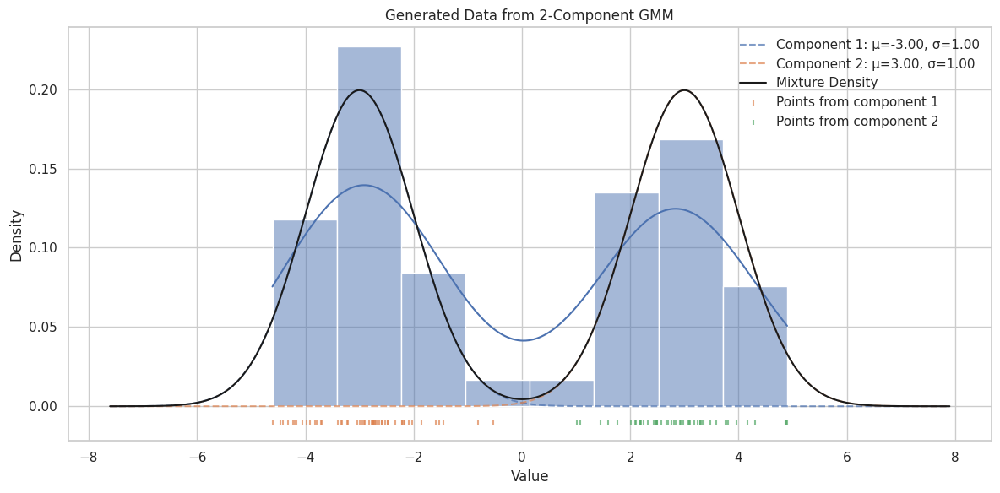


Running Gibbs sampler with fixed variance...


100%|██████████| 2000/2000 [01:12<00:00, 27.71it/s]


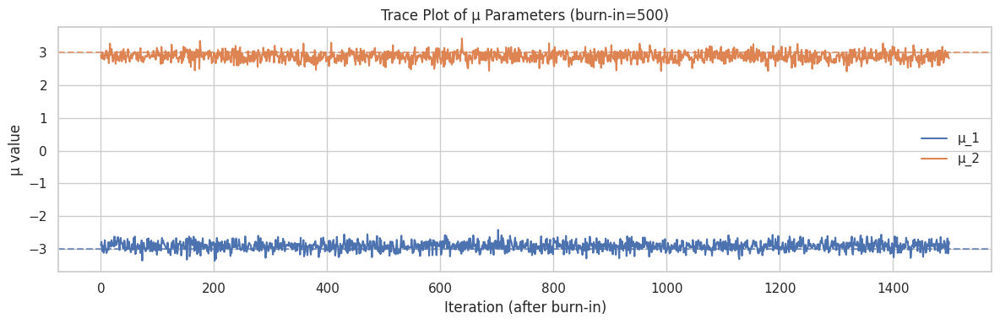

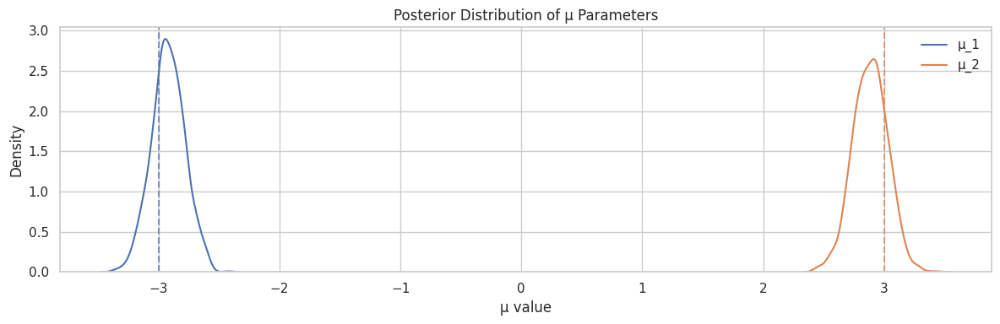

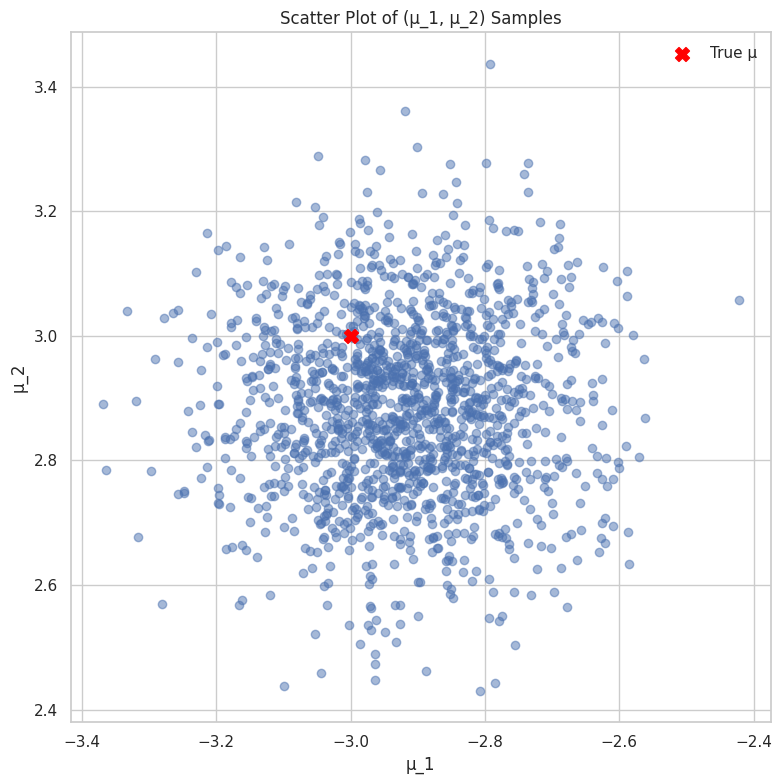

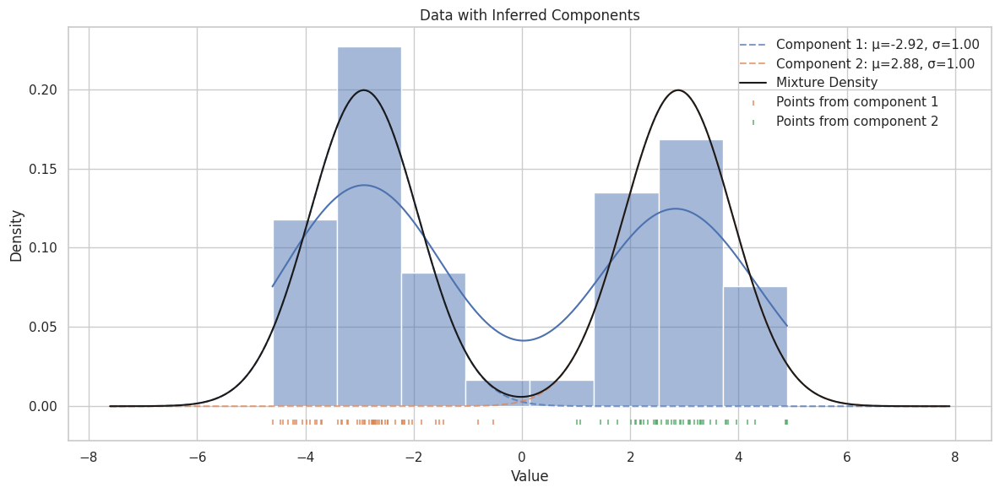


Posterior Summary Statistics:
----------------------------
Component 1:
  Mean μ_1: -2.9201
  95% Credible Interval: [-3.1961, -2.6412]
  Proportion of observations: 0.5300

Component 2:
  Mean μ_2: 2.8849
  95% Credible Interval: [2.5914, 3.1608]
  Proportion of observations: 0.4700



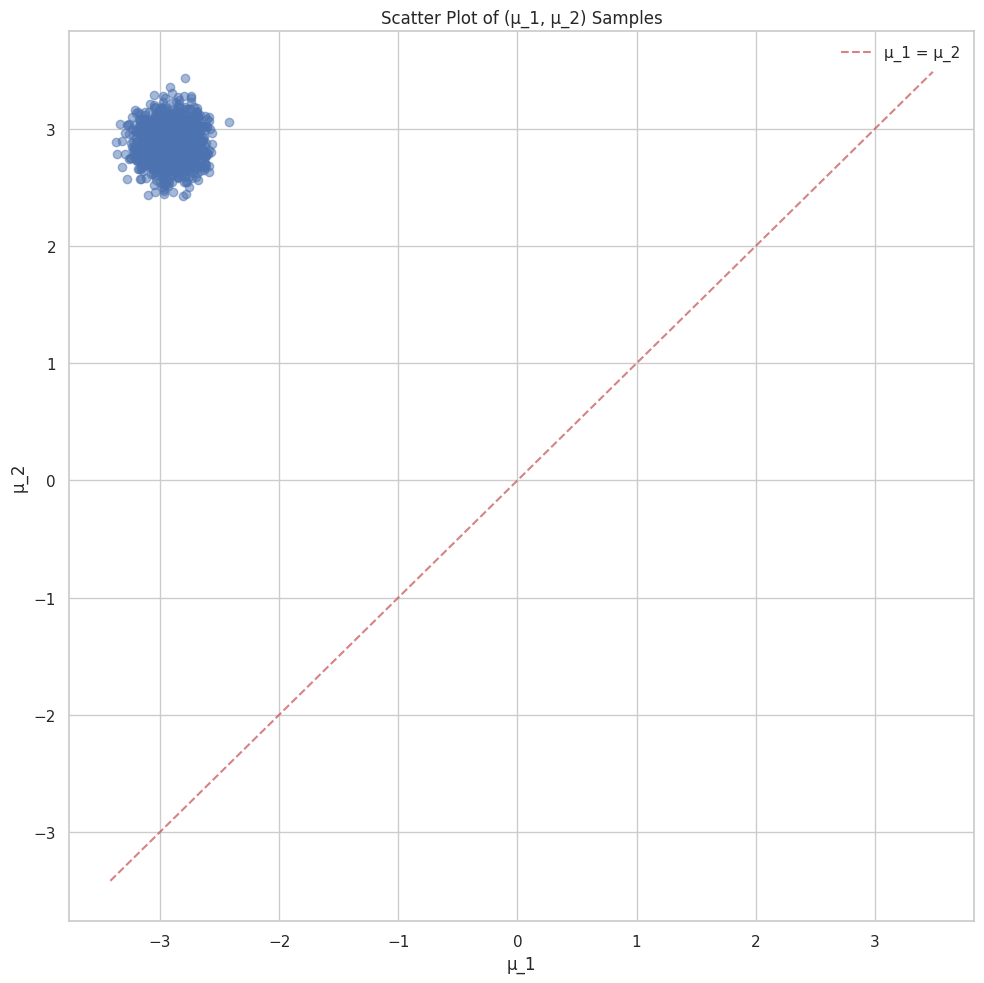

Proportion of samples with μ_1 > μ_2: 0.0000
No significant label switching detected.

Running Gibbs sampler with unknown variance...


100%|██████████| 2000/2000 [01:10<00:00, 28.46it/s]


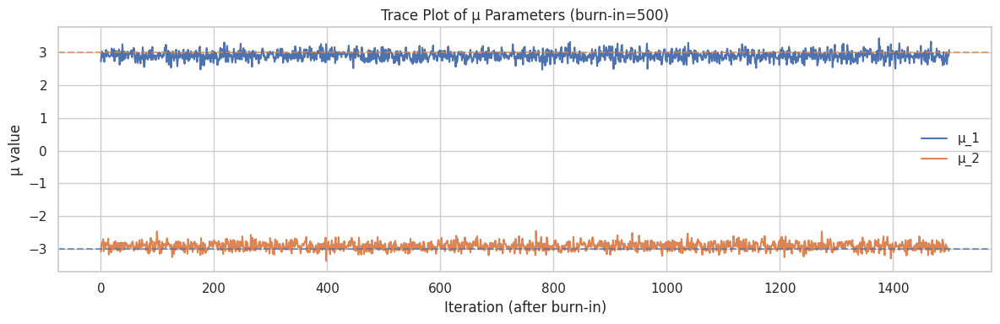

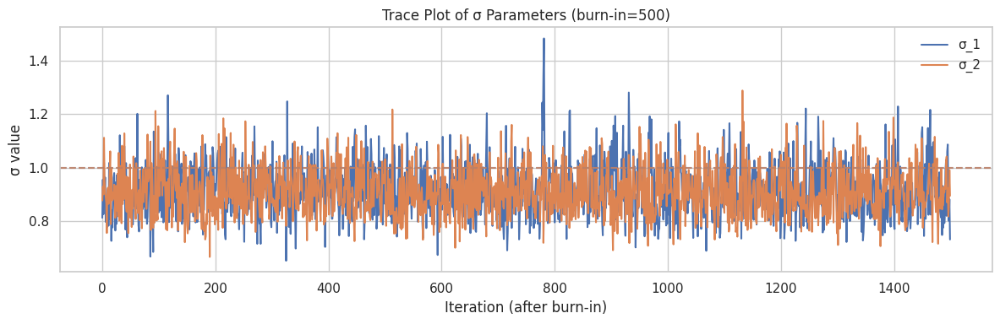

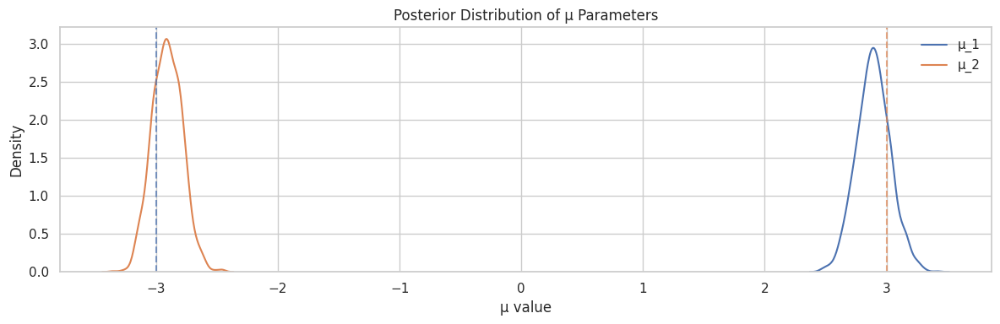

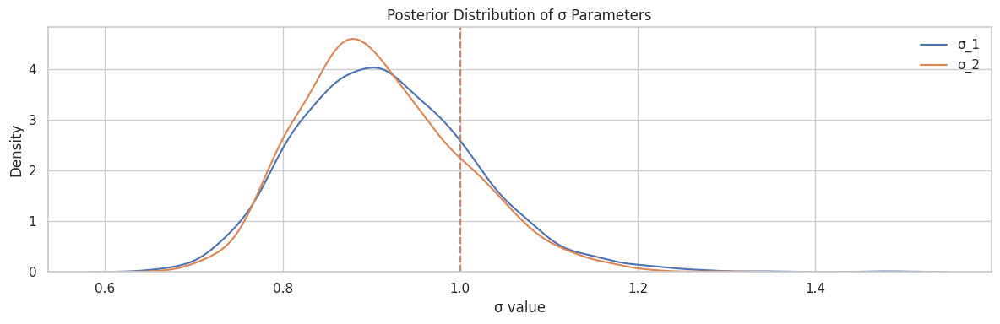

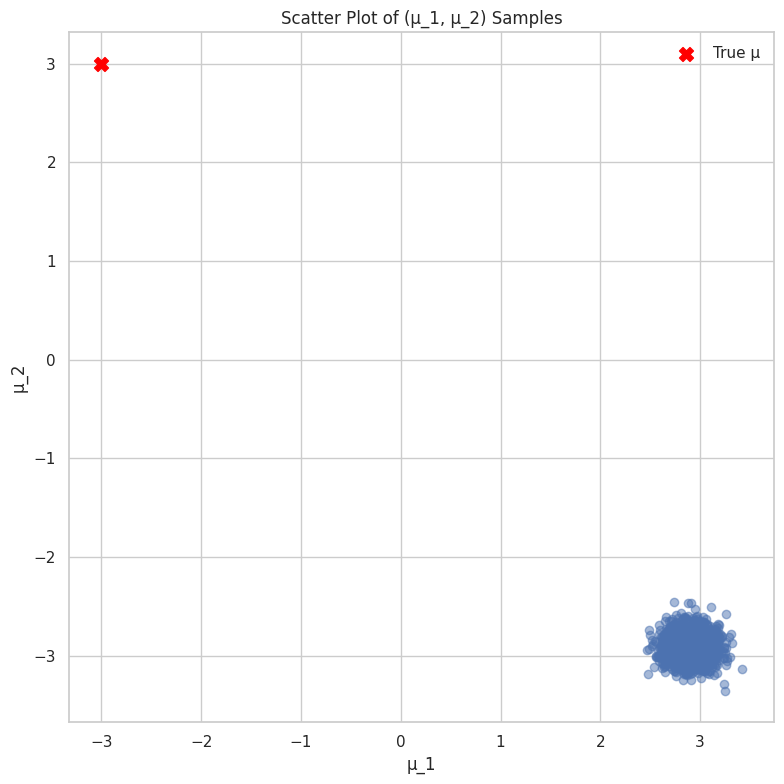

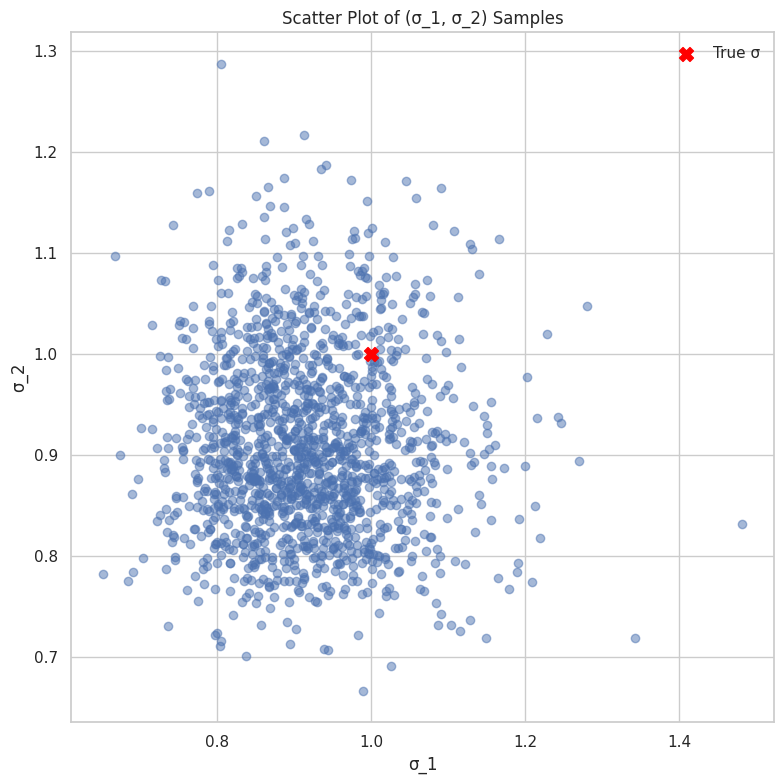

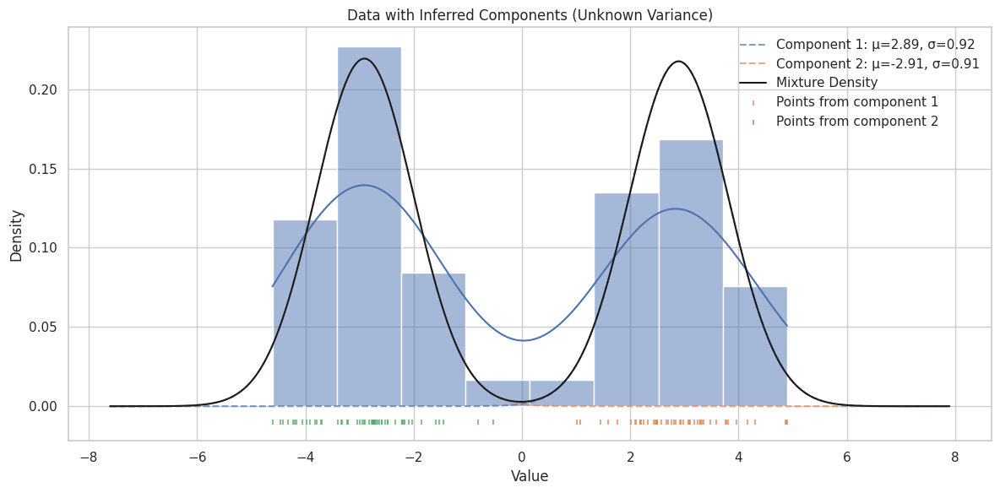


Posterior Summary Statistics:
----------------------------
Component 1:
  Mean μ_1: 2.8933
  95% Credible Interval for μ_1: [2.6215, 3.1735]
  Std Dev σ_1: 0.9164
  95% Credible Interval for σ_1: [0.7450, 1.1304]

Component 2:
  Mean μ_2: -2.9093
  95% Credible Interval for μ_2: [-3.1447, -2.6624]
  Std Dev σ_2: 0.9093
  95% Credible Interval for σ_2: [0.7610, 1.1094]


Running Gibbs sampler with unknown weights...


100%|██████████| 2000/2000 [01:13<00:00, 27.18it/s]


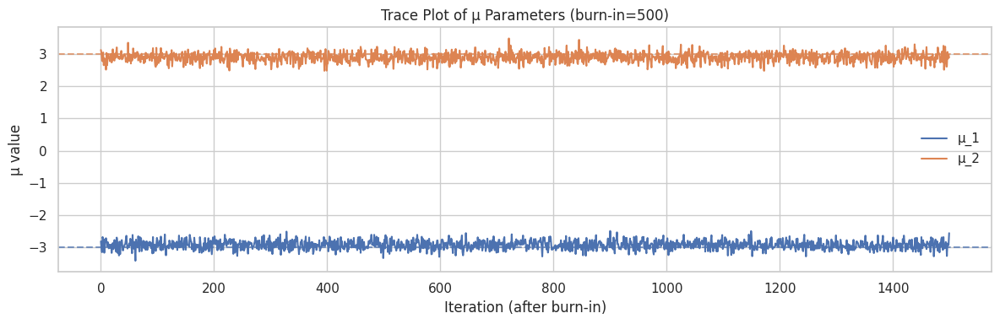

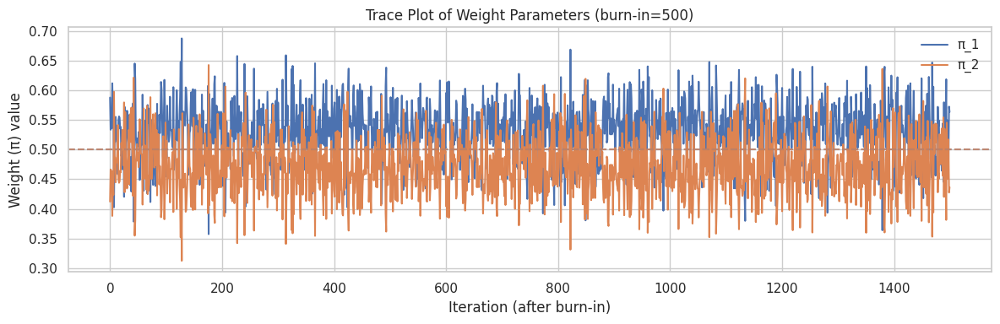

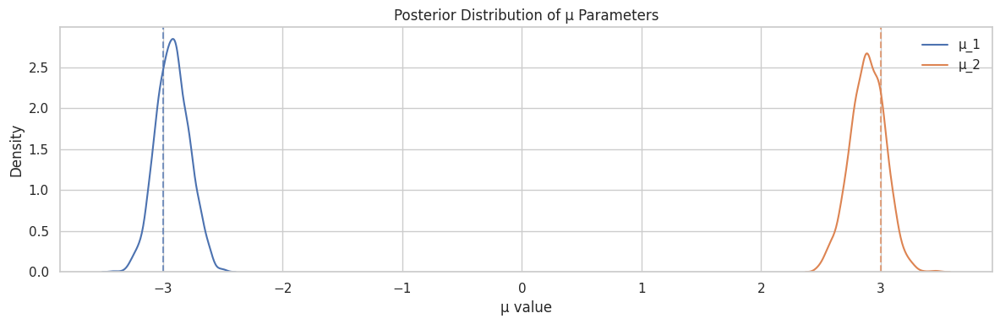

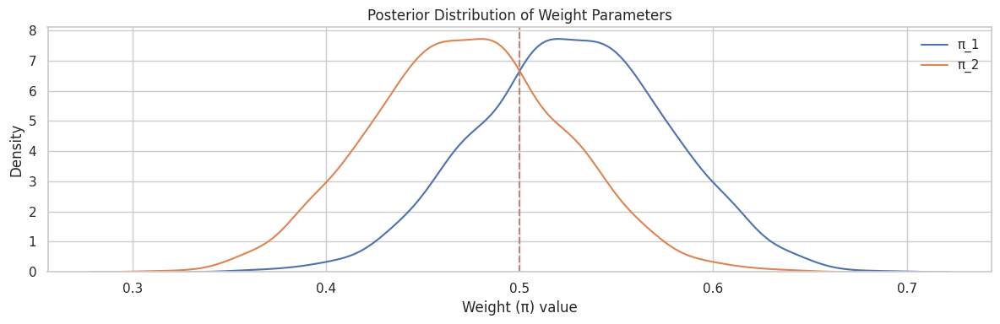

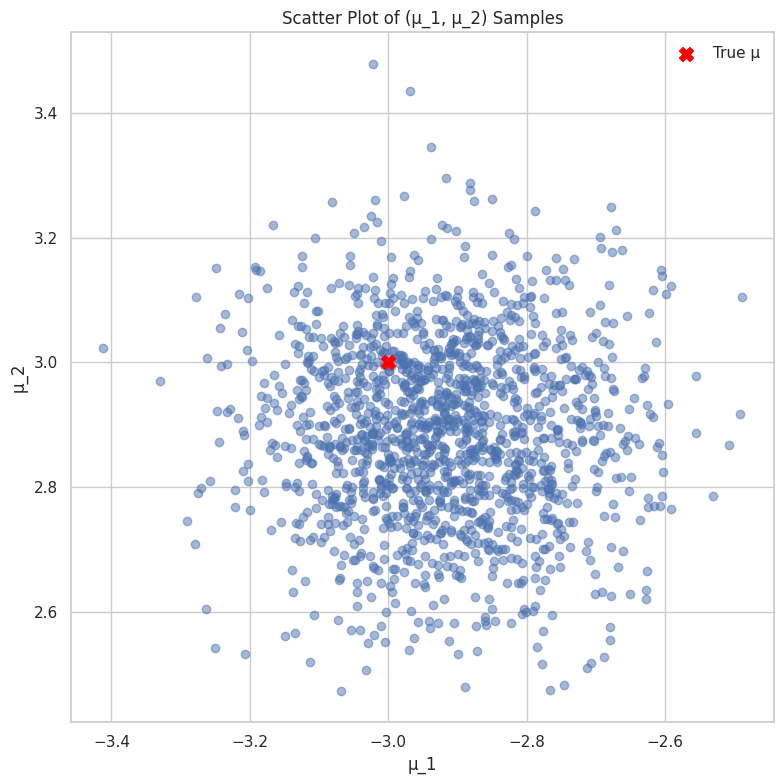

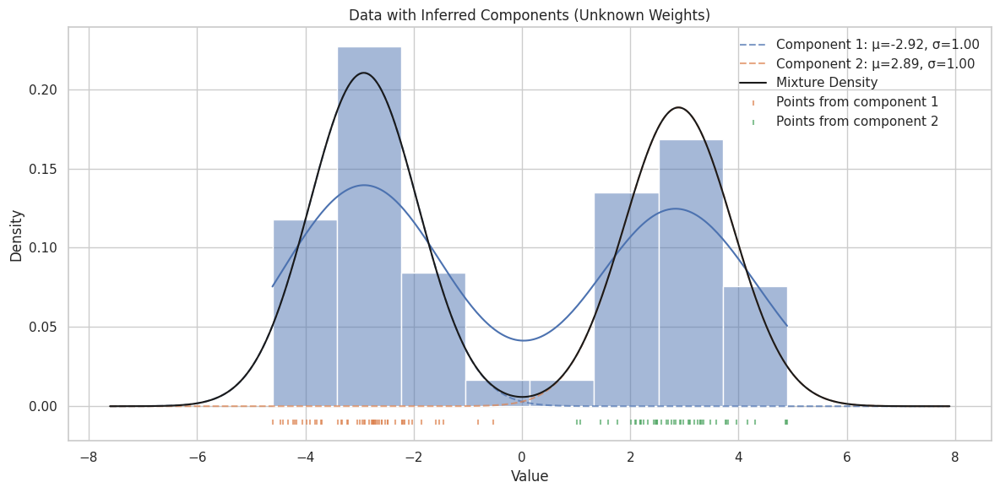


Posterior Summary Statistics:
----------------------------
Component 1:
  Mean μ_1: -2.9207
  95% Credible Interval for μ_1: [-3.1855, -2.6493]
  Weight π_1: 0.5274
  95% Credible Interval for π_1: [0.4323, 0.6210]

Component 2:
  Mean μ_2: 2.8905
  95% Credible Interval for μ_2: [2.5854, 3.1689]
  Weight π_2: 0.4726
  95% Credible Interval for π_2: [0.3790, 0.5677]


Running full Gibbs sampler...


100%|██████████| 2000/2000 [01:13<00:00, 27.11it/s]


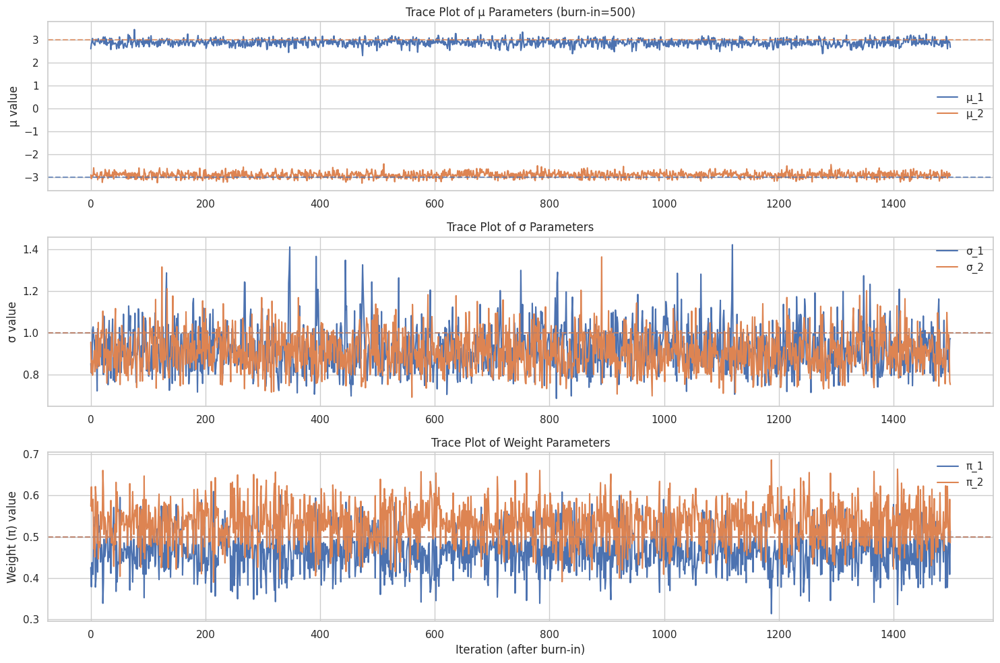

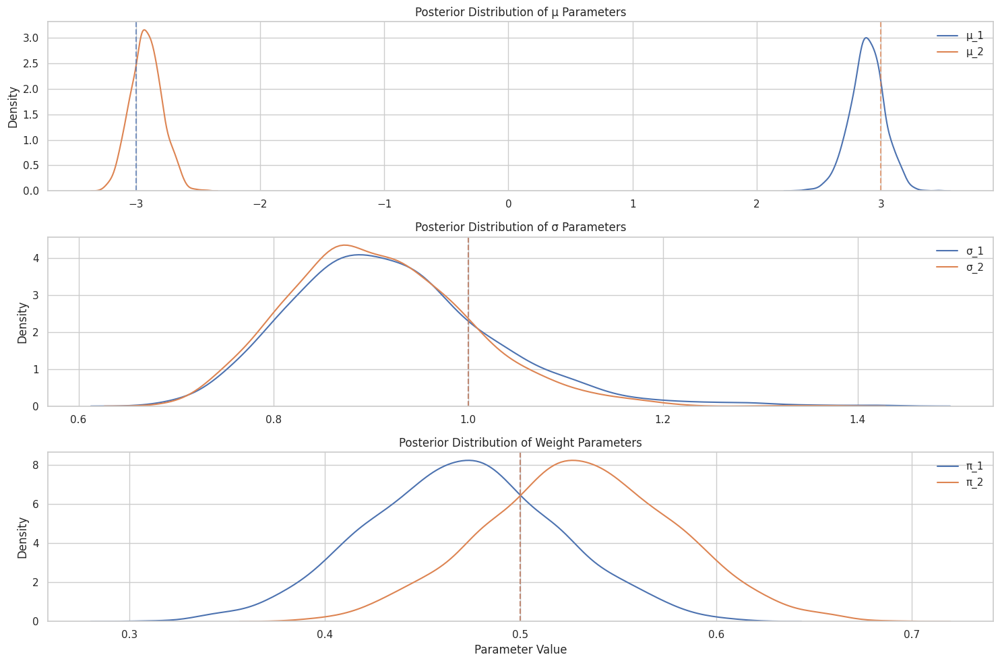

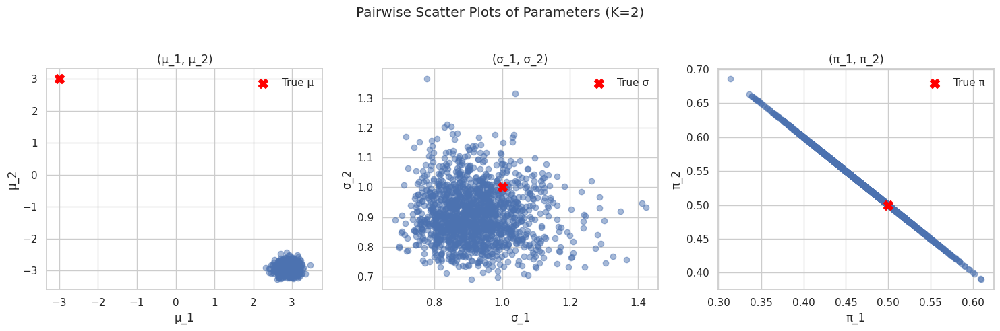

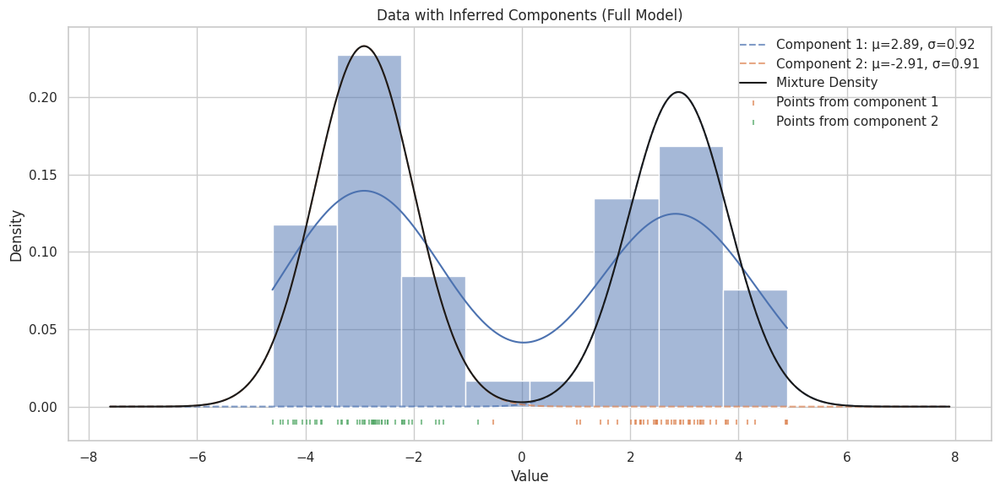


Posterior Summary Statistics:
----------------------------
Component 1:
  Mean μ_1: 2.8900
  95% Credible Interval for μ_1: [2.6101, 3.1612]
  Std Dev σ_1: 0.9209
  95% Credible Interval for σ_1: [0.7543, 1.1587]
  Weight π_1: 0.4694
  95% Credible Interval for π_1: [0.3764, 0.5647]

Component 2:
  Mean μ_2: -2.9150
  95% Credible Interval for μ_2: [-3.1520, -2.6590]
  Std Dev σ_2: 0.9084
  95% Credible Interval for σ_2: [0.7505, 1.1094]
  Weight π_2: 0.5306
  95% Credible Interval for π_2: [0.4353, 0.6236]



In [20]:
# Main execution - example usage
if __name__ == "__main__":
    # 1. Simulate data from a 2-component GMM with well-separated means
    n = 100
    K = 2
    true_mu = np.array([-3.0, 3.0])  # Well-separated means
    sigma = 1.0
    weights = np.array([0.5, 0.5])  # Equal weights (1/K)

    y, z_true = generate_gmm_data(n, K, true_mu, sigma, weights)

    # Plot the generated data
    plot_gmm_data(y, z_true, true_mu, sigma, weights,
                  title="Generated Data from 2-Component GMM")

    # 2. Run Gibbs sampler for fixed variance model
    print("\nRunning Gibbs sampler with fixed variance...")
    n_iter = 2000
    mu_samples, z_samples = gibbs_sampler_gmm_fixed_sigma(y, K, n_iter,
                                                         mu_prior_mean=0,
                                                         mu_prior_var=100)

    # 3. Analyze results and examine label switching
    burnin = 500
    mu_posterior, z_final = analyze_gibbs_results(y, mu_samples, z_samples,
                                                 burnin=burnin, true_mu=true_mu)

    # 4. Examine label switching phenomenon
    mu_relabeled = examine_label_switching(mu_samples, K, burnin)

    # 5. Run Gibbs sampler with unknown variance
    print("\nRunning Gibbs sampler with unknown variance...")
    mu_samples_uv, sigma_samples, z_samples_uv = gibbs_sampler_gmm_unknown_sigma(
        y, K, n_iter, mu_prior_mean=0, mu_prior_var=100,
        sigma_prior_alpha=2, sigma_prior_beta=1
    )

    # 6. Analyze results for unknown variance model
    mu_posterior_uv, sigma_posterior, z_final_uv = analyze_gibbs_results_unknown_sigma(
        y, mu_samples_uv, sigma_samples, z_samples_uv,
        burnin=burnin, true_mu=true_mu, true_sigma=np.ones(K)
    )

    # 7. Run Gibbs sampler with unknown weights
    print("\nRunning Gibbs sampler with unknown weights...")
    mu_samples_uw, weight_samples, z_samples_uw = gibbs_sampler_gmm_unknown_weights(
        y, K, n_iter, mu_prior_mean=0, mu_prior_var=100,
        weight_prior_alpha=1
    )

    # 8. Analyze results for unknown weights model
    mu_posterior_uw, weight_posterior, z_final_uw = analyze_gibbs_results_unknown_weights(
        y, mu_samples_uw, weight_samples, z_samples_uw,
        burnin=burnin, true_mu=true_mu, true_weights=weights
    )

    # 9. Run full Gibbs sampler with unknown means, variances, and weights
    print("\nRunning full Gibbs sampler...")
    mu_samples_full, sigma_samples_full, weight_samples_full, z_samples_full = gibbs_sampler_gmm_full(
        y, K, n_iter, mu_prior_mean=0, mu_prior_var=100,
        sigma_prior_alpha=2, sigma_prior_beta=1,
        weight_prior_alpha=1
    )

    # 10. Analyze results for full model
    results_full = analyze_gibbs_results_full(
        y, mu_samples_full, sigma_samples_full, weight_samples_full, z_samples_full,
        burnin=burnin, true_mu=true_mu, true_sigma=np.ones(K), true_weights=weights
    )

# ABC for Network Models

The model described is an Exponential Random Graph Model (ERGM):

$$p(x|\theta) = \frac{1}{Z(\theta)} \exp(\theta^T S(x))$$

Where:
- $x = (x_{ij})_{i,j=1,...,n}$ is a binary adjacency matrix
- $S(x)$ is a summary statistic vector
- $Z(\theta)$ is the normalizing constant
- $\theta$ is the parameter vector

For the specified summaries:
- $S_1(x) = \sum x_{ij}$ (total number of connections)
- $S_2(x) = \text{Number of individuals with 3 or more connections}$

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from tqdm import tqdm

def compute_summary_stats(x):
    """Compute the summary statistics for a given adjacency matrix"""
    n = x.shape[0]
    # S1: Total number of connections
    S1 = np.sum(x)

    # S2: Number of individuals with 3+ connections
    degrees = np.sum(x, axis=1)  # Row sums give node degrees
    S2 = np.sum(degrees >= 3)

    return np.array([S1, S2])

def log_unnormalized_prob(x, theta):
    """Compute the unnormalized log probability"""
    stats = compute_summary_stats(x)
    return np.dot(theta, stats)

def plot_network(adj_matrix, title=None):
    """Plot a network from its adjacency matrix"""
    G = nx.from_numpy_array(adj_matrix)
    plt.figure(figsize=(10, 8))

    # Compute position for better visualization
    pos = nx.spring_layout(G, seed=42)

    # Node colors based on degree
    degrees = [G.degree(n) for n in G.nodes]
    node_colors = ['red' if d >= 3 else 'skyblue' for d in degrees]

    # Draw the network
    nx.draw_networkx(G, pos=pos, node_color=node_colors, with_labels=True,
                    node_size=500, font_size=10, font_weight='bold')

    if title:
        plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Print stats
    stats = compute_summary_stats(adj_matrix)
    print(f"Total connections: {stats[0]}")
    print(f"Nodes with 3+ connections: {stats[1]}")
    return G

## 1. Simulating from the ERGM

Since direct sampling is difficult due to the normalizing constant $Z(\theta)$, we'll implement a Metropolis-Hastings algorithm to simulate from the model:

In [22]:
def metropolis_hastings_network(n, theta, n_iter=10000, burnin=1000):
    """
    Simulate a network using Metropolis-Hastings

    Parameters:
    -----------
    n : int
        Number of nodes
    theta : array
        Parameter vector [θ₁, θ₂]
    n_iter : int
        Number of iterations
    burnin : int
        Number of burnin iterations

    Returns:
    --------
    x : array
        Adjacency matrix of the simulated network
    """
    # Initialize with an empty network
    x = np.zeros((n, n), dtype=int)

    # Ensure symmetry (undirected graph)
    for i in range(n):
        for j in range(i+1, n):
            if np.random.random() < 0.5:
                x[i, j] = x[j, i] = 1

    # Current log probability
    current_log_prob = log_unnormalized_prob(x, theta)

    # Store samples after burnin
    samples = []

    # Run MCMC
    for t in tqdm(range(n_iter)):
        # Propose a new state by flipping a random edge
        i, j = np.random.randint(0, n, 2)
        if i == j:  # Skip self-loops
            continue

        # Flip the edge
        x_prop = x.copy()
        x_prop[i, j] = x_prop[j, i] = 1 - x[i, j]

        # Compute acceptance probability
        prop_log_prob = log_unnormalized_prob(x_prop, theta)
        log_accept_ratio = prop_log_prob - current_log_prob

        # Accept or reject
        if np.log(np.random.random()) < log_accept_ratio:
            x = x_prop
            current_log_prob = prop_log_prob

        # Store sample after burnin
        if t >= burnin:
            samples.append(x.copy())

    # Return the last sample
    return x, samples

## Alternative: Gibbs Sampling Approach

We can also implement Gibbs sampling which may be more efficient for this model:

In [23]:
def gibbs_sampler_network(n, theta, n_iter=10000, burnin=1000):
    """
    Simulate a network using Gibbs sampling

    Parameters:
    -----------
    n : int
        Number of nodes
    theta : array
        Parameter vector [θ₁, θ₂]
    n_iter : int
        Number of iterations
    burnin : int
        Number of burnin iterations

    Returns:
    --------
    x : array
        Adjacency matrix of the simulated network
    """
    # Initialize with empty network
    x = np.zeros((n, n), dtype=int)

    # Ensure symmetry (undirected graph)
    for i in range(n):
        for j in range(i+1, n):
            if np.random.random() < 0.5:
                x[i, j] = x[j, i] = 1

    # Store samples after burnin
    samples = []

    # Run Gibbs sampler
    for t in tqdm(range(n_iter)):
        # Scan through all possible edges
        for i in range(n):
            for j in range(i+1, n):  # Ensure each edge is considered once
                # Remove current edge state
                x_old = x[i, j]
                x[i, j] = x[j, i] = 0
                stats_0 = compute_summary_stats(x)
                log_prob_0 = np.dot(theta, stats_0)

                # Add edge
                x[i, j] = x[j, i] = 1
                stats_1 = compute_summary_stats(x)
                log_prob_1 = np.dot(theta, stats_1)

                # Calculate probability of edge presence
                prob_edge = 1 / (1 + np.exp(log_prob_0 - log_prob_1))

                # Sample edge state
                edge_state = int(np.random.random() < prob_edge)
                x[i, j] = x[j, i] = edge_state

        # Store sample after burnin
        if t >= burnin:
            samples.append(x.copy())

    # Return the last sample
    return x, samples

Simulating network with Metropolis-Hastings...


100%|██████████| 20000/20000 [00:01<00:00, 13795.97it/s]


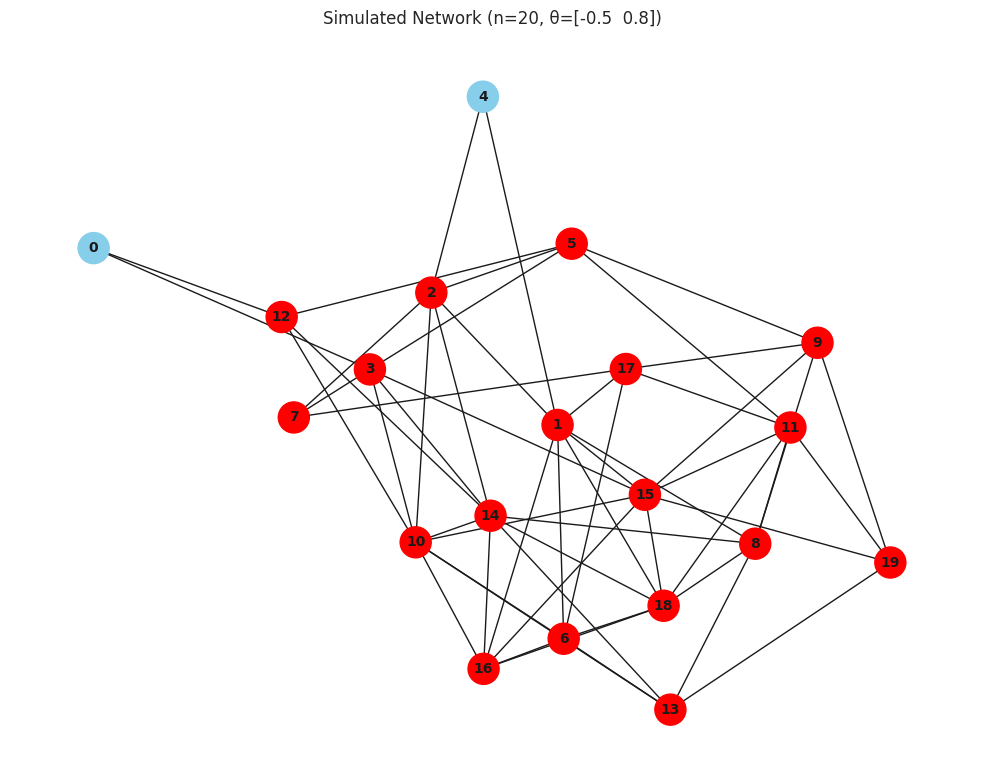

Total connections: 110
Nodes with 3+ connections: 18

Simulating network with Gibbs sampling...


100%|██████████| 2000/2000 [00:25<00:00, 77.54it/s] 


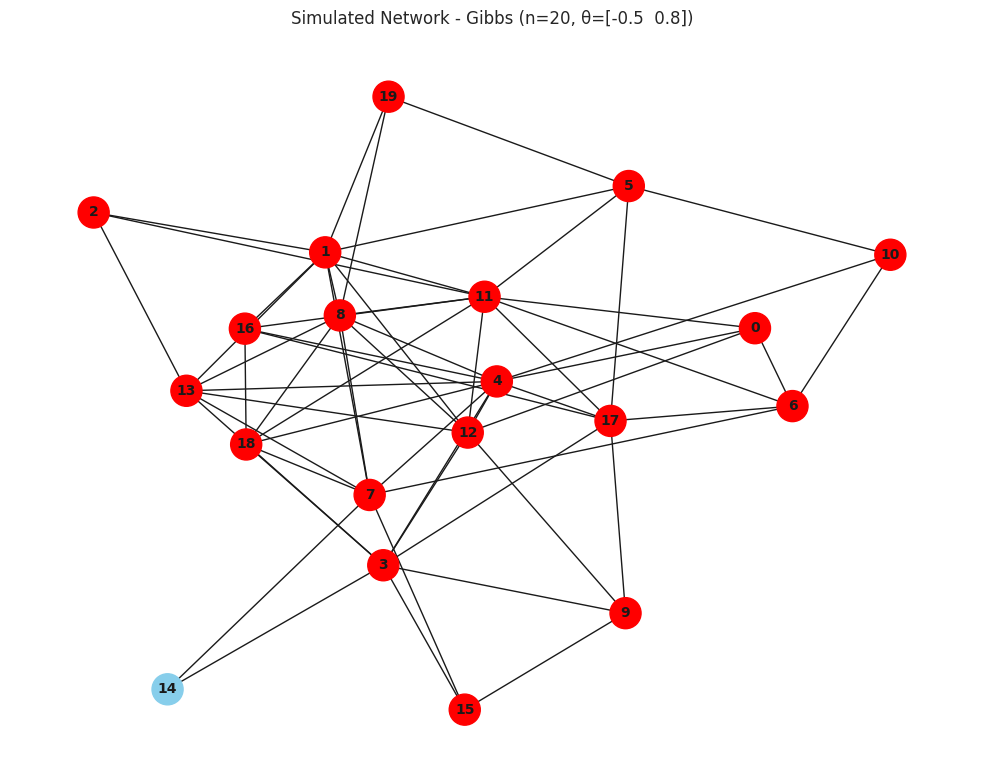

Total connections: 118
Nodes with 3+ connections: 19


In [24]:
# Simulate a network with n=20
n = 20
theta = np.array([-0.5, 0.8])  # Example parameter values
print("Simulating network with Metropolis-Hastings...")
x_sim, samples = metropolis_hastings_network(n, theta, n_iter=20000, burnin=5000)

# Plot the simulated network
G = plot_network(x_sim, title=f"Simulated Network (n={n}, θ={theta})")

# Compare with Gibbs sampling method
print("\nSimulating network with Gibbs sampling...")
x_gibbs, samples_gibbs = gibbs_sampler_network(n, theta, n_iter=2000, burnin=500)

plot_network(x_gibbs, title=f"Simulated Network - Gibbs (n={n}, θ={theta})")

## 2. ABC Algorithm for Parameter Estimation

Approximate Bayesian Computation (ABC) is useful here because the likelihood is intractable due to the normalizing constant $Z(\theta)$.

I'll implement a rejection ABC algorithm:

In [25]:
def abc_rejection(observed_x, n_samples=1000, epsilon=0.1, theta_prior_range=(-2, 2)):
    """
    ABC rejection algorithm for parameter estimation

    Parameters:
    -----------
    observed_x : array
        Observed network adjacency matrix
    n_samples : int
        Number of ABC samples to generate
    epsilon : float
        ABC acceptance threshold
    theta_prior_range : tuple
        Range for uniform prior on each theta component

    Returns:
    --------
    accepted_theta : array
        Accepted parameter samples
    """
    n = observed_x.shape[0]
    observed_stats = compute_summary_stats(observed_x)

    # Normalize the observed statistics for better distance computation
    obs_stats_norm = observed_stats / np.array([n*(n-1)/2, n])

    # Storage for accepted parameters
    accepted_theta = []

    # Progress bar
    pbar = tqdm(total=n_samples)

    while len(accepted_theta) < n_samples:
        # Sample from prior
        theta = np.random.uniform(theta_prior_range[0], theta_prior_range[1], 2)

        # Simulate network using Gibbs sampler (faster for a single sample)
        simulated_x, _ = gibbs_sampler_network(n, theta, n_iter=1000, burnin=200)

        # Compute summary statistics
        sim_stats = compute_summary_stats(simulated_x)
        sim_stats_norm = sim_stats / np.array([n*(n-1)/2, n])

        # Compute distance
        distance = np.linalg.norm(sim_stats_norm - obs_stats_norm)

        # Accept or reject
        if distance < epsilon:
            accepted_theta.append(theta)
            pbar.update(1)

    pbar.close()
    return np.array(accepted_theta)

In [ ]:
# Demonstrate ABC with a "synthetic observed network"
# (Using our previously simulated network as the observed data)
true_theta = np.array([-0.5, 0.8])
observed_network = x_sim

print("Running ABC inference...")
abc_samples = abc_rejection(observed_network, n_samples=200, epsilon=0.15)

# Plot the posterior distribution
plt.figure(figsize=(10, 8))
plt.scatter(abc_samples[:, 0], abc_samples[:, 1], alpha=0.6)
plt.axvline(true_theta[0], color='red', linestyle='--')
plt.axhline(true_theta[1], color='red', linestyle='--')
plt.xlabel(r'$\theta_1$ (Total connections)')
plt.ylabel(r'$\theta_2$ (Nodes with 3+ connections)')
plt.title('ABC Posterior Sample')
plt.grid(True)
plt.show()

# Plot marginal posteriors
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(abc_samples[:, 0], bins=20, alpha=0.7, density=True)
plt.axvline(true_theta[0], color='red', linestyle='--')
plt.xlabel(r'$\theta_1$')
plt.title('Marginal Posterior for θ₁')

plt.subplot(1, 2, 2)
plt.hist(abc_samples[:, 1], bins=20, alpha=0.7, density=True)
plt.axvline(true_theta[1], color='red', linestyle='--')
plt.xlabel(r'$\theta_2$')
plt.title('Marginal Posterior for θ₂')
plt.tight_layout()
plt.show()

Running ABC inference...


100%|██████████| 1000/1000 [00:14<00:00, 68.22it/s]

100%|██████████| 1000/1000 [00:15<00:00, 65.02it/s]

100%|██████████| 1000/1000 [00:10<00:00, 96.03it/s]

100%|██████████| 1000/1000 [00:13<00:00, 76.28it/s]

100%|██████████| 1000/1000 [00:11<00:00, 88.48it/s]

100%|██████████| 1000/1000 [00:11<00:00, 87.01it/s]

100%|██████████| 1000/1000 [00:11<00:00, 86.18it/s]

100%|██████████| 1000/1000 [00:11<00:00, 84.28it/s]

100%|██████████| 1000/1000 [00:18<00:00, 54.97it/s]

100%|██████████| 1000/1000 [00:12<00:00, 82.23it/s]

100%|██████████| 1000/1000 [00:12<00:00, 80.40it/s]

100%|██████████| 1000/1000 [00:12<00:00, 79.14it/s]

100%|██████████| 1000/1000 [00:15<00:00, 63.35it/s]

100%|██████████| 1000/1000 [00:12<00:00, 79.08it/s]

100%|██████████| 1000/1000 [00:12<00:00, 81.99it/s]

100%|██████████| 1000/1000 [00:12<00:00, 81.35it/s]

 46%|████▋     | 465/1000 [00:05<00:05, 90.36it/s]


## Alternative: ABC-MCMC Algorithm

For better efficiency, we can use ABC-MCMC which combines MCMC with ABC:

In [ ]:
def abc_mcmc(observed_x, n_samples=1000, epsilon=0.1, proposal_sd=0.1, theta_prior_range=(-2, 2)):
    """
    ABC-MCMC algorithm for parameter estimation

    Parameters:
    -----------
    observed_x : array
        Observed network adjacency matrix
    n_samples : int
        Number of ABC samples to generate
    epsilon : float
        ABC acceptance threshold
    proposal_sd : float
        Standard deviation for the Gaussian proposal
    theta_prior_range : tuple
        Range for uniform prior on each theta component

    Returns:
    --------
    accepted_theta : array
        Accepted parameter samples
    """
    n = observed_x.shape[0]
    observed_stats = compute_summary_stats(observed_x)
    obs_stats_norm = observed_stats / np.array([n*(n-1)/2, n])

    # Storage for accepted parameters
    accepted_theta = []

    # Initialize with a random parameter value
    current_theta = np.random.uniform(theta_prior_range[0], theta_prior_range[1], 2)

    # Simulate network for initial theta
    current_x, _ = gibbs_sampler_network(n, current_theta, n_iter=1000, burnin=200)
    current_stats = compute_summary_stats(current_x)
    current_stats_norm = current_stats / np.array([n*(n-1)/2, n])
    current_dist = np.linalg.norm(current_stats_norm - obs_stats_norm)

    # Run MCMC
    pbar = tqdm(total=n_samples)
    while len(accepted_theta) < n_samples:
        # Propose new theta
        proposed_theta = current_theta + np.random.normal(0, proposal_sd, 2)

        # Check prior
        if np.any(proposed_theta < theta_prior_range[0]) or np.any(proposed_theta > theta_prior_range[1]):
            continue  # Reject if outside prior support

        # Simulate network for proposed theta
        proposed_x, _ = gibbs_sampler_network(n, proposed_theta, n_iter=1000, burnin=200)
        proposed_stats = compute_summary_stats(proposed_x)
        proposed_stats_norm = proposed_stats / np.array([n*(n-1)/2, n])
        proposed_dist = np.linalg.norm(proposed_stats_norm - obs_stats_norm)

        # Accept or reject based on ABC criterion
        if proposed_dist < epsilon:
            # Regular MCMC acceptance probability
            accept_prob = min(1, 1)  # Uniform prior and symmetric proposal

            if np.random.random() < accept_prob:
                current_theta = proposed_theta
                current_dist = proposed_dist
                accepted_theta.append(current_theta.copy())
                pbar.update(1)

    pbar.close()
    return np.array(accepted_theta)